<a href="https://colab.research.google.com/github/Nico412-cyber/msci151/blob/main/MIS140_W04_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Welcome to MIS140 Week 04

# Exploratory Data Analysis


# 🏆 Learning Objectives
By the end of this lab, you will be able to:
- Perform univariate analysis for numerical and categorical variables.
- Generate summary statistics and visualize distributions.
- Conduct bivariate and multivariate analysis to examine relationships between variables.



### **Melbourne Housing Market Dataset: Business Insights**  

This dataset provides real estate transaction data for Melbourne, helping to analyze market trends, price fluctuations, and buyer opportunities. It can be used to answer key business and economic questions about Melbourne’s housing market.  

#### **Business Questions**  
1. **Market Trends & Timing**  
   - When did Melbourne's housing market cool down?  
   - Could we have predicted it based on price trends, property sales, rental shifts, or location-based demand?  

2. **Investment & Affordability**  
   - Which suburbs offer the best value for money?  
   - Where are Melbourne’s most expensive and most affordable areas?  
   - Should buyers hold off or purchase now, especially for specific property types (e.g., 2-bedroom apartments in Northcote)?  

3. **Market Dynamics & Demand Shifts**  
   - Are more properties selling in outer suburbs compared to inner-city areas?  
   - How do factors like council areas, regions, and property types affect market movement?  
   - What patterns emerge in sales vs. unsold properties?  

### **Data Dictionary for Selected Columns**

| Column         | Description |
|---------------|------------|
| **Suburb** | Name of the suburb where the property is located. |
| **Address** | Full address of the property. |
| **Rooms** | Total number of rooms in the property. |
| **Type** | Property type: <br> - `h` (house, cottage, villa, semi, terrace) <br> - `u` (unit, duplex) <br> - `t` (townhouse) <br> - `dev site` (development site) <br> - `o res` (other residential) |
| **Price** | Sale price of the property in Australian dollars. |
| **Method** | Sale method: e.g., `S` (sold), `SP` (sold prior), `PI` (passed in), `W` (withdrawn), `VB` (vendor bid). |
| **SellerG** | Name of the real estate agency selling the property. |
| **Date** | Date the property was sold. |
| **Postcode** | Postal code of the property's location. |
| **Regionname** | Broad geographic region (e.g., West, North West, North East). |
| **Propertycount** | Total number of properties in the suburb. |
| **Distance** | Distance from the CBD in kilometres. |
| **CouncilArea** | Local governing council for the suburb. |

The dataset **"Melbourne Housing Market"** is available on **Kaggle**:  
**[Melbourne Housing Market Dataset – Kaggle](https://www.kaggle.com/datasets/anthonypino/melbourne-housing-market/data)**  



---

# Pair Programming EDA Journey — *Melbourne Housing Dataset*

| Stage                                       | Business Focus                              | Questions                                                                                                                                                                                                               | Discussion                                                                                                                                                                                                     |
| :------------------------------------------ | :------------------------------------------ | :---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | :-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| **1. Data Inspection**                   | Understand structure and quality            | - What types of variables are in the dataset? <br> - Which columns are complete vs. have missing data? <br> - Are data types appropriate?                                                                               | - Does anything look suspicious in `df.info()` or `df.describe()`? <br> - Which columns will likely need cleaning? <br> - Any duplicated or irrelevant fields?                                                        |
| **2. Data Cleaning**                     | Ensure usable and consistent data           | - Which features have missing or inconsistent values? <br> - How should we treat `BuildingArea`, `YearBuilt`, `Price` missingness? <br> - Should any outliers be removed, capped, or retained?                          | - Is it safe to impute missing values? On what basis? <br> - How might removal or transformation affect downstream analysis? <br> - When do outliers represent business insight vs. data error?                       |
| **3. Univariate Analysis**               | Understand each feature's distribution      | - What is the typical distribution of `Price`, `Landsize`, `Distance`, etc.? <br> - Are there extreme values or skewed distributions? <br> - Which suburbs have the highest property counts?                            | - What does the shape of the distribution suggest (e.g. skewed, multimodal)? <br> - How do measures of central tendency and spread help us interpret housing supply or demand?                                        |
| **4. Bivariate Analysis**                | Explore relationships between two variables | - How does `Price` vary by `Type` or `Regionname`? <br> - Is there a correlation between `Price` and `Distance`? <br> - How does `Landsize` relate to `Price` for houses vs units?                                      | - Which variables are most strongly related to `Price`? <br> - Are relationships consistent across property types or regions? <br> - Could any patterns be confounded by other features (e.g. `Rooms` vs `Landsize`)? |
| **5. Multivariate Analysis**             | Analyse joint effects of multiple variables | - Can we predict `Price` using `Rooms`, `Distance`, `Region`, `BuildingArea`? <br> - Which combination of features best explains housing value? <br> - Are there interactions between `Type`, `Suburb`, and `Landsize`? | - How would multicollinearity affect interpretation or model performance? <br> - What additional variables might improve prediction? <br> - Are there diminishing returns on price for larger land size?              |
| **6. Interpretation & Business Insight** | Translate patterns into strategy            | - When and where did the housing market cool? <br> - What early indicators signalled the shift? <br> - Should one invest in units, townhouses, or detached homes in 2025?                                               | - Which insights are actionable for a home buyer, investor, or policymaker? <br> - What recommendations would you give based on current and historical trends? <br> - Are patterns likely to persist or change? Why?  |

---

### Pair Roles and Discussions

* **Driver**: Write code to load, inspect, filter, summarise, and visualise.
* **Navigator**: Ask guiding questions:

  * *“Why this variable?”*
  * *“What are we assuming?”*
  * *“What’s the business impact?”*
* **Both**: Reflect on:

  * *“What would we recommend to a buyer, seller, or agent based on this?”*

---

# Import Libaries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
import itertools

# Load the Dataset

## Mount Google Drive to Colab

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

## Load Your Data

In [ ]:
# # Replace with the correct file path from your Google Drive
# file_path = 'replace_your_actual_path_to_csv_here'

# # Load the dataset into a pandas DataFrame
# df = pd.read_csv(file_path)

In [ ]:
# url = 'https://raw.githubusercontent.com/ABAL-DU/MIS140_Resources/refs/heads/main/MELBOURNE_HOUSE_PRICES_LESS.csv'
url = 'https://raw.githubusercontent.com/ABAL-DU/MIS140_Resources/refs/heads/main/Melbourne_housing_FULL.csv'
# Load the dataset into a pandas DataFrame
df = pd.read_csv(url)

In [ ]:
df

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,68 Studley St,2,h,NaN,SS,Jellis,3/09/2016,2.5,3067.0,...,1.0,1.0,126.0,NaN,NaN,Yarra City Council,-37.80140,144.99580,Northern Metropolitan,4019.0
1,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra City Council,-37.79960,144.99840,Northern Metropolitan,4019.0
2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra City Council,-37.80790,144.99340,Northern Metropolitan,4019.0
3,Abbotsford,18/659 Victoria St,3,u,NaN,VB,Rounds,4/02/2016,2.5,3067.0,...,2.0,1.0,0.0,NaN,NaN,Yarra City Council,-37.81140,145.01160,Northern Metropolitan,4019.0
4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra City Council,-37.80930,144.99440,Northern Metropolitan,4019.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34852,Yarraville,13 Burns St,4,h,1480000.0,PI,Jas,24/02/2018,6.3,3013.0,...,1.0,3.0,593.0,NaN,NaN,Maribyrnong City Council,-37.81053,144.88467,Western Metropolitan,6543.0
34853,Yarraville,29A Murray St,2,h,888000.0,SP,Sweeney,24/02/2018,6.3,3013.0,...,2.0,1.0,98.0,104.0,2018.0,Maribyrnong City Council,-37.81551,144.88826,Western Metropolitan,6543.0
34854,Yarraville,147A Severn St,2,t,705000.0,S,Jas,24/02/2018,6.3,3013.0,...,1.0,2.0,220.0,120.0,2000.0,Maribyrnong City Council,-37.82286,144.87856,Western Metropolitan,6543.0
34855,Yarraville,12/37 Stephen St,3,h,1140000.0,SP,hockingstuart,24/02/2018,6.3,3013.0,...,NaN,NaN,NaN,NaN,NaN,Maribyrnong City Council,NaN,NaN,Western Metropolitan,6543.0


# Inspect Data

Before any analysis, it is essential to understand the structure and quality of the dataset. A quick and informative first step is to run `df.info()`.

**What to note in `df.info()`:**

* **Row count and column count**: Confirms dataset size and whether expected variables are present.
* **Column names and data types**: Helps identify:

  * Categorical vs numerical variables
  * Unexpected data types (e.g. numbers stored as `object`)
* **Non-null counts**: Reveals missing values and potential data quality issues.
* **Memory usage**: Useful for large datasets—may require optimisation.

**Tip**: Combine this with `df.head()` and `df.describe()` to form a comprehensive understanding of data shape, types, and initial distribution patterns.


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34857 entries, 0 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         34857 non-null  object 
 1   Address        34857 non-null  object 
 2   Rooms          34857 non-null  int64  
 3   Type           34857 non-null  object 
 4   Price          27247 non-null  float64
 5   Method         34857 non-null  object 
 6   SellerG        34857 non-null  object 
 7   Date           34857 non-null  object 
 8   Distance       34856 non-null  float64
 9   Postcode       34856 non-null  float64
 10  Bedroom2       26640 non-null  float64
 11  Bathroom       26631 non-null  float64
 12  Car            26129 non-null  float64
 13  Landsize       23047 non-null  float64
 14  BuildingArea   13742 non-null  float64
 15  YearBuilt      15551 non-null  float64
 16  CouncilArea    34854 non-null  object 
 17  Lattitude      26881 non-null  float64
 18  Longti

In [ ]:
df.isna().sum()

,0
Suburb,0
Address,0
Rooms,0
Type,0
Price,7610
Method,0
SellerG,0
Date,0
Distance,1
Postcode,1


# Clean data

To do:
- Convert `Date` Dtype
- Handle `Price` missing values

In [ ]:
# Convert df['Date'] to datetime64[ns]
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y', errors='raise')

In [ ]:
# Drop rows where 'Price' is missing
df = df.dropna(subset=['Price'])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 27247 entries, 1 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         27247 non-null  object        
 1   Address        27247 non-null  object        
 2   Rooms          27247 non-null  int64         
 3   Type           27247 non-null  object        
 4   Price          27247 non-null  float64       
 5   Method         27247 non-null  object        
 6   SellerG        27247 non-null  object        
 7   Date           27247 non-null  datetime64[ns]
 8   Distance       27246 non-null  float64       
 9   Postcode       27246 non-null  float64       
 10  Bedroom2       20806 non-null  float64       
 11  Bathroom       20800 non-null  float64       
 12  Car            20423 non-null  float64       
 13  Landsize       17982 non-null  float64       
 14  BuildingArea   10656 non-null  float64       
 15  YearBuilt      12084 non

In [ ]:
# Verify missing values are removed
df.isna().sum()

,0
Suburb,0
Address,0
Rooms,0
Type,0
Price,0
Method,0
SellerG,0
Date,0
Distance,1
Postcode,1


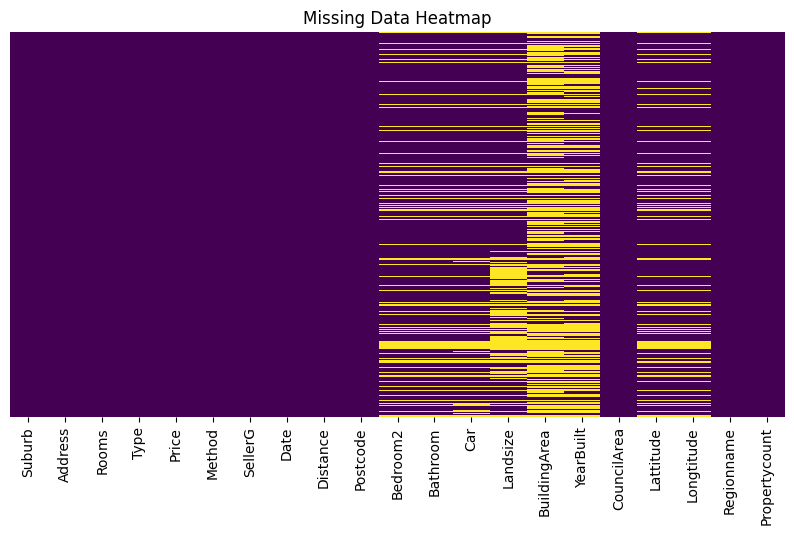

In [ ]:
# Plot missing values as a heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(df.isnull(), cmap="viridis", cbar=False, yticklabels=False)
plt.title("Missing Data Heatmap")
plt.show()


In [ ]:
df.dropna(inplace=True)

<ipython-input-13-c64f9f573c18>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


In [ ]:
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019.0
4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019.0
6,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,Yarra City Council,-37.8072,144.9941,Northern Metropolitan,4019.0
11,Abbotsford,124 Yarra St,3,h,1876000.0,S,Nelson,2016-05-07,2.5,3067.0,...,2.0,0.0,245.0,210.0,1910.0,Yarra City Council,-37.8024,144.9993,Northern Metropolitan,4019.0
14,Abbotsford,98 Charles St,2,h,1636000.0,S,Nelson,2016-10-08,2.5,3067.0,...,1.0,2.0,256.0,107.0,1890.0,Yarra City Council,-37.8060,144.9954,Northern Metropolitan,4019.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8887 entries, 2 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         8887 non-null   object        
 1   Address        8887 non-null   object        
 2   Rooms          8887 non-null   int64         
 3   Type           8887 non-null   object        
 4   Price          8887 non-null   float64       
 5   Method         8887 non-null   object        
 6   SellerG        8887 non-null   object        
 7   Date           8887 non-null   datetime64[ns]
 8   Distance       8887 non-null   float64       
 9   Postcode       8887 non-null   float64       
 10  Bedroom2       8887 non-null   float64       
 11  Bathroom       8887 non-null   float64       
 12  Car            8887 non-null   float64       
 13  Landsize       8887 non-null   float64       
 14  BuildingArea   8887 non-null   float64       
 15  YearBuilt      8887 non-n

# Univariate analysis


**Univariate analysis** examines one variable at a time to understand its distribution, central tendency, and spread.

**Why it matters:**
It helps detect patterns, outliers, skewness, and data quality issues—forming the foundation for deeper analysis.

**What to explore:**

* **Data type**: Categorical or numerical
* **Key statistics**:

  * For numerical: mean, median, mode, min, max, standard deviation
  * For categorical: frequency counts and proportions
* **Distribution shape**: Symmetric, skewed, uniform, bimodal, etc.
* **Outliers and missing values**

**Tools**:
Use `value_counts()`, `describe()`, histograms, box plots, or bar charts to summarise and visualise the variable.


## Numerical variables

### Descriptive statistics

Running `df.describe()` provides a quick statistical summary of numerical (and optionally categorical) variables.

**What’s helpful in `df.describe()`:**

* **count**: Number of non-missing values — reveals missing data issues.
* **mean**: Average — useful for measuring central tendency.
* **std**: Standard deviation — indicates the spread or variability.
* **min / max**: Range of values — helps spot outliers or extreme values.
* **25% / 50% / 75% (quartiles)**:

  * Show data distribution.
  * The **50% (median)** is especially useful if the mean is affected by skew or outliers.
* **IQR (Interquartile Range)**: Can be inferred from 75% – 25%; useful for detecting outliers.

**Tip**: Use alongside visual tools like histograms and box plots for a better understanding of variable distribution.


In [ ]:
# df.describe() no scientific number
pd.options.display.float_format = '{:.2f}'.format
df.describe()

,Rooms,Price,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,8887.00,8887.00,8887,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00
mean,3.10,1092901.63,2017-04-05 23:17:42.540790016,11.20,3111.66,3.08,1.65,1.69,523.48,149.31,1965.75,-37.80,144.99,7475.94
min,1.00,131000.00,2016-02-04 00:00:00,0.00,3000.00,0.00,1.00,0.00,0.00,0.00,1196.00,-38.17,144.42,249.00
25%,2.00,641000.00,2016-09-24 00:00:00,6.40,3044.00,2.00,1.00,1.00,212.00,100.00,1945.00,-37.86,144.92,4382.50
50%,3.00,900000.00,2017-05-13 00:00:00,10.20,3084.00,3.00,2.00,2.00,478.00,132.00,1970.00,-37.80,145.00,6567.00
75%,4.00,1345000.00,2017-09-16 00:00:00,13.90,3150.00,4.00,2.00,2.00,652.00,180.00,2000.00,-37.75,145.06,10331.00
max,12.00,9000000.00,2018-03-17 00:00:00,47.40,3977.00,12.00,9.00,10.00,42800.00,3112.00,2019.00,-37.41,145.53,21650.00
std,0.96,679381.90,NaN,6.81,112.61,0.97,0.72,0.98,1061.32,87.93,37.04,0.09,0.12,4375.02


### Visualise distributions

<Axes: xlabel='Price', ylabel='Count'>

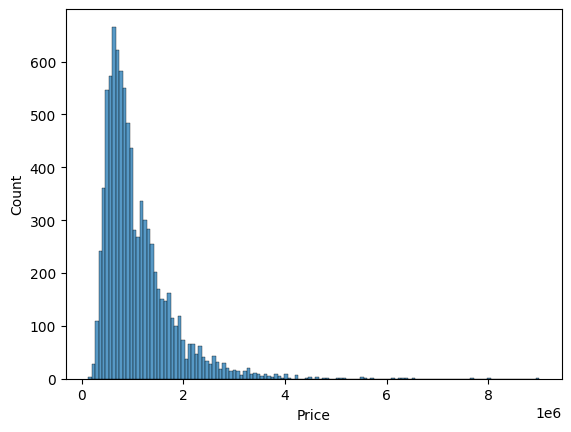

In [ ]:
# Quick histplot
sns.histplot(data=df, x='Price')

**Problems?**
- small chart, too many bins (grouped data, interval)
- no title
- unclear x-axis labels, interval

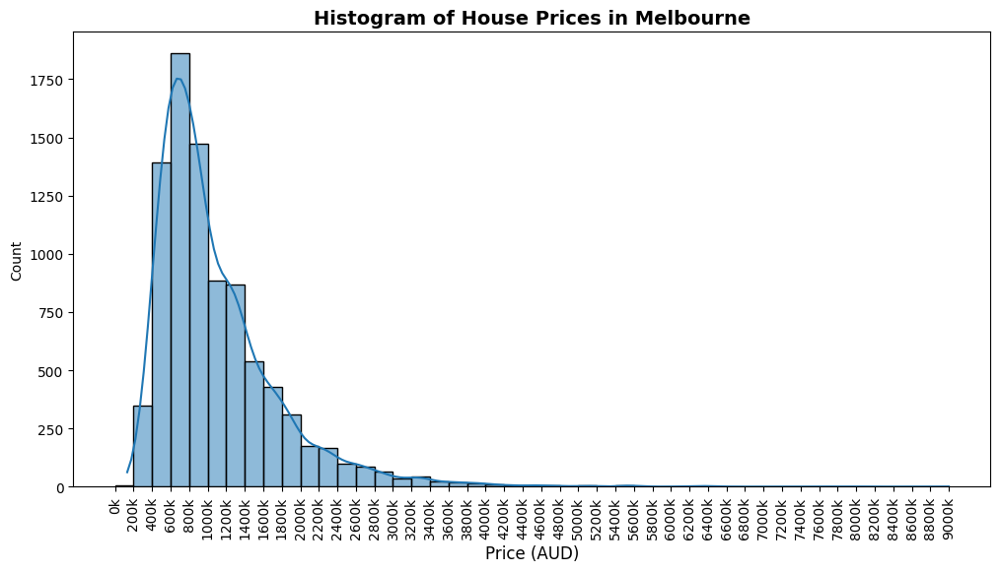

In [ ]:
# Create a professional histogram of house prices with clearly labeled x-axis
plt.figure(figsize=(12, 6))

# Define bin edges starting from 0 in 200k increments
bin_edges = range(0, int(df['Price'].max()) + 200000, 200000)

# Plot the histogram with defined bins
sns.histplot(data=df, x="Price", bins=bin_edges, kde=True)

# Set title and labels
plt.title("Histogram of House Prices in Melbourne", fontsize=14, fontweight='bold')
plt.xlabel("Price (AUD)", fontsize=12)

# Format x-axis labels as '0', '200k', '400k', etc.
plt.xticks(bin_edges, [f"{int(x/1000)}k" for x in bin_edges], rotation=90)

# Show the plot
plt.show()


<Axes: xlabel='Price'>

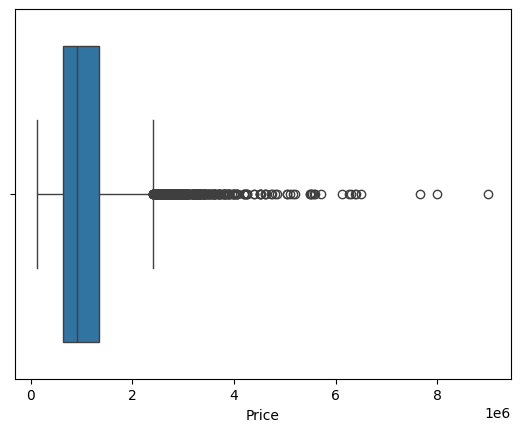

In [ ]:
# Quick horizontal boxplot
sns.boxplot(data=df, x='Price')

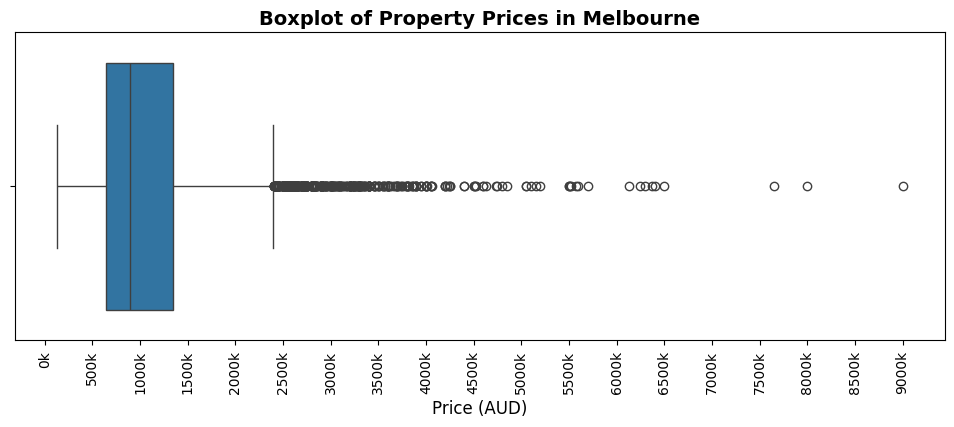

In [ ]:
# Create a professional horizontal boxplot for 'Price' with k-format x-axis
plt.figure(figsize=(12, 4))

# Plot the boxplot
sns.boxplot(data=df, x='Price')

# Set title and labels
plt.title("Boxplot of Property Prices in Melbourne", fontsize=14, fontweight='bold')
plt.xlabel("Price (AUD)", fontsize=12)

# Format x-axis labels in 'k' notation (e.g., 500k instead of 500000)
plt.xticks(ticks=range(0, int(df['Price'].max()) + 500000, 500000),
           labels=[f"{int(x/1000)}k" for x in range(0, int(df['Price'].max()) + 500000, 500000)],
           rotation=90)

# Show the plot
plt.show()


<Axes: ylabel='Price'>

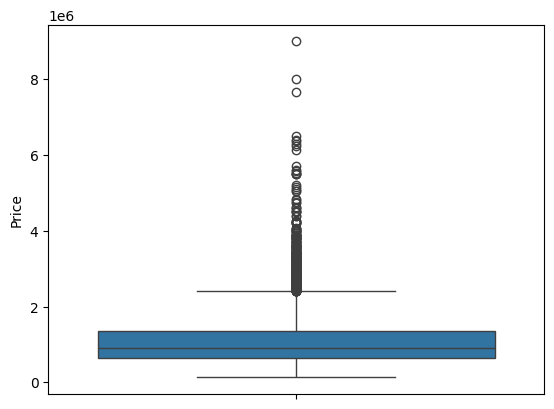

In [ ]:
# Quick vertical boxplot
sns.boxplot(data=df, y='Price')

<Axes: xlabel='Rooms', ylabel='Count'>

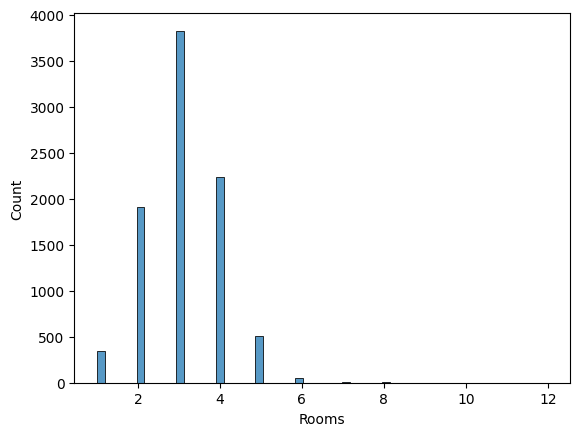

In [ ]:
sns.histplot(data=df, x="Rooms")

Histogram may not be appropriate. `Rooms` should be a categorical/discrete variable rather than continuous. A barplot visualization is more appropriate.

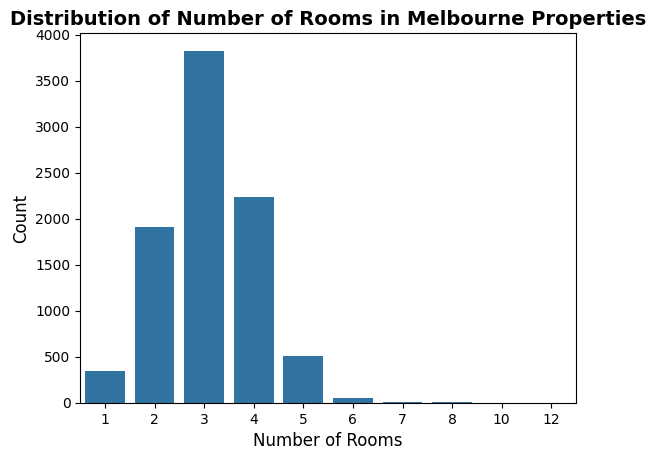

In [ ]:
sns.countplot(data=df, x="Rooms")
# Set title and labels
plt.title("Distribution of Number of Rooms in Melbourne Properties", fontsize=14, fontweight='bold')
plt.xlabel("Number of Rooms", fontsize=12)
plt.ylabel("Count", fontsize=12)

# Show the plot
plt.show()


<Axes: xlabel='Distance', ylabel='Count'>

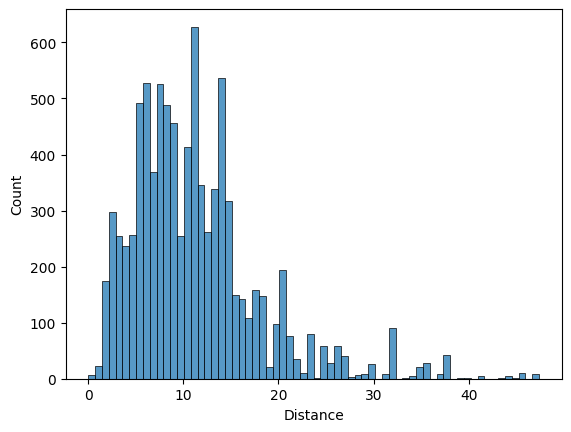

In [ ]:
sns.histplot(data=df, x="Distance")

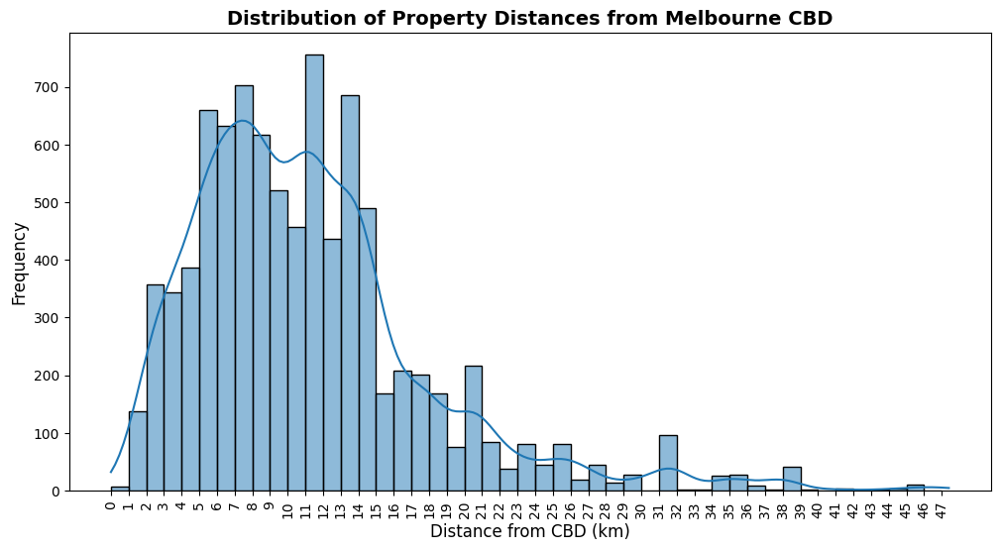

In [ ]:
# Create a professional histogram for 'Distance' from CBD
plt.figure(figsize=(12, 6))

# Define appropriate bin size for better visualization
bin_edges = range(0, int(df['Distance'].max()) + 1, 1)  # Bins in 1 km increments

# Plot the histogram
sns.histplot(data=df, x="Distance", bins=bin_edges, kde=True)

# Set title and labels
plt.title("Distribution of Property Distances from Melbourne CBD", fontsize=14, fontweight='bold')
plt.xlabel("Distance from CBD (km)", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

# Format x-axis ticks in 1 km increments
plt.xticks(bin_edges, rotation=90)

# Improve aesthetics
plt.grid(False)
plt.show()


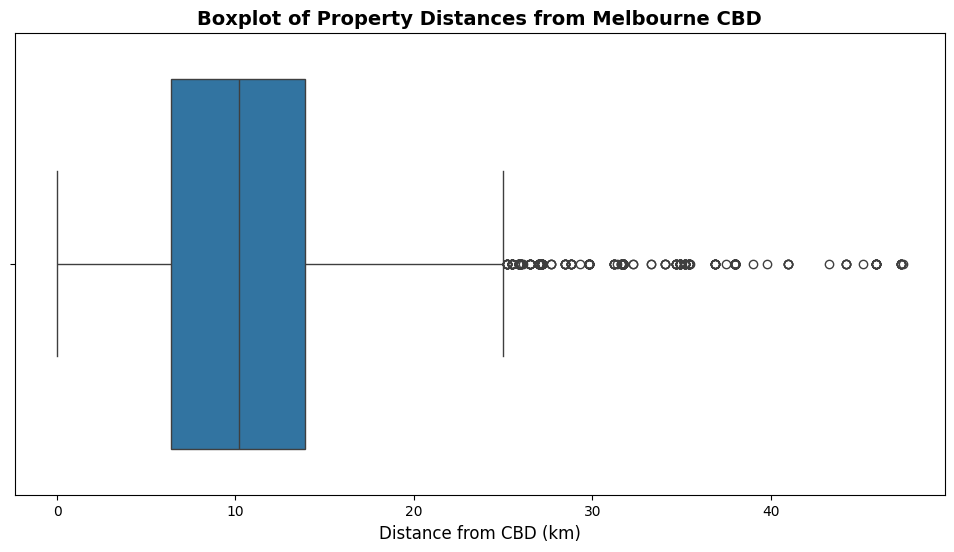

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create the boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x=df["Distance"])

# Set title and labels
plt.title("Boxplot of Property Distances from Melbourne CBD", fontsize=14, fontweight='bold')
plt.xlabel("Distance from CBD (km)", fontsize=12)

# Improve aesthetics
plt.grid(False)
plt.show()


### ⚠️ Handle Outliers with Caution

**Outliers** are extreme values that differ from other observations. They may indicate data errors, rare events, or genuine variability. Mishandling outliers can distort analysis and lead to misleading conclusions.

**How to handle them:**

* **Investigate**: First, verify whether the outlier is a data entry error, a valid rare case, or a structural issue.
* **Options**:
  * **Acknowledge and retain**: If the outlier is a legitimate and meaningful part of the data (e.g. a true high-value customer; luxury house/car with high price tag), keep it. *Important: may reflect valuable business insight.*
  * **Remove**: Exclude only if the value is clearly erroneous or irrelevant. *Risk: may reduce sample size or hide meaningful variation.*
  * **Cap (Winsorise)**: Replace extreme values with a specified percentile (e.g. 1st and 99th). *Balances impact while retaining data structure.*
  * **Transform**: Apply a log, square root, or z-score to reduce skew. *Preserves data but alters interpretability.*

**Tip**: Always document your decision and consider the business and statistical implications of modifying outliers.

Identify outliers using IQR methods

In [48]:
# IQR methods
# Compute IQR
Q1 = df['Price'].quantile(0.25)
Q3 = df['Price'].quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers = df[(df['Price'] < lower_bound) | (df['Price'] > upper_bound)]

# Display the number of outliers detected
num_outliers = outliers.shape[0]

# Show the summary and a few outliers
print(f'Any price < ${lower_bound} or price > ${upper_bound} are identified as outliers')
print(f'Number of outliers in Price column: {num_outliers}')
print('Some sample outliers')
outliers

Any price < $-415000.0 or price > $2401000.0 are identified as outliers
Number of outliers in Price column: 420
Some sample outliers


,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
135,Albert Park,112 Beaconsfield Pde,3,h,2850000.00,PI,Buxton,2017-03-04,3.30,3206.00,...,2.00,0.00,211.00,198.00,1890.00,Port Phillip City Council,-37.85,144.95,Southern Metropolitan,3280.00
152,Albert Park,2 Dundas Pl,3,h,2615000.00,S,Cayzer,2016-12-10,3.30,3206.00,...,2.00,1.00,177.00,181.00,1880.00,Port Phillip City Council,-37.84,144.96,Southern Metropolitan,3280.00
166,Albert Park,97 Page St,3,h,3010000.00,S,Greg,2017-03-18,3.30,3206.00,...,2.00,0.00,147.00,146.00,1890.00,Port Phillip City Council,-37.85,144.96,Southern Metropolitan,3280.00
168,Albert Park,55 Withers St,4,h,2800000.00,VB,Cayzer,2016-06-18,3.30,3206.00,...,3.00,1.00,327.00,254.00,1910.00,Port Phillip City Council,-37.85,144.95,Southern Metropolitan,3280.00
178,Albert Park,115 Page St,4,h,4735000.00,S,Marshall,2017-02-25,3.30,3206.00,...,2.00,1.00,330.00,207.00,1910.00,Port Phillip City Council,-37.85,144.96,Southern Metropolitan,3280.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34460,Malvern East,11 The Avenue,4,h,2425000.00,PI,Marshall,2018-02-24,8.40,3145.00,...,2.00,2.00,651.00,230.00,1920.00,Stonnington City Council,-37.88,145.05,Southern Metropolitan,8801.00
34494,Middle Park,33 Canterbury Rd,6,h,5575000.00,S,Marshall,2018-02-24,3.00,3206.00,...,4.00,4.00,420.00,324.00,1880.00,Port Phillip City Council,-37.85,144.96,Southern Metropolitan,2019.00
34496,Middle Park,108 Hambleton St,3,h,3750000.00,SA,Greg,2018-02-24,3.00,3206.00,...,1.00,0.00,284.00,148.00,1890.00,Port Phillip City Council,-37.85,144.96,Southern Metropolitan,2019.00
34498,Middle Park,22 McGregor St,3,h,3250000.00,S,Greg,2018-02-24,3.00,3206.00,...,2.00,1.00,286.00,233.00,1900.00,Port Phillip City Council,-37.85,144.96,Southern Metropolitan,2019.00


Handles outliers

In [49]:
# Option 1: Remove outliers
df_no_outliers = df[(df['Price'] >= lower_bound) & (df['Price'] <= upper_bound)]

In [50]:
# Option 2: Cap outliers
df_capped = df.copy()
df_capped['Price'] = np.where(df_capped['Price'] < lower_bound, lower_bound, df_capped['Price'])
df_capped['Price'] = np.where(df_capped['Price'] > upper_bound, upper_bound, df_capped['Price'])

In [51]:
# Option 3: Log Transformation (for skewed distributions)
df_transformed = df.copy()
df_transformed['Price'] = np.log1p(df_transformed['Price'])  # log(Price + 1) to handle zero values

In [52]:
# Display results
print(f"Original dataset size: {df.shape[0]}")
print(f"After removing outliers: {df_no_outliers.shape[0]}")
print(f"Example of capped prices:\n{df_capped[['Price']].head()}")
print(f"Example of log-transformed prices:\n{df_transformed[['Price']].head()}")

Original dataset size: 8887
After removing outliers: 8467
Example of capped prices:
        Price
2  1035000.00
4  1465000.00
6  1600000.00
11 1876000.00
14 1636000.00
Example of log-transformed prices:
    Price
2   13.85
4   14.20
6   14.29
11  14.44
14  14.31


**Remove outliers**

<Axes: xlabel='Price', ylabel='Count'>

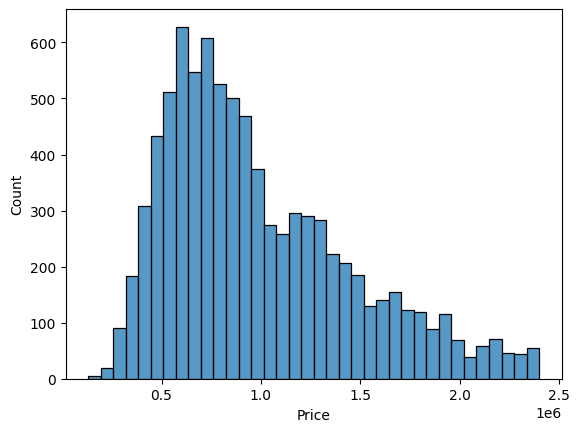

In [53]:
sns.histplot(df_no_outliers['Price'])

<Axes: ylabel='Price'>

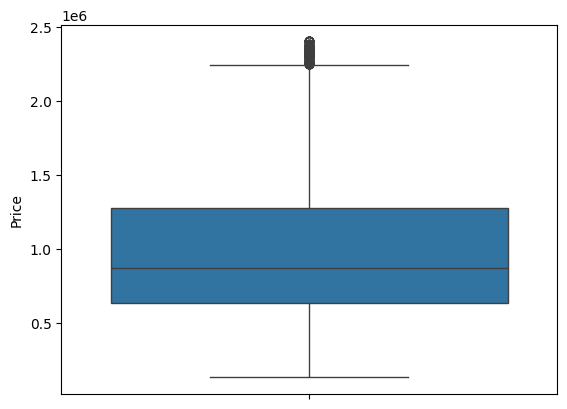

In [54]:
sns.boxplot(df_no_outliers['Price'])

**Capped outliers**

<Axes: xlabel='Price', ylabel='Count'>

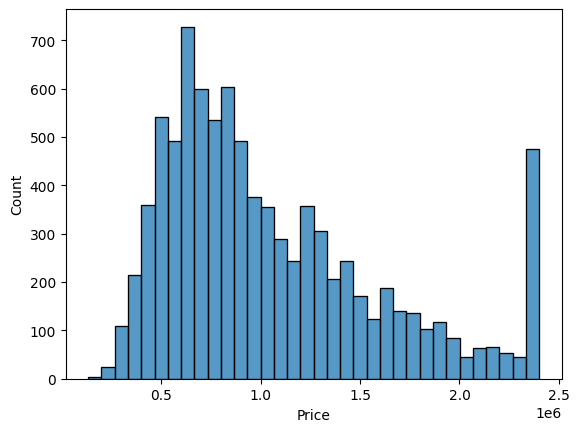

In [55]:
sns.histplot(df_capped['Price'])

<Axes: ylabel='Price'>

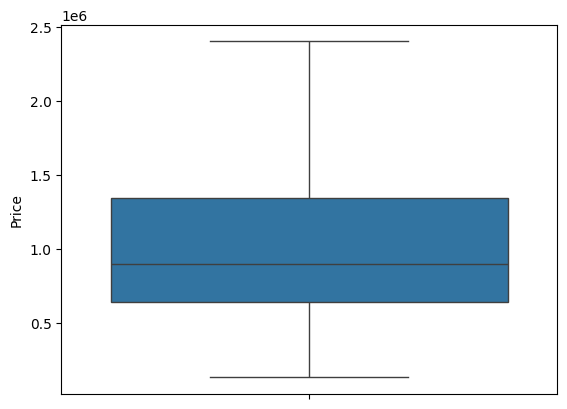

In [56]:
sns.boxplot(df_capped['Price'])

**Transform outliers**

<Axes: xlabel='Price', ylabel='Count'>

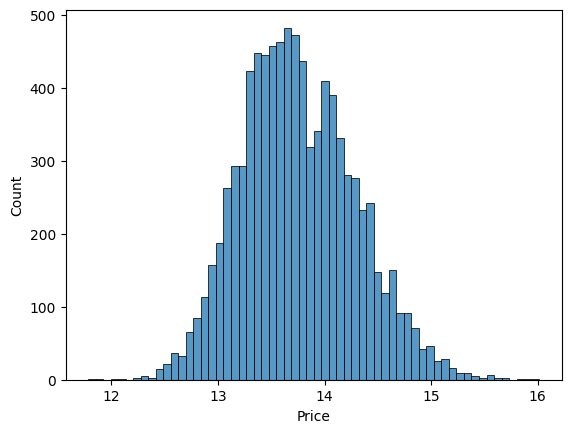

In [57]:
sns.histplot(df_transformed['Price'])

<Axes: ylabel='Price'>

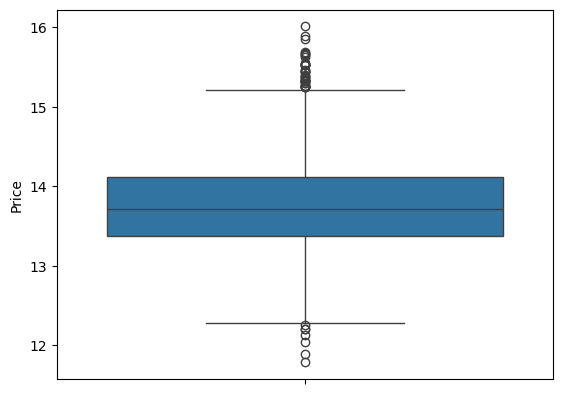

In [58]:
sns.boxplot(df_transformed['Price'])

### Lazy EDA for numerical univariate analysis

In [ ]:
df.describe()

,Rooms,Price,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,8887.00,8887.00,8887,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00
mean,3.10,1092901.63,2017-04-05 23:17:42.540790016,11.20,3111.66,3.08,1.65,1.69,523.48,149.31,1965.75,-37.80,144.99,7475.94
min,1.00,131000.00,2016-02-04 00:00:00,0.00,3000.00,0.00,1.00,0.00,0.00,0.00,1196.00,-38.17,144.42,249.00
25%,2.00,641000.00,2016-09-24 00:00:00,6.40,3044.00,2.00,1.00,1.00,212.00,100.00,1945.00,-37.86,144.92,4382.50
50%,3.00,900000.00,2017-05-13 00:00:00,10.20,3084.00,3.00,2.00,2.00,478.00,132.00,1970.00,-37.80,145.00,6567.00
75%,4.00,1345000.00,2017-09-16 00:00:00,13.90,3150.00,4.00,2.00,2.00,652.00,180.00,2000.00,-37.75,145.06,10331.00
max,12.00,9000000.00,2018-03-17 00:00:00,47.40,3977.00,12.00,9.00,10.00,42800.00,3112.00,2019.00,-37.41,145.53,21650.00
std,0.96,679381.90,NaN,6.81,112.61,0.97,0.72,0.98,1061.32,87.93,37.04,0.09,0.12,4375.02



Rooms Summary:
 count   8887.00
mean       3.10
std        0.96
min        1.00
25%        2.00
50%        3.00
75%        4.00
max       12.00
Name: Rooms, dtype: float64
Missing: 0, Skewness: 0.33, Kurtosis: 1.38


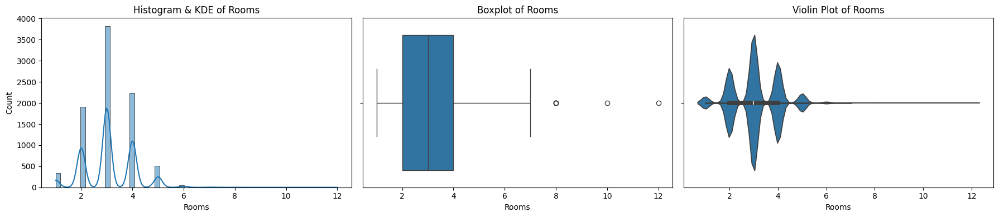


Price Summary:
 count      8887.00
mean    1092901.63
std      679381.90
min      131000.00
25%      641000.00
50%      900000.00
75%     1345000.00
max     9000000.00
Name: Price, dtype: float64
Missing: 0, Skewness: 2.41, Kurtosis: 11.04


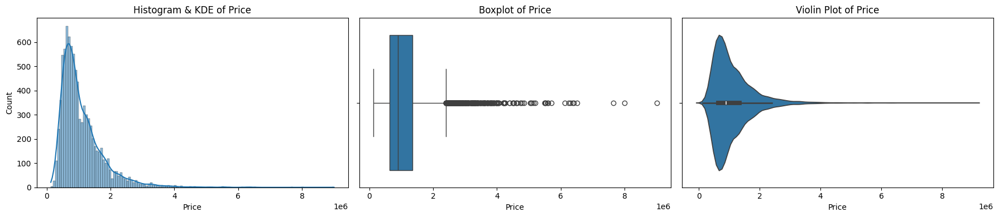


Distance Summary:
 count   8887.00
mean      11.20
std        6.81
min        0.00
25%        6.40
50%       10.20
75%       13.90
max       47.40
Name: Distance, dtype: float64
Missing: 0, Skewness: 1.55, Kurtosis: 3.62


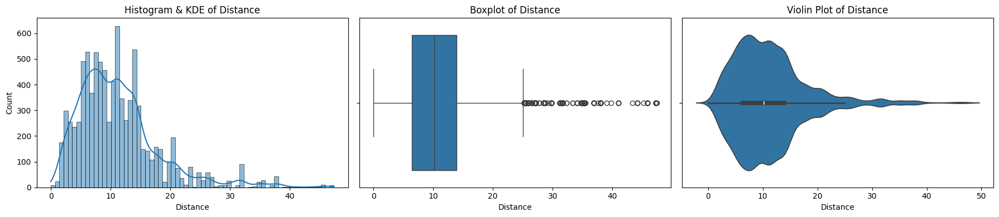


Postcode Summary:
 count   8887.00
mean    3111.66
std      112.61
min     3000.00
25%     3044.00
50%     3084.00
75%     3150.00
max     3977.00
Name: Postcode, dtype: float64
Missing: 0, Skewness: 3.91, Kurtosis: 20.87


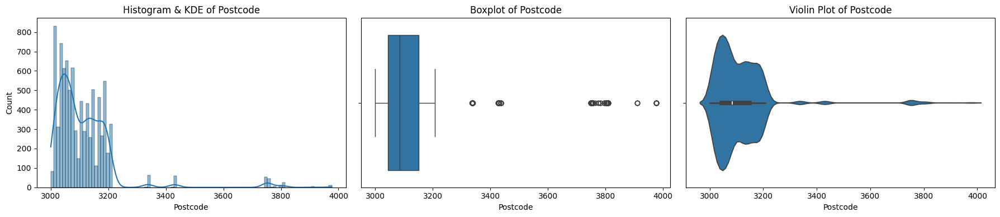


Bedroom2 Summary:
 count   8887.00
mean       3.08
std        0.97
min        0.00
25%        2.00
50%        3.00
75%        4.00
max       12.00
Name: Bedroom2, dtype: float64
Missing: 0, Skewness: 0.36, Kurtosis: 1.67


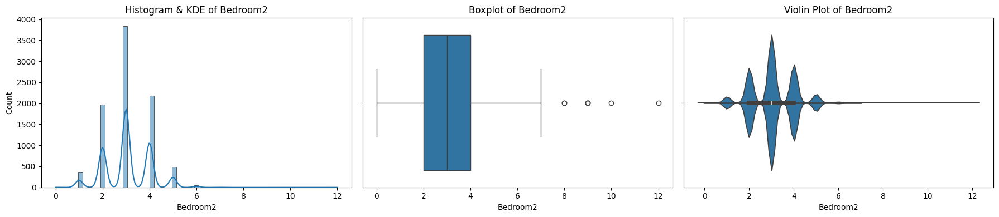


Bathroom Summary:
 count   8887.00
mean       1.65
std        0.72
min        1.00
25%        1.00
50%        2.00
75%        2.00
max        9.00
Name: Bathroom, dtype: float64
Missing: 0, Skewness: 1.26, Kurtosis: 3.67


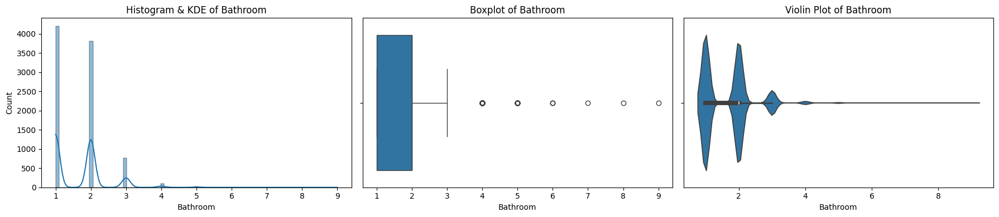


Car Summary:
 count   8887.00
mean       1.69
std        0.98
min        0.00
25%        1.00
50%        2.00
75%        2.00
max       10.00
Name: Car, dtype: float64
Missing: 0, Skewness: 1.42, Kurtosis: 5.30


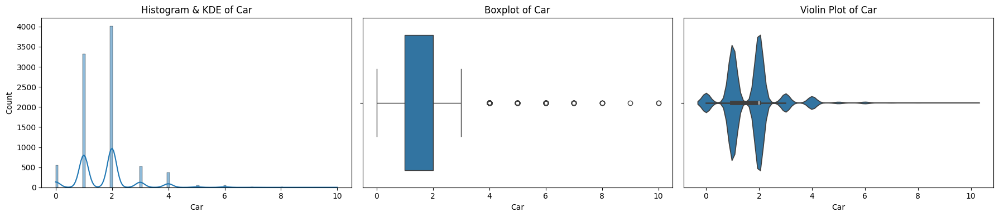


Landsize Summary:
 count    8887.00
mean      523.48
std      1061.32
min         0.00
25%       212.00
50%       478.00
75%       652.00
max     42800.00
Name: Landsize, dtype: float64
Missing: 0, Skewness: 23.11, Kurtosis: 746.33


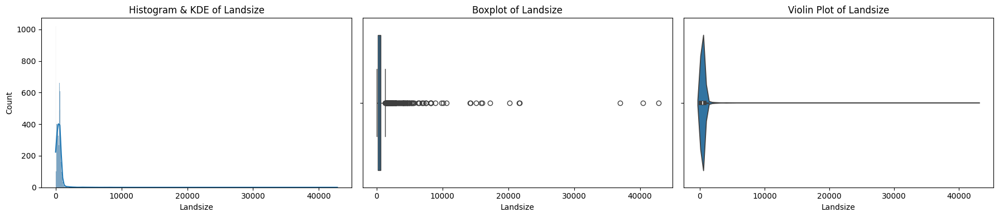


BuildingArea Summary:
 count   8887.00
mean     149.31
std       87.93
min        0.00
25%      100.00
50%      132.00
75%      180.00
max     3112.00
Name: BuildingArea, dtype: float64
Missing: 0, Skewness: 6.50, Kurtosis: 159.72


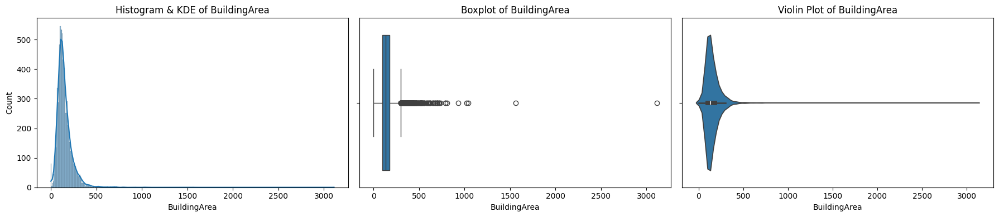


YearBuilt Summary:
 count   8887.00
mean    1965.75
std       37.04
min     1196.00
25%     1945.00
50%     1970.00
75%     2000.00
max     2019.00
Name: YearBuilt, dtype: float64
Missing: 0, Skewness: -1.49, Kurtosis: 20.18


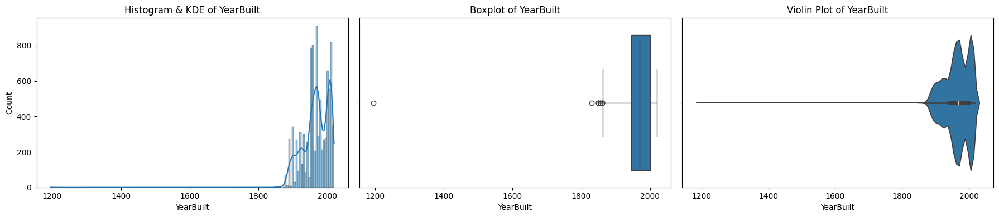


Lattitude Summary:
 count   8887.00
mean     -37.80
std        0.09
min      -38.17
25%      -37.86
50%      -37.80
75%      -37.75
max      -37.41
Name: Lattitude, dtype: float64
Missing: 0, Skewness: -0.31, Kurtosis: 1.49


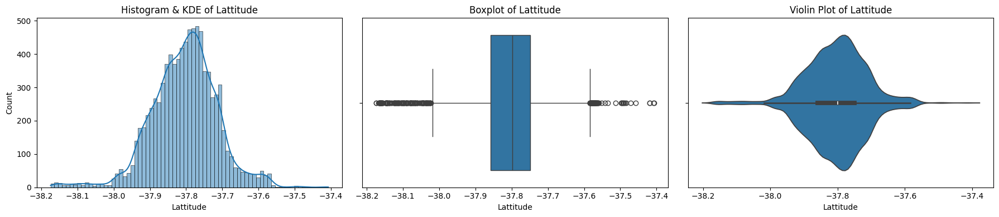


Longtitude Summary:
 count   8887.00
mean     144.99
std        0.12
min      144.42
25%      144.92
50%      145.00
75%      145.06
max      145.53
Name: Longtitude, dtype: float64
Missing: 0, Skewness: -0.34, Kurtosis: 1.57


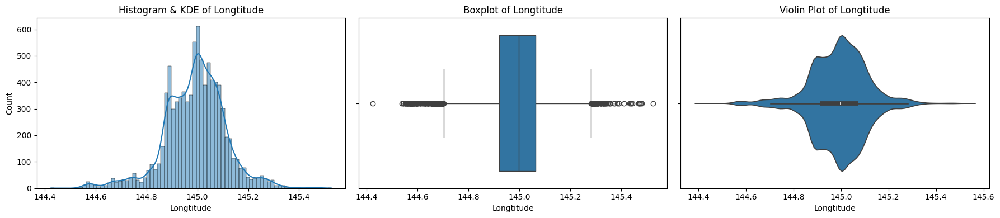


Propertycount Summary:
 count    8887.00
mean     7475.94
std      4375.02
min       249.00
25%      4382.50
50%      6567.00
75%     10331.00
max     21650.00
Name: Propertycount, dtype: float64
Missing: 0, Skewness: 0.98, Kurtosis: 0.90


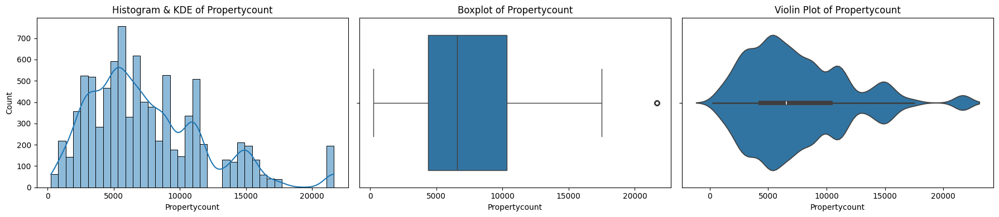

In [ ]:
numeric_cols = df.select_dtypes(include='number').columns

for col in numeric_cols:
    print(f"\n{col} Summary:\n", df[col].describe())
    print(f"Missing: {df[col].isna().sum()}, Skewness: {df[col].skew():.2f}, Kurtosis: {df[col].kurtosis():.2f}")

    fig, axs = plt.subplots(1, 3, figsize=(18, 4))

    sns.histplot(df[col].dropna(), kde=True, ax=axs[0])
    axs[0].set_title(f'Histogram & KDE of {col}')

    sns.boxplot(x=df[col], ax=axs[1])
    axs[1].set_title(f'Boxplot of {col}')

    sns.violinplot(x=df[col], ax=axs[2])
    axs[2].set_title(f'Violin Plot of {col}')

    plt.tight_layout()
    plt.show()


## Categorical variables

### Categorical variables summary

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8887 entries, 2 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         8887 non-null   object        
 1   Address        8887 non-null   object        
 2   Rooms          8887 non-null   int64         
 3   Type           8887 non-null   object        
 4   Price          8887 non-null   float64       
 5   Method         8887 non-null   object        
 6   SellerG        8887 non-null   object        
 7   Date           8887 non-null   datetime64[ns]
 8   Distance       8887 non-null   float64       
 9   Postcode       8887 non-null   float64       
 10  Bedroom2       8887 non-null   float64       
 11  Bathroom       8887 non-null   float64       
 12  Car            8887 non-null   float64       
 13  Landsize       8887 non-null   float64       
 14  BuildingArea   8887 non-null   float64       
 15  YearBuilt      8887 non-n

In [ ]:
# Define your categorical columns here
categorical_cols = ['Suburb', 'Rooms', 'Type', 'Method', 'SellerG', 'Regionname', 'Postcode', 'CouncilArea']
df[categorical_cols] = df[categorical_cols].astype('category')

df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8887 entries, 2 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         8887 non-null   category      
 1   Address        8887 non-null   object        
 2   Rooms          8887 non-null   category      
 3   Type           8887 non-null   category      
 4   Price          8887 non-null   float64       
 5   Method         8887 non-null   category      
 6   SellerG        8887 non-null   category      
 7   Date           8887 non-null   datetime64[ns]
 8   Distance       8887 non-null   float64       
 9   Postcode       8887 non-null   category      
 10  Bedroom2       8887 non-null   float64       
 11  Bathroom       8887 non-null   float64       
 12  Car            8887 non-null   float64       
 13  Landsize       8887 non-null   float64       
 14  BuildingArea   8887 non-null   float64       
 15  YearBuilt      8887 non-n

<ipython-input-41-b09f9bbecd7b>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[categorical_cols] = df[categorical_cols].astype('category')


In [ ]:
df.describe(include='category')

,Suburb,Rooms,Type,Method,SellerG,Postcode,CouncilArea,Regionname
count,8887,8887,8887,8887,8887,8887.00,8887,8887
unique,315,10,3,5,250,194.00,33,8
top,Reservoir,3,h,S,Nelson,3073.00,Boroondara City Council,Southern Metropolitan
freq,194,3824,6625,5602,986,194.00,810,2707


### Frequency distributions

**`Type` example**

In [ ]:
# Count occurrences of each property type
df['Type'].value_counts()

,count
Type,
h,6625
u,1540
t,722


In [ ]:
# Compute relative frequency of each property type
df['Type'].value_counts(normalize=True)

,proportion
Type,
h,0.75
u,0.17
t,0.08


### Visualise categorical data

#### Bar chart (preferred)

<Axes: xlabel='Type', ylabel='count'>

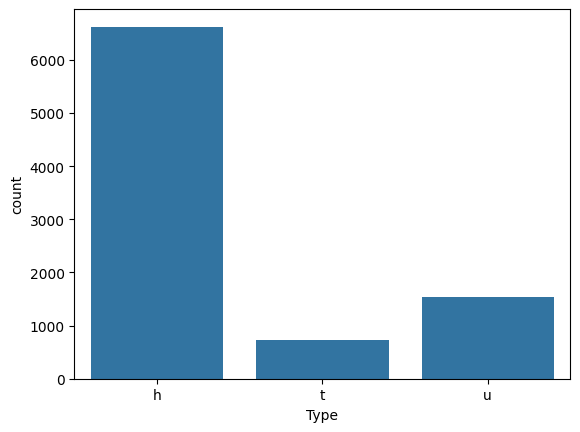

In [ ]:
sns.countplot(data=df, x="Type")

<Axes: xlabel='count', ylabel='Type'>

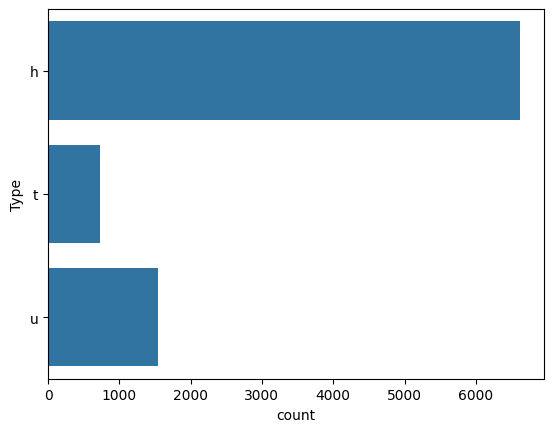

In [ ]:
sns.countplot(data=df, y="Type")

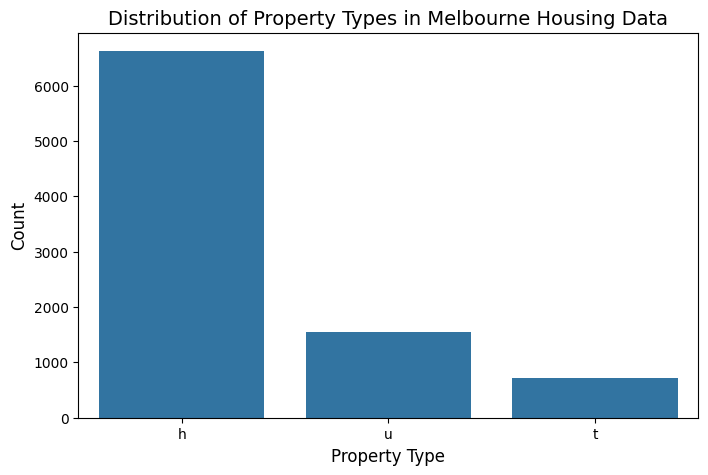

In [ ]:
# Set the figure size
plt.figure(figsize=(8, 5))

# Create a count plot for property type distribution
sns.countplot(data=df, x="Type", order=df["Type"].value_counts().index)

# Add labels and title
plt.xlabel("Property Type", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("Distribution of Property Types in Melbourne Housing Data", fontsize=14)

# Display the plot
plt.show()

#### Pie chart (Be careful!)

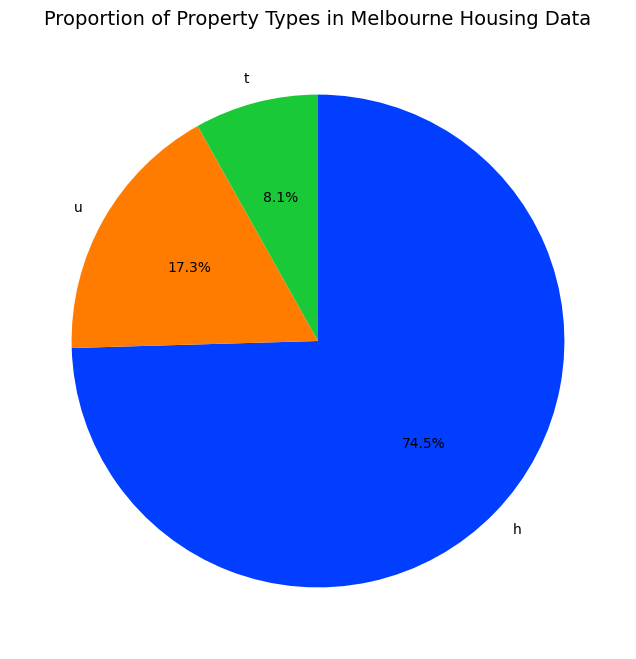

In [ ]:
# Create a pie chart with sorted slices, starting at 12 o'clock (90 degrees) and in a clockwise direction
plt.figure(figsize=(8, 8))
type_counts_sorted = df['Type'].value_counts().sort_values(ascending=False)

plt.pie(type_counts_sorted, labels=type_counts_sorted.index, autopct='%1.1f%%',
        colors=sns.color_palette("bright"), startangle=90, counterclock=False)

# Add title
plt.title("Proportion of Property Types in Melbourne Housing Data", fontsize=14)

# Display the plot
plt.show()


### Lazy EDA for all categorical stats and visualisation

In [ ]:
# Display summary statistics for categorical variables
print("Categorical Variable Summary:")
for col in categorical_cols:
    print(f"\nColumn: {col}")
    print(df[col].value_counts())
    print("-" * 39)

Categorical Variable Summary:

Column: Suburb
Suburb
Reservoir             194
Richmond              155
Brunswick             152
Bentleigh East        138
Coburg                135
                     ... 
Whittlesea              1
Bacchus Marsh           1
Beaconsfield            1
Beaconsfield Upper      1
Yarra Glen              1
Name: count, Length: 315, dtype: int64
---------------------------------------

Column: Rooms
Rooms
3     3824
4     2240
2     1912
5      507
1      340
6       51
7        7
8        4
10       1
12       1
Name: count, dtype: int64
---------------------------------------

Column: Type
Type
h    6625
u    1540
t     722
Name: count, dtype: int64
---------------------------------------

Column: Method
Method
S     5602
SP    1292
PI    1084
VB     846
SA      63
Name: count, dtype: int64
---------------------------------------

Column: SellerG
SellerG
Nelson                     986
Jellis                     873
Barry                      741
hockings

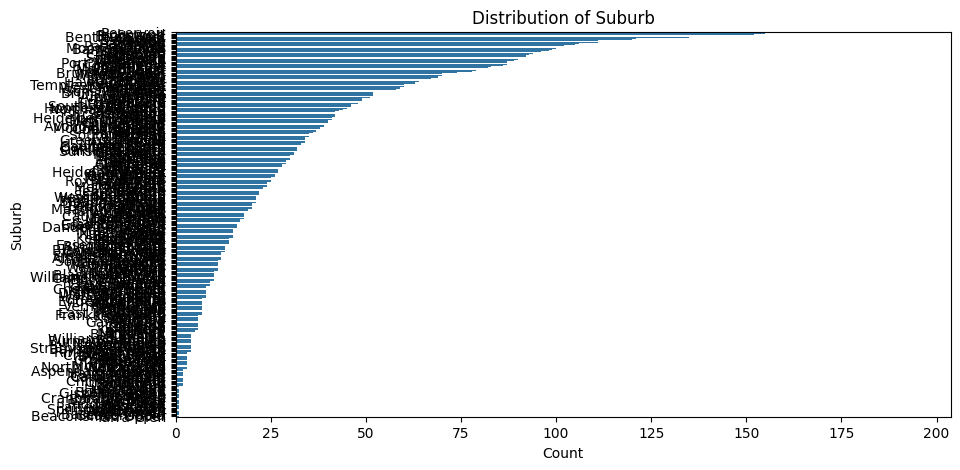

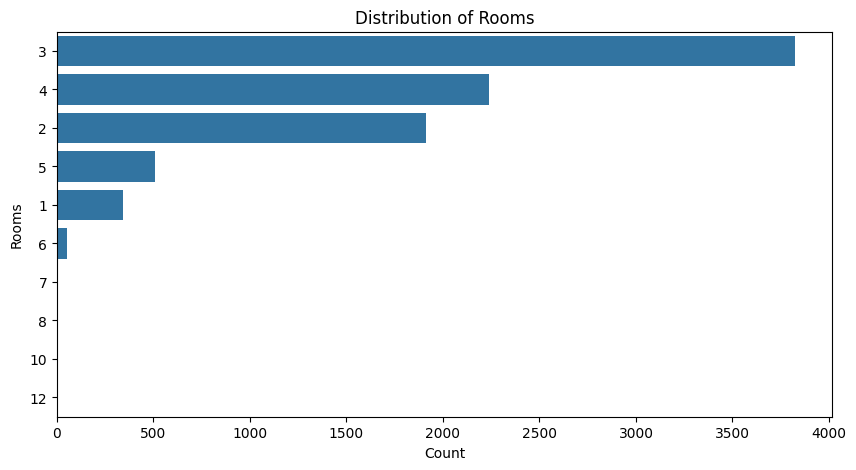

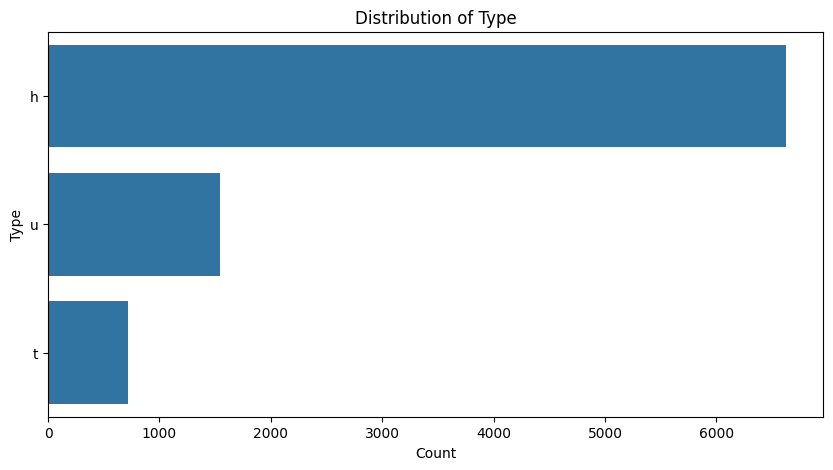

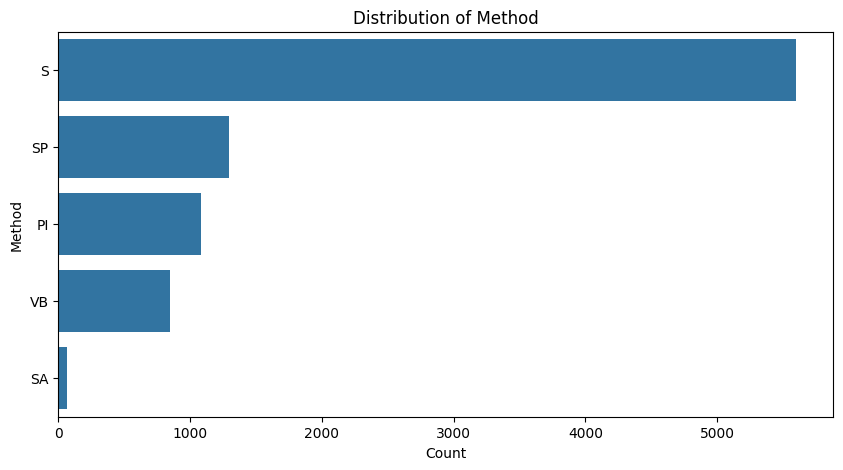

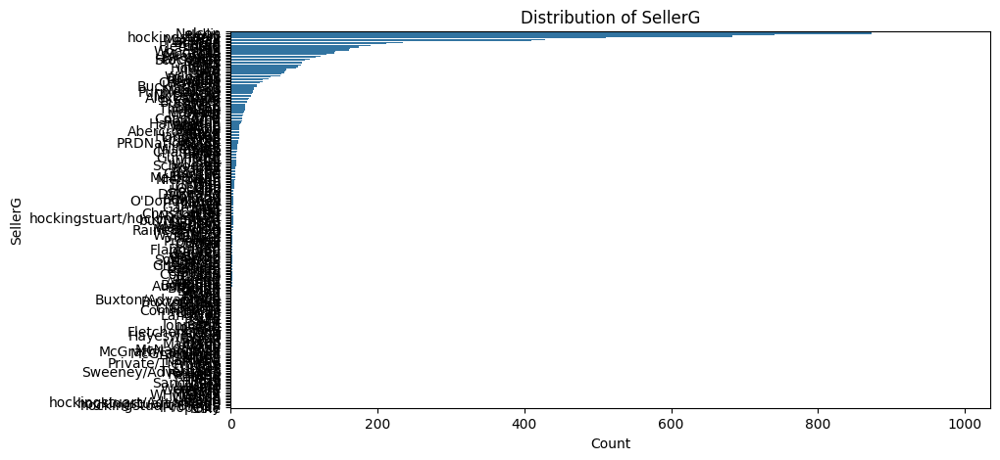

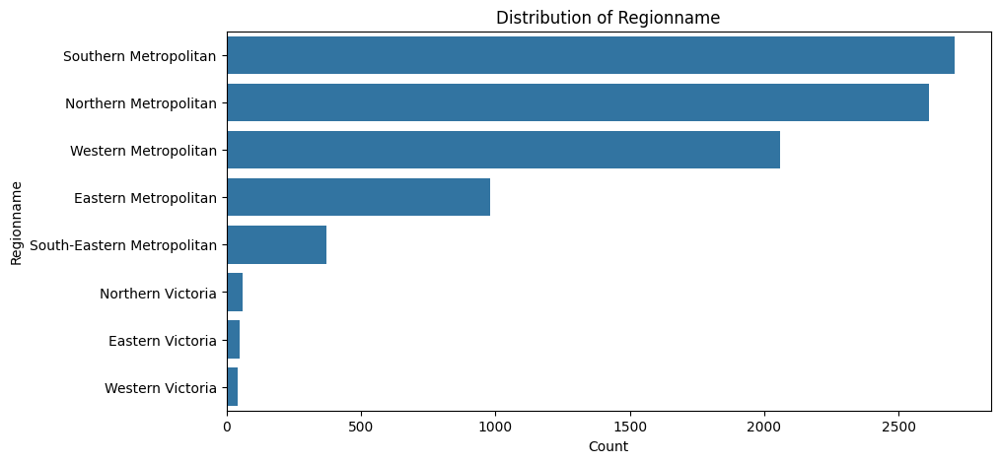

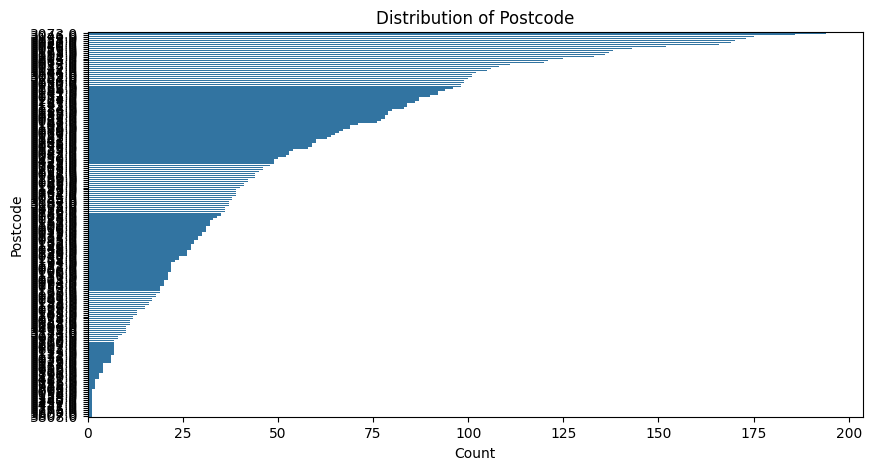

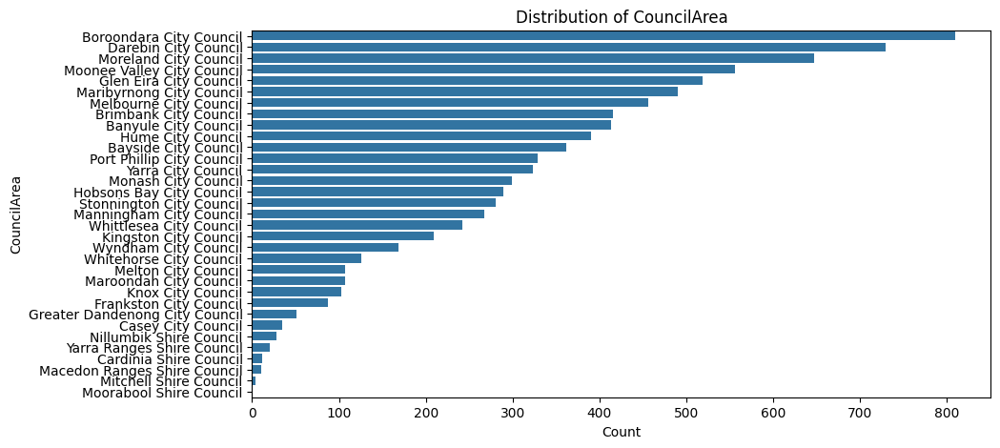

In [ ]:
# Visualizing categorical distributions
for col in categorical_cols:
    plt.figure(figsize=(10, 5))
    sns.countplot(data=df, y=col, order=df[col].value_counts().index,)
    plt.xlabel("Count")
    plt.ylabel(col)
    plt.title(f"Distribution of {col}")
    plt.show()

# Bivariate analysis

**Bivariate analysis** explores the relationship between two variables, helping to uncover patterns, associations, or potential predictive links.

**Why it matters:**
It reveals how one variable may influence or relate to another, which is essential for feature selection, and model development.

**What to explore:**

* **Numerical vs Numerical**:

  * Use **scatter plots**, **correlation coefficients** (e.g. Pearson, Spearman)
  * Identify linear trends, clusters, or outliers.

* **Categorical vs Numerical**:

  * Use **box plots**, **grouped summary statistics**, or **bar charts**
  * Compare distributions across groups.

* **Categorical vs Categorical**:

  * Use **contingency tables**, **stacked bar charts**, or **Chi-square tests**
  * Assess associations between categories.

**Focus**:
Pay attention to the relationship between the **target variable (label)** and each **feature (predictor)**.
This helps identify which variables are most informative for prediction or classification tasks.

**Tip**: Consider not just strength and direction, but also the **form** (linear/non-linear) and **practical significance** of relationships when interpreting results.


## Numerical vs numerical data

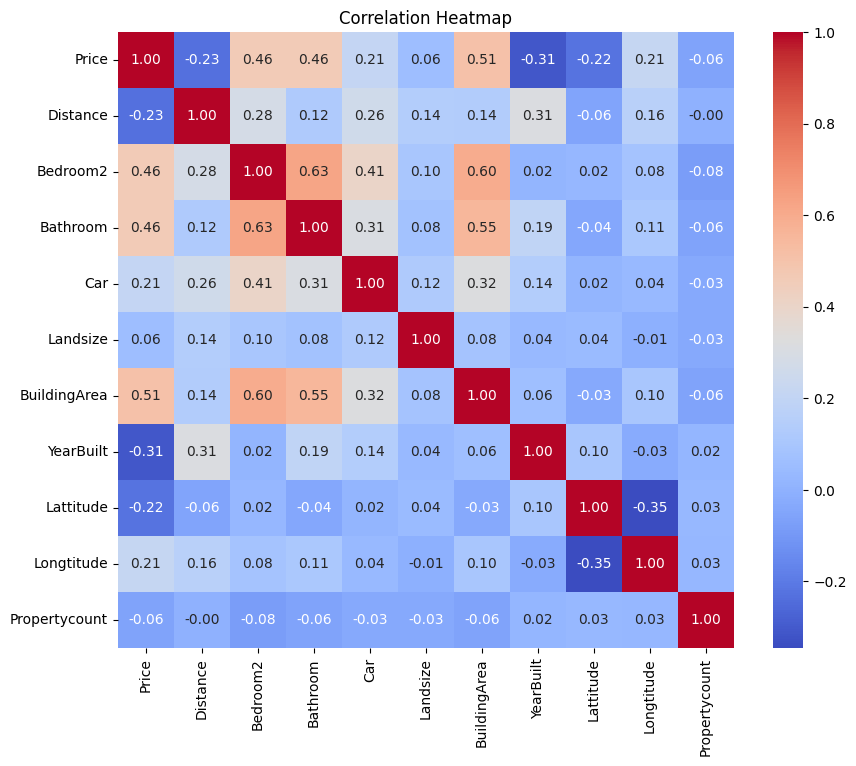

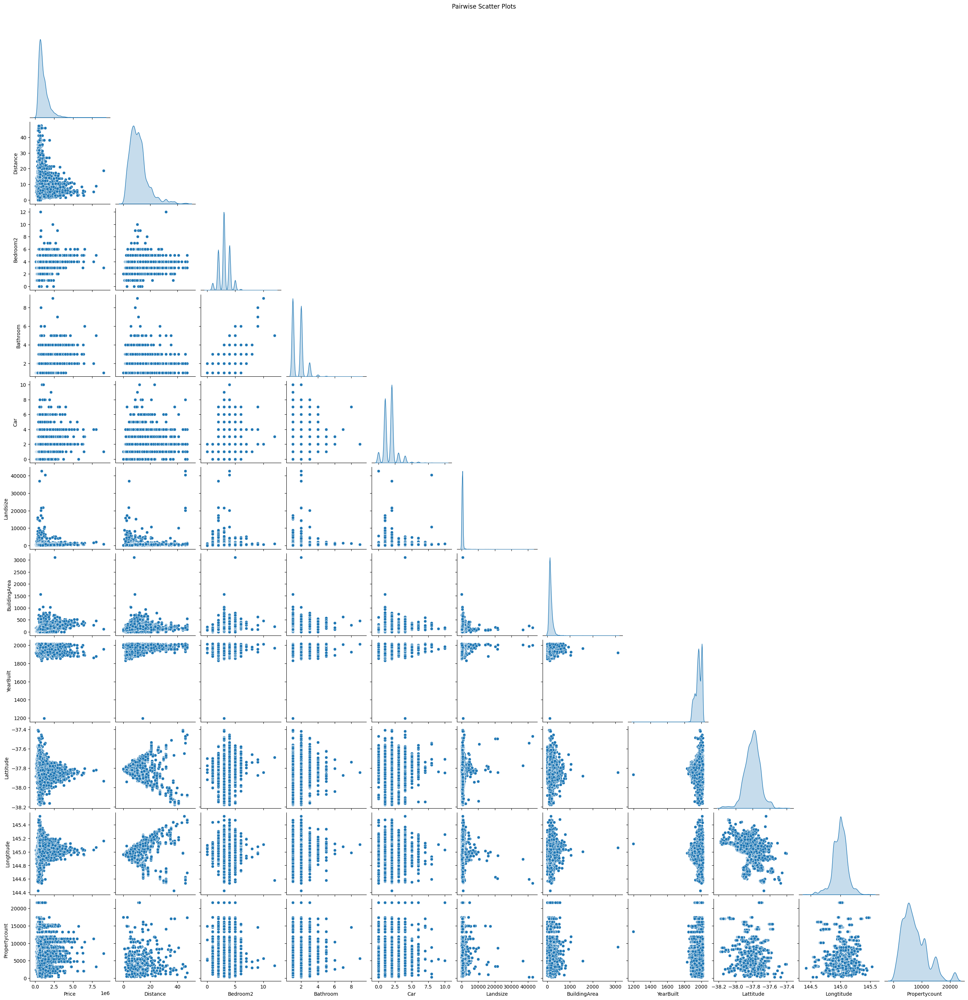


Top correlated pairs (|r| > 0.7):
Bedroom2 vs Bathroom: r = 0.63


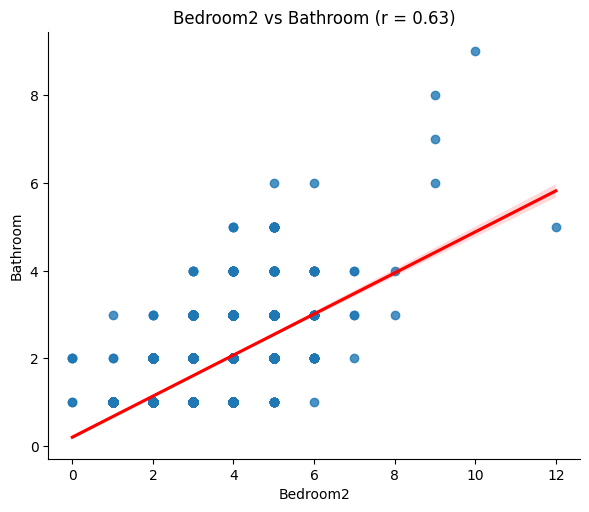

Bedroom2 vs BuildingArea: r = 0.60


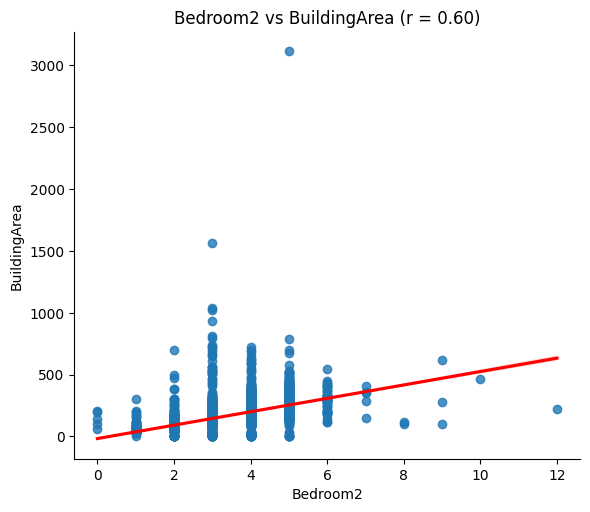

BuildingArea vs Bathroom: r = 0.55


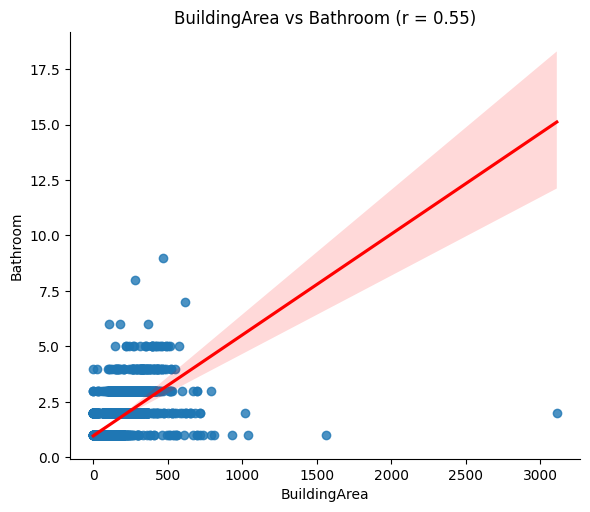

Price vs BuildingArea: r = 0.51


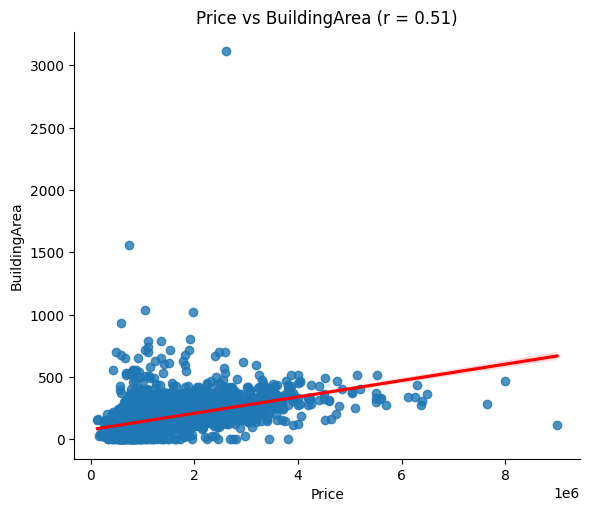

In [ ]:
numeric_cols = df.select_dtypes(include='number').columns

# Correlation Matrix
corr_matrix = df[numeric_cols].corr(method='pearson')

# Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', square=True)
plt.title("Correlation Heatmap")
plt.show()

# Pairplot
sns.pairplot(df[numeric_cols], diag_kind='kde', corner=True)
plt.suptitle("Pairwise Scatter Plots", y=1.02)
plt.show()

# Optional: Regression plots for top correlations
top_corrs = corr_matrix.abs().unstack().sort_values(ascending=False)
seen = set()
print("\nTop correlated pairs (|r| > 0.7):")
for (var1, var2), corr in top_corrs.items():
    if var1 == var2 or (var2, var1) in seen:
        continue
    seen.add((var1, var2))
    if corr > 0.5:
        print(f"{var1} vs {var2}: r = {corr:.2f}")
        sns.lmplot(data=df, x=var1, y=var2, height=5, aspect=1.2, line_kws={"color": "red"})
        plt.title(f"{var1} vs {var2} (r = {corr:.2f})")
        plt.show()

## Numerical vs categorical data

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8887 entries, 2 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         8887 non-null   category      
 1   Address        8887 non-null   object        
 2   Rooms          8887 non-null   category      
 3   Type           8887 non-null   category      
 4   Price          8887 non-null   float64       
 5   Method         8887 non-null   category      
 6   SellerG        8887 non-null   category      
 7   Date           8887 non-null   datetime64[ns]
 8   Distance       8887 non-null   float64       
 9   Postcode       8887 non-null   category      
 10  Bedroom2       8887 non-null   float64       
 11  Bathroom       8887 non-null   float64       
 12  Car            8887 non-null   float64       
 13  Landsize       8887 non-null   float64       
 14  BuildingArea   8887 non-null   float64       
 15  YearBuilt      8887 non-n

In [ ]:
df.describe(include='all')

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
count,8887,8887,8887.00,8887,8887.00,8887,8887,8887,8887.00,8887.00,...,8887.00,8887.00,8887.00,8887.00,8887.00,8887,8887.00,8887.00,8887,8887.00
unique,315,8764,10.00,3,NaN,5,250,NaN,NaN,194.00,...,NaN,NaN,NaN,NaN,NaN,33,NaN,NaN,8,NaN
top,Reservoir,25 William St,3.00,h,NaN,S,Nelson,NaN,NaN,3073.00,...,NaN,NaN,NaN,NaN,NaN,Boroondara City Council,NaN,NaN,Southern Metropolitan,NaN
freq,194,3,3824.00,6625,NaN,5602,986,NaN,NaN,194.00,...,NaN,NaN,NaN,NaN,NaN,810,NaN,NaN,2707,NaN
mean,NaN,NaN,NaN,NaN,1092901.63,NaN,NaN,2017-04-05 23:17:42.540790016,11.20,NaN,...,1.65,1.69,523.48,149.31,1965.75,NaN,-37.80,144.99,NaN,7475.94
min,NaN,NaN,NaN,NaN,131000.00,NaN,NaN,2016-02-04 00:00:00,0.00,NaN,...,1.00,0.00,0.00,0.00,1196.00,NaN,-38.17,144.42,NaN,249.00
25%,NaN,NaN,NaN,NaN,641000.00,NaN,NaN,2016-09-24 00:00:00,6.40,NaN,...,1.00,1.00,212.00,100.00,1945.00,NaN,-37.86,144.92,NaN,4382.50
50%,NaN,NaN,NaN,NaN,900000.00,NaN,NaN,2017-05-13 00:00:00,10.20,NaN,...,2.00,2.00,478.00,132.00,1970.00,NaN,-37.80,145.00,NaN,6567.00
75%,NaN,NaN,NaN,NaN,1345000.00,NaN,NaN,2017-09-16 00:00:00,13.90,NaN,...,2.00,2.00,652.00,180.00,2000.00,NaN,-37.75,145.06,NaN,10331.00
max,NaN,NaN,NaN,NaN,9000000.00,NaN,NaN,2018-03-17 00:00:00,47.40,NaN,...,9.00,10.00,42800.00,3112.00,2019.00,NaN,-37.41,145.53,NaN,21650.00



Price vs Method
--------------------------------------------------
         Price                                                                 \
         count       mean       std       min       25%        50%        75%   
Method                                                                          
PI     1084.00 1191086.72 781083.79 131000.00 650000.00  970000.00 1510000.00   
S      5602.00 1085888.79 649845.91 185000.00 657500.00  900000.00 1325000.00   
SA       63.00  991720.44 582593.32 240000.00 593500.00  900000.00 1250000.00   
SP     1292.00  918674.44 525221.84 250000.00 560000.00  783000.00 1125250.00   
VB      846.00 1287144.21 853606.67 200000.00 650000.00 1100000.00 1700000.00   

                   
              max  
Method             
PI     9000000.00  
S      7650000.00  
SA     3750000.00  
SP     4600000.00  
VB     8000000.00  


<ipython-input-54-b8eb4f4e582a>:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df[[cat, num_var]].groupby(cat).describe().round(2))
<ipython-input-54-b8eb4f4e582a>:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_sorted = df.groupby(cat)[num_var].median().sort_values().index


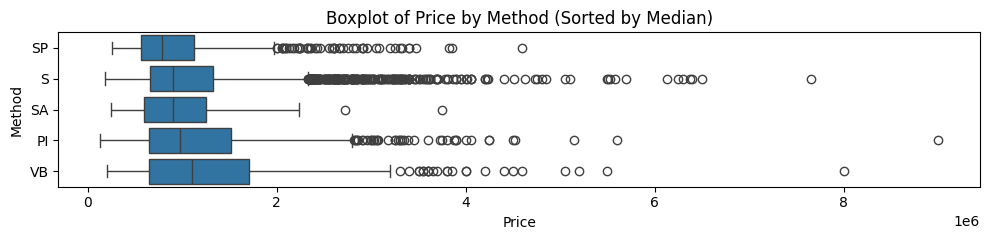


Price vs Type
--------------------------------------------------


<ipython-input-54-b8eb4f4e582a>:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df[[cat, num_var]].groupby(cat).describe().round(2))


       Price                                                                 \
       count       mean       std       min       25%        50%        75%   
Type                                                                          
h    6625.00 1230542.19 712328.25 131000.00 745500.00 1045000.00 1500000.00   
t     722.00  905321.24 390857.68 310000.00 650000.00  825000.00 1050000.00   
u    1540.00  588722.61 238853.96 170000.00 430000.00  545000.00  691000.00   

                 
            max  
Type             
h    9000000.00  
t    3820000.00  
u    2460000.00  


<ipython-input-54-b8eb4f4e582a>:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_sorted = df.groupby(cat)[num_var].median().sort_values().index


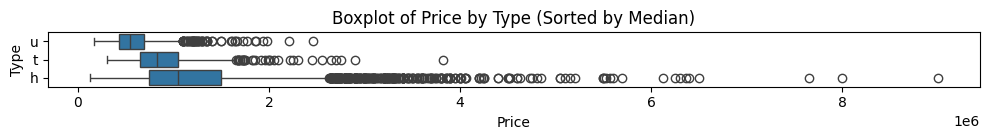


Price vs CouncilArea
--------------------------------------------------


<ipython-input-54-b8eb4f4e582a>:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df[[cat, num_var]].groupby(cat).describe().round(2))


                                Price                                  \
                                count       mean        std       min   
CouncilArea                                                             
Banyule City Council           413.00  984472.76  459968.41 360000.00   
Bayside City Council           362.00 1711756.04  812506.74 290000.00   
Boroondara City Council        810.00 1827678.69  965873.48 260000.00   
Brimbank City Council          416.00  697639.06  182217.13 185000.00   
Cardinia Shire Council          12.00  553958.33   87662.70 435000.00   
Casey City Council              35.00  685628.80  171173.09 400000.00   
Darebin City Council           729.00  931036.17  412325.69 145000.00   
Frankston City Council          87.00  695860.18  219135.84 386000.00   
Glen Eira City Council         519.00 1160517.03  523334.84 131000.00   
Greater Dandenong City Council  51.00  742682.35  183620.44 305000.00   
Hobsons Bay City Council       289.00 1034870.93  4

<ipython-input-54-b8eb4f4e582a>:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_sorted = df.groupby(cat)[num_var].median().sort_values().index


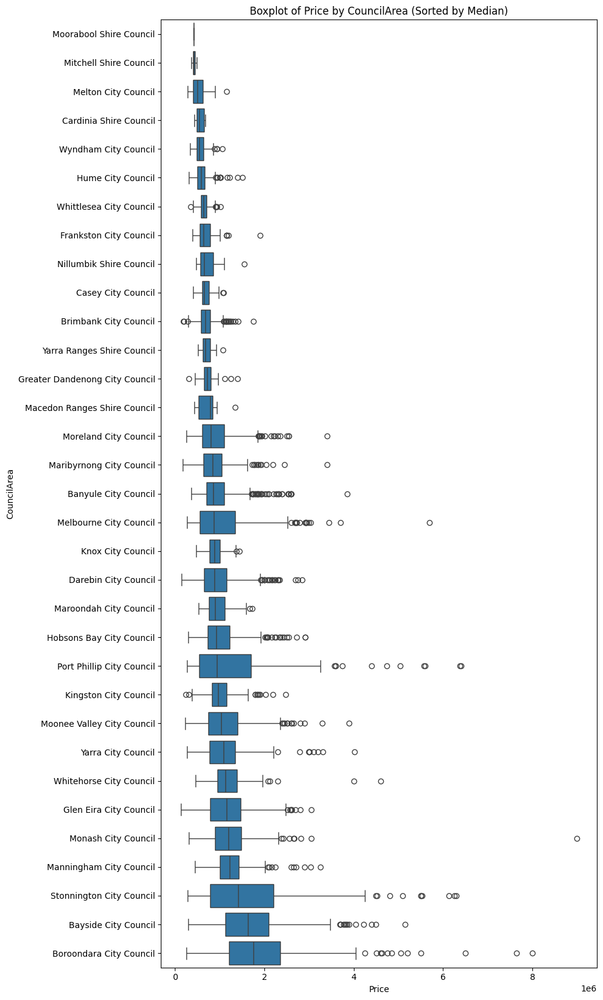


Price vs Regionname
--------------------------------------------------
                             Price                                           \
                             count       mean       std       min       25%   
Regionname                                                                    
Eastern Metropolitan        982.00 1157120.50 486605.46 360000.00 830000.00   
Eastern Victoria             51.00  661842.78 160375.57 435000.00 522500.00   
Northern Metropolitan      2612.00  877852.07 428151.56 145000.00 593625.00   
Northern Victoria            62.00  599040.32 207166.70 345000.00 438250.00   
South-Eastern Metropolitan  371.00  922715.88 527714.67 305000.00 681000.00   
Southern Metropolitan      2707.00 1493322.95 904136.79 131000.00 812500.00   
Western Metropolitan       2059.00  878367.19 420503.05 170000.00 600000.00   
Western Victoria             43.00  445802.33 120454.11 283000.00 385000.00   

                                                          

<ipython-input-54-b8eb4f4e582a>:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df[[cat, num_var]].groupby(cat).describe().round(2))
<ipython-input-54-b8eb4f4e582a>:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_sorted = df.groupby(cat)[num_var].median().sort_values().index


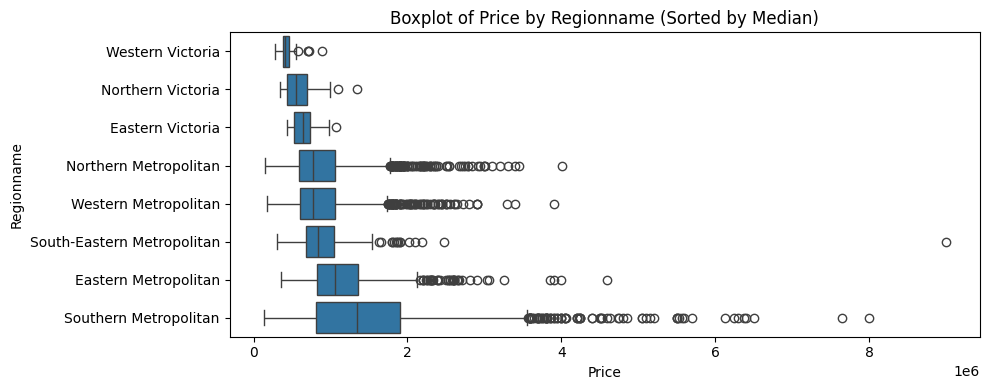

In [ ]:
categorical_vars = ['Method', 'Type', 'CouncilArea', 'Regionname']
num_var = 'Price'

for cat in categorical_vars:
    print(f"\n{num_var} vs {cat}\n{'-'*50}")
    print(df[[cat, num_var]].groupby(cat).describe().round(2))

    # Sort categories by median Price
    median_sorted = df.groupby(cat)[num_var].median().sort_values().index

    # Horizontal Boxplot
    plt.figure(figsize=(10, len(median_sorted) * 0.5))
    sns.boxplot(data=df, y=cat, x=num_var, order=median_sorted)
    plt.title(f'Boxplot of {num_var} by {cat} (Sorted by Median)')
    plt.tight_layout()
    plt.show()

    # # Horizontal Violin Plot
    # plt.figure(figsize=(10, len(median_sorted) * 0.7))
    # sns.violinplot(data=df, y=cat, x=num_var, order=median_sorted, inner='quartile')
    # plt.title(f'Violin Plot of {num_var} by {cat}')
    # plt.tight_layout()
    # plt.show()


## Categorical vs categorical data - A1 important note

In [ ]:
categorical_vars = ['Method', 'Type', 'CouncilArea', 'Regionname']
num_var = 'Price'

for cat in categorical_vars:
    print(f"\n{num_var} vs {cat}\n{'-'*50}")
    print(df[[cat, num_var]].groupby(cat).describe().round(2))

    # Sort categories by median Price
    median_sorted = df.groupby(cat)[num_var].median().sort_values().index

    # Horizontal Boxplot
    plt.figure(figsize=(10, len(median_sorted) * 0.5))
    sns.boxplot(data=df, y=cat, x=num_var, order=median_sorted)
    plt.title(f'Boxplot of {num_var} by {cat} (Sorted by Median)')
    plt.tight_layout()
    plt.show()

    # # Horizontal Violin Plot
    # plt.figure(figsize=(10, len(median_sorted) * 0.7))
    # sns.violinplot(data=df, y=cat, x=num_var, order=median_sorted, inner='quartile')
    # plt.title(f'Violin Plot of {num_var} by {cat}')
    # plt.tight_layout()
    # plt.show()

,count
CouncilArea,
Boroondara City Council,810
Darebin City Council,729
Moreland City Council,647
Moonee Valley City Council,556
Glen Eira City Council,519
Maribyrnong City Council,490
Melbourne City Council,456
Brimbank City Council,416
Banyule City Council,413


In [ ]:
df['Regionname'].value_counts()

,count
Regionname,
Southern Metropolitan,2707
Northern Metropolitan,2612
Western Metropolitan,2059
Eastern Metropolitan,982
South-Eastern Metropolitan,371
Northern Victoria,62
Eastern Victoria,51
Western Victoria,43


In [ ]:
df[['CouncilArea', 'Regionname']].value_counts()

,,count
CouncilArea,Regionname,
Boroondara City Council,Southern Metropolitan,793
Darebin City Council,Northern Metropolitan,729
Moreland City Council,Northern Metropolitan,621
Moonee Valley City Council,Western Metropolitan,556
Glen Eira City Council,Southern Metropolitan,519
Maribyrnong City Council,Western Metropolitan,490
Brimbank City Council,Western Metropolitan,416
Bayside City Council,Southern Metropolitan,362
Port Phillip City Council,Southern Metropolitan,329



Method vs Type
------------------------------------------------------------


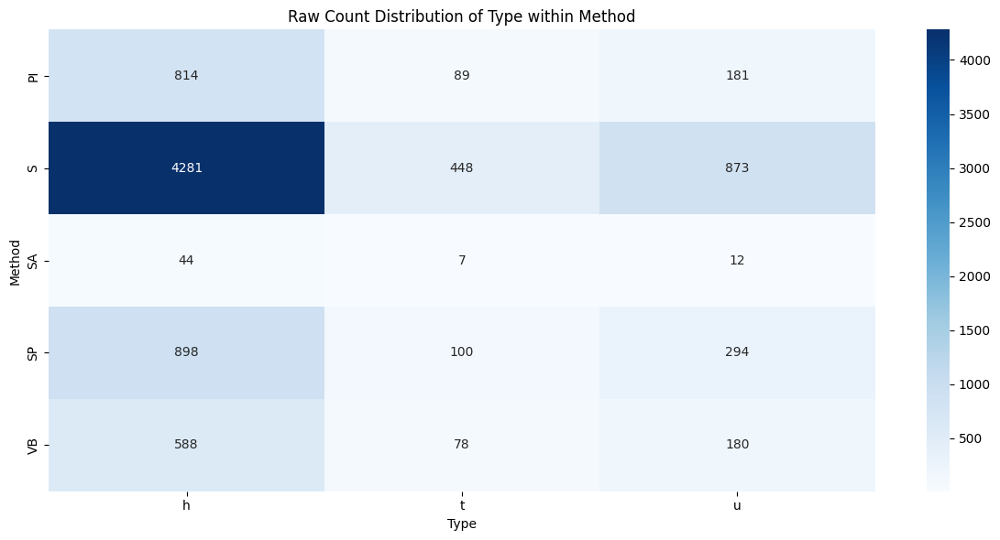

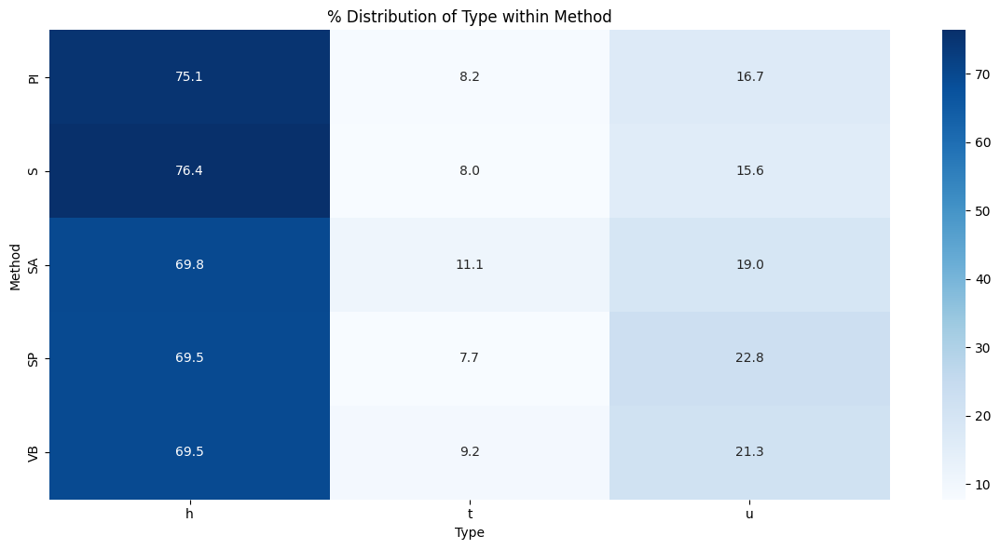

Chi² = 52.22, p = 0.0000, dof = 8
→ Significant association (p < 0.05)

Method vs CouncilArea
------------------------------------------------------------


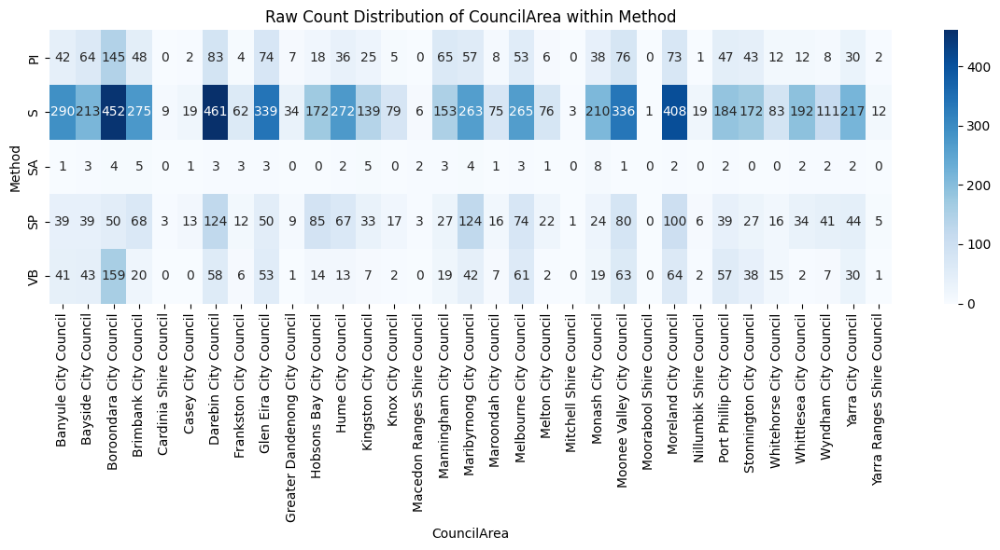

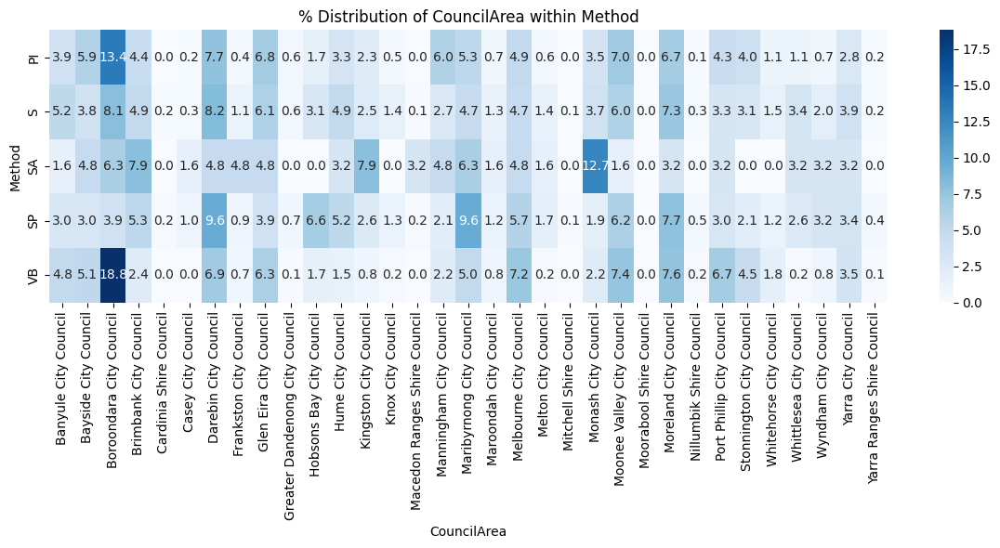

Chi² = 695.98, p = 0.0000, dof = 128
→ Significant association (p < 0.05)

Method vs Regionname
------------------------------------------------------------


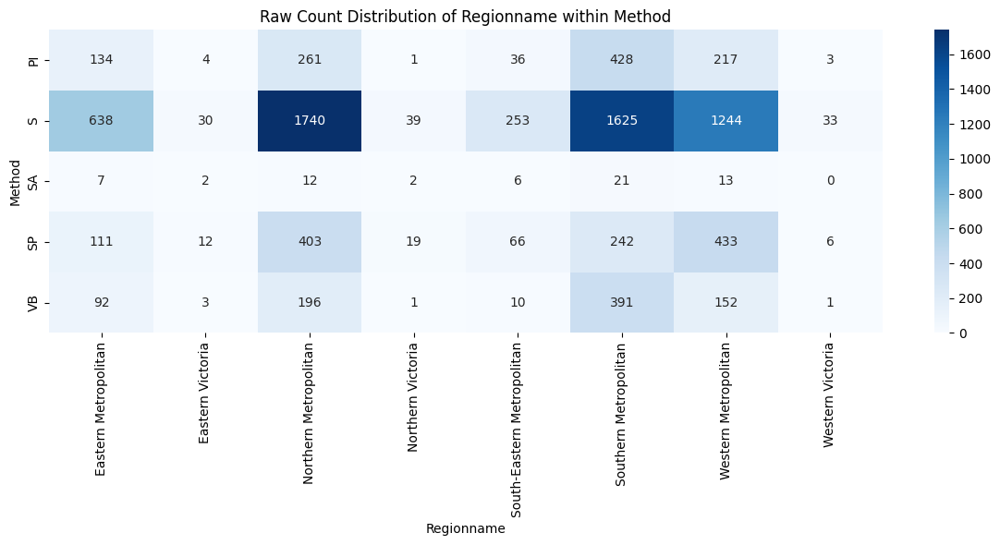

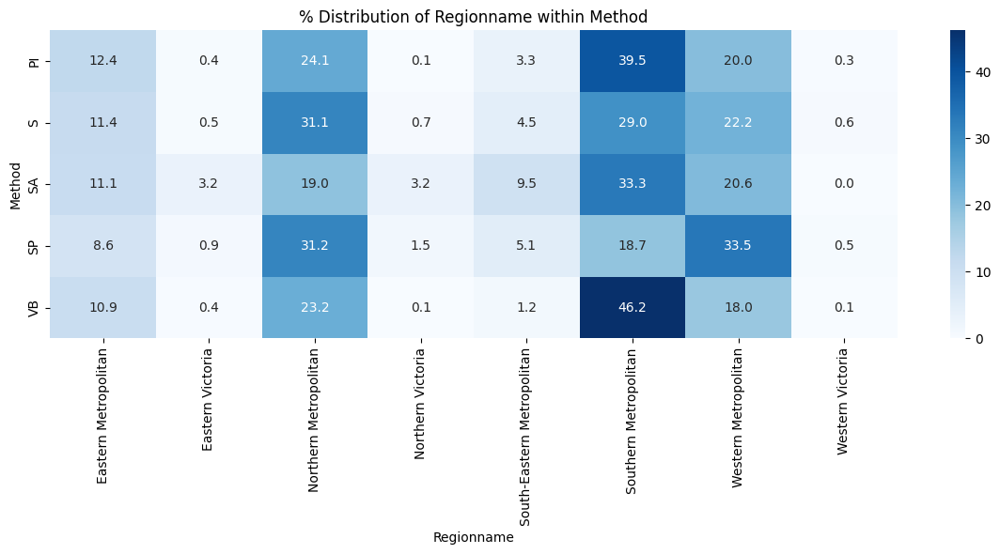

Chi² = 348.71, p = 0.0000, dof = 28
→ Significant association (p < 0.05)

Type vs CouncilArea
------------------------------------------------------------


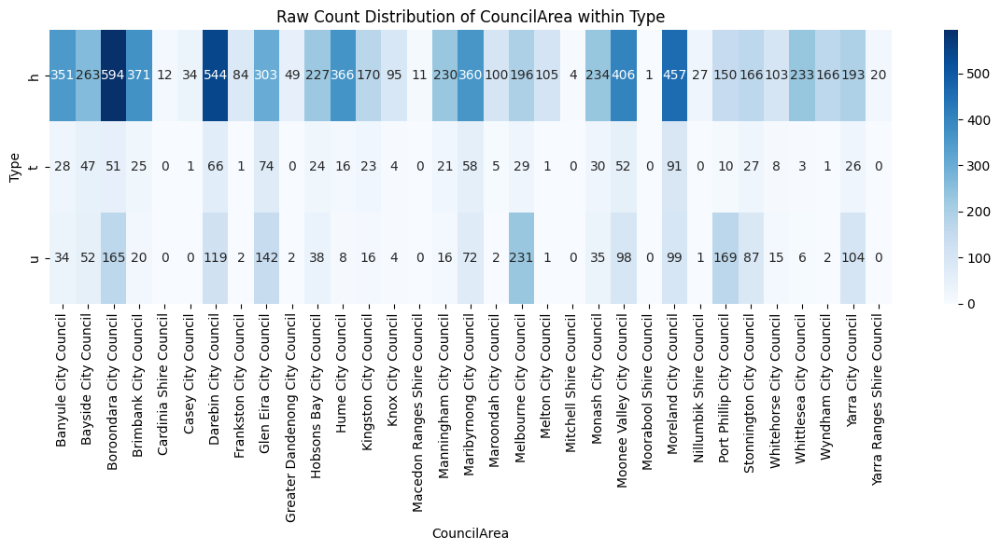

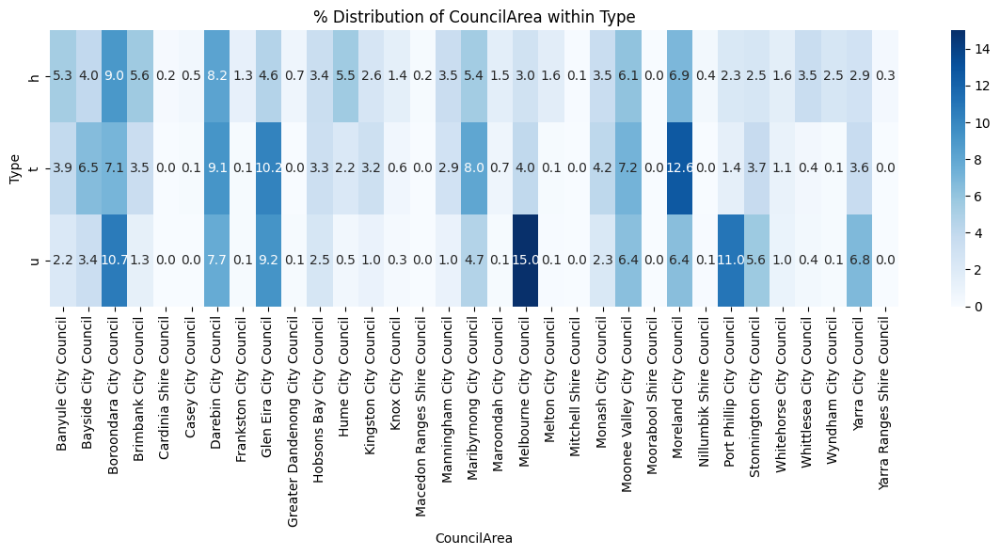

Chi² = 1310.13, p = 0.0000, dof = 64
→ Significant association (p < 0.05)

Type vs Regionname
------------------------------------------------------------


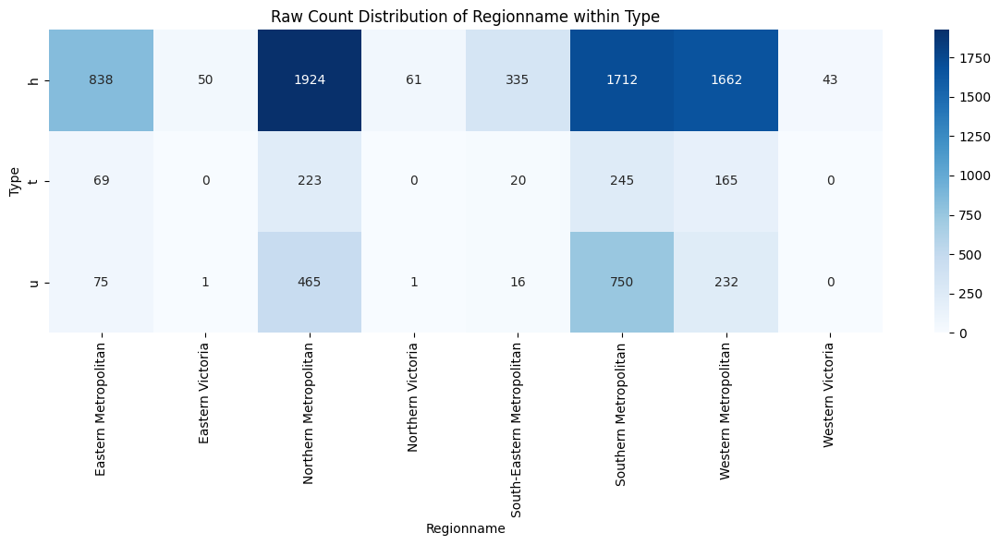

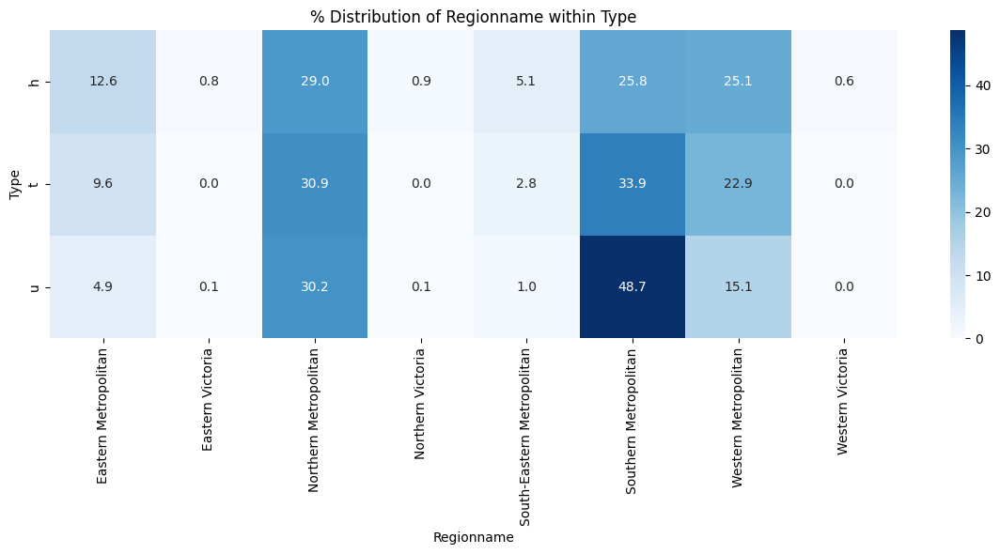

Chi² = 443.04, p = 0.0000, dof = 14
→ Significant association (p < 0.05)

CouncilArea vs Regionname
------------------------------------------------------------


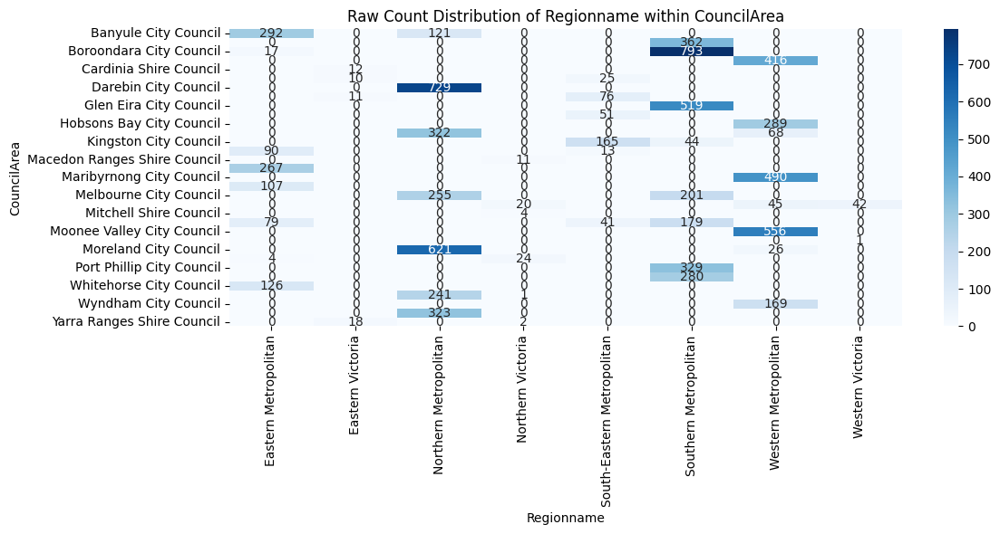

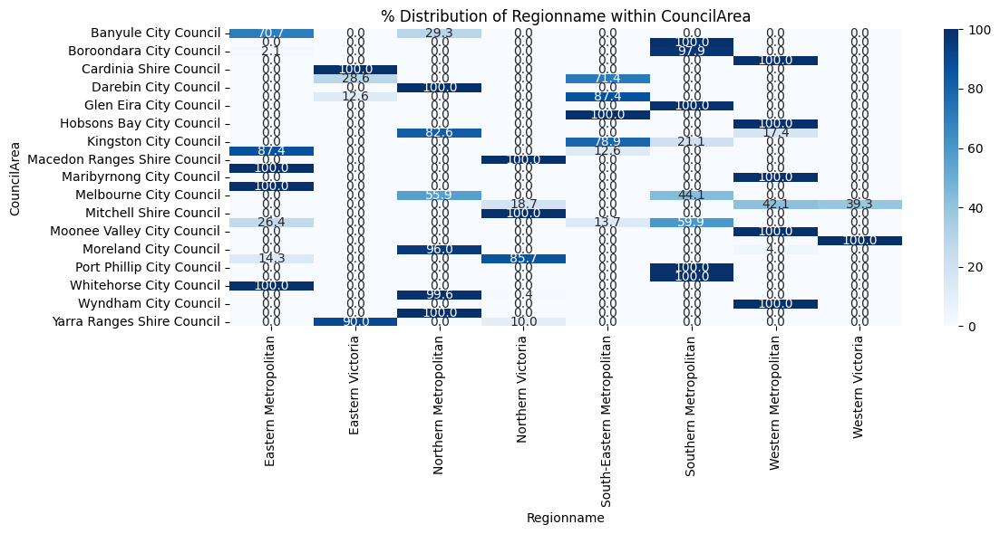

Chi² = 44353.42, p = 0.0000, dof = 224
→ Significant association (p < 0.05)


In [ ]:
for var1, var2 in itertools.combinations(categorical_vars, 2):
    print(f"\n{var1} vs {var2}\n{'-'*60}")

    # Cross-tab
    ct = pd.crosstab(df[var1], df[var2])
    ct_pct = ct.div(ct.sum(axis=1), axis=0) * 100

    # Heatmap of raw counts cross-tab
    plt.figure(figsize=(12, 6))
    sns.heatmap(ct, fmt="d", annot=True, cmap="Blues")
    plt.title(f'Raw Count Distribution of {var2} within {var1}')
    plt.ylabel(var1)
    plt.xlabel(var2)
    plt.tight_layout()
    plt.show()

    # Heatmap of percentages
    plt.figure(figsize=(12, 6))
    sns.heatmap(ct_pct, annot=True, fmt=".1f", cmap="Blues")
    plt.title(f'% Distribution of {var2} within {var1}')
    plt.ylabel(var1)
    plt.xlabel(var2)
    plt.tight_layout()
    plt.show()

    # Chi-Square Test
    chi2, p, dof, ex = chi2_contingency(ct)
    print(f"Chi² = {chi2:.2f}, p = {p:.4f}, dof = {dof}")
    if p < 0.05:
        print("→ Significant association (p < 0.05)")
    else:
        print("→ No significant association")


### ***How can you apply this for 'make' and 'model' analysis in A1***

## Multivariate analysis

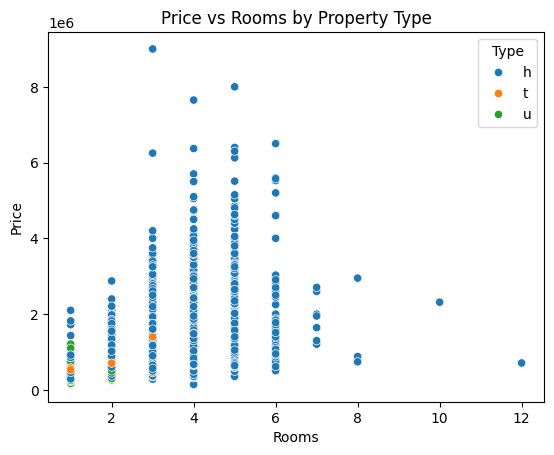

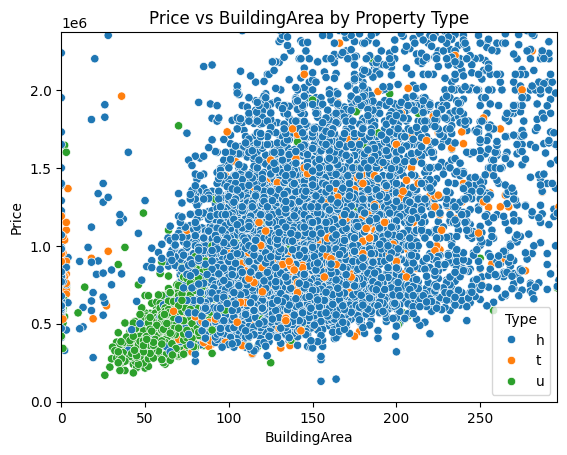

In [ ]:
sns.scatterplot(data=df, x='Rooms', y='Price', hue='Type')
plt.title("Price vs Rooms by Property Type")
plt.show()

sns.scatterplot(data=df, x='BuildingArea', y='Price', hue='Type')
plt.title("Price vs BuildingArea by Property Type")
plt.xlim(0, df['BuildingArea'].quantile(0.95))  # limit outliers
plt.ylim(0, df['Price'].quantile(0.95))
plt.show()


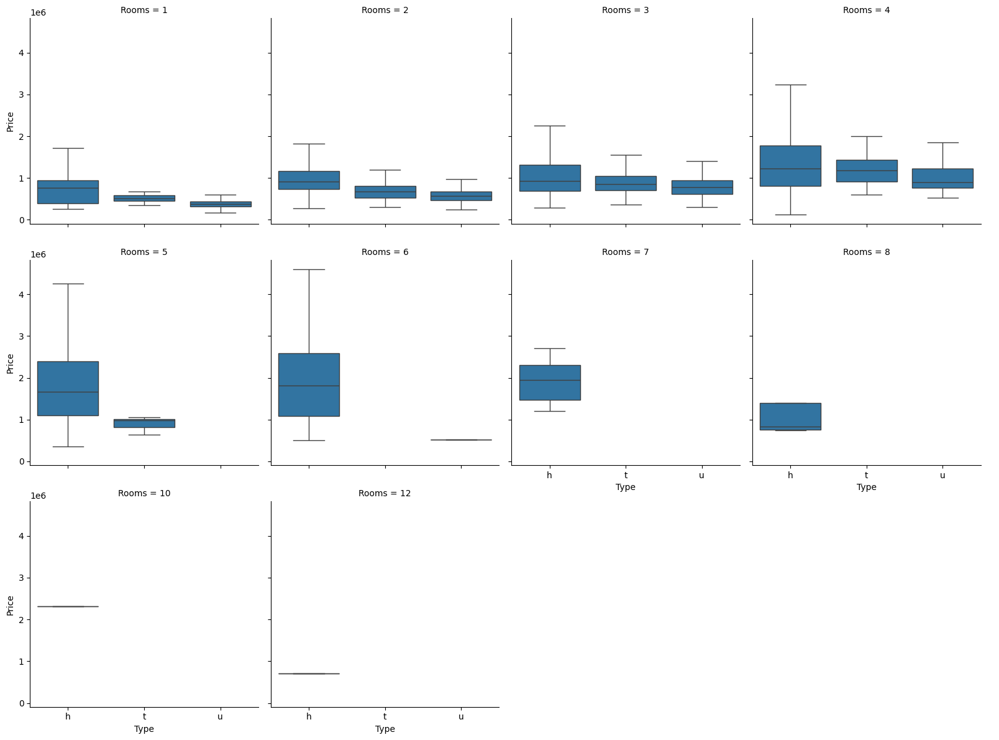

In [ ]:
sns.catplot(
    data=df, x='Type', y='Price', col='Rooms',
    kind='box', col_wrap=4, height=4, showfliers=False
)

Text(0.5, 0.98, 'Price ~ BuildingArea stratified by Type and Method')

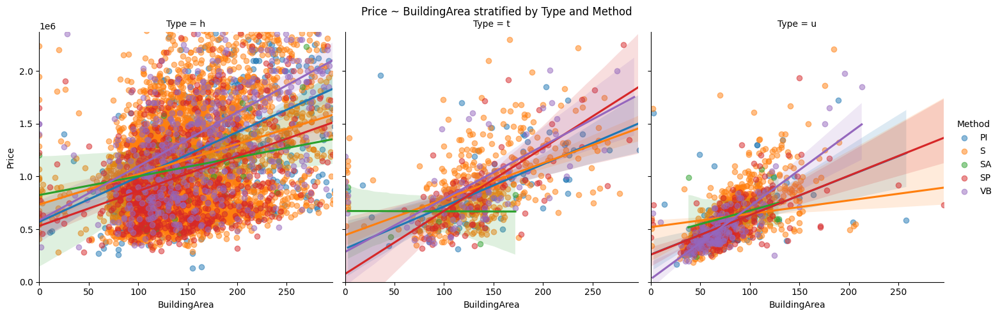

In [ ]:
g = sns.lmplot(
    data=df[df['BuildingArea'].notna()],
    x='BuildingArea', y='Price',
    col='Type', hue='Method',
    height=5, scatter_kws={'alpha': 0.5},
    # line_kws={'color': 'black'}
)
g.set(xlim=(0, df['BuildingArea'].quantile(0.95)), ylim=(0, df['Price'].quantile(0.95)))
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Price ~ BuildingArea stratified by Type and Method")


In [ ]:
group_summary = df.groupby(['Regionname', 'Type'])[['Price', 'BuildingArea']].describe().round(2)
display(group_summary)


<ipython-input-62-1651387b2e3d>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_summary = df.groupby(['Regionname', 'Type'])[['Price', 'BuildingArea']].describe().round(2)


Price                                 \
                                  count       mean       std       min   
Regionname                 Type                                          
Eastern Metropolitan       h     838.00 1226215.25 487594.62 430000.00   
                           t      69.00  838780.43 206445.74 370000.00   
                           u      75.00  677974.67 171660.44 360000.00   
Eastern Victoria           h      50.00  666139.64 159010.70 435000.00   
                           u       1.00  447000.00       NaN 447000.00   
Northern Metropolitan      h    1924.00  974916.29 436180.62 145000.00   
                           t     223.00  745406.43 260261.97 310000.00   
                           u     465.00  539752.75 220421.79 216000.00   
Northern Victoria          h      61.00  600172.13 208692.59 345000.00   
                           u       1.00  530000.00       NaN 530000.00   
South-Eastern Metropolitan h     335.00  938768.18 542873.09 400000.00   
                           t      20.00  914237.50 362060.25 386000.00   
                           u      16.00  597218.75 148657.88 305000.00   
Southern Metropolitan      h    1712.00 1908334.68 856207.70 131000.00   
                           t     245.00 1189961.22 455671.21 345000.00   
                           u     750.00  645087.66 258455.45 240000.00   
Western Metropolitan       h    1662.00  949693.99 425364.16 280000.00   
                           t     165.00  725546.67 218993.44 319000.00   
                           u     232.00  476083.81 156391.30 170000.00   
Western Victoria           h      43.00  445802.33 120454.11 283000.00   

                                                                             \
                                       25%        50%        75%        max   
Regionname                 Type                                               
Eastern Metropolitan       h     900500.00 1136000.00 1400750.00 4600000.00   
                           t     700000.00  822500.00  973500.00 1550000.00   
                           u     550750.00  650000.00  775000.00 1190000.00   
Eastern Victoria           h     538250.00  646750.00  733750.00 1075000.00   
                           u     447000.00  447000.00  447000.00  447000.00   
Northern Metropolitan      h     665000.00  860750.00 1200000.00 4011000.00   
                           t     565000.00  700000.00  892500.00 1750000.00   
                           u     407500.00  493000.00  620250.00 1935000.00   
Northern Victoria          h     438000.00  565000.00  700000.00 1350000.00   
                           u     530000.00  530000.00  530000.00  530000.00   
South-Eastern Metropolitan h     698625.00  860000.00 1050000.00 9000000.00   
                           t     751250.00  832500.00 1062000.00 1830000.00   
                           u     561250.00  606750.00  676000.00  810000.00   
Southern Metropolitan      h    1340000.00 1720000.00 2250000.00 8000000.00   
                           t     870000.00 1101000.00 1375000.00 3820000.00   
                           u     475000.00  600000.00  760000.00 2460000.00   
Western Metropolitan       h     650000.00  840000.00 1155000.00 3900000.00   
                           t     570000.00  714000.00  840000.00 1731000.00   
                           u     369375.00  450000.00  565250.00 1170000.00   
Western Victoria           h     385000.00  415000.00  458000.00  892000.00   

                                BuildingArea                              \
                                       count   mean    std    min    25%   
Regionname                 Type                                            
Eastern Metropolitan       h          838.00 182.87  83.92   0.00 128.00   
                           t           69.00 133.70  39.97   3.00 113.00   
                           u           75.00 104.63  41.25  55.00  80.00   
Eastern Victoria           h           50.00 172.19  92.9

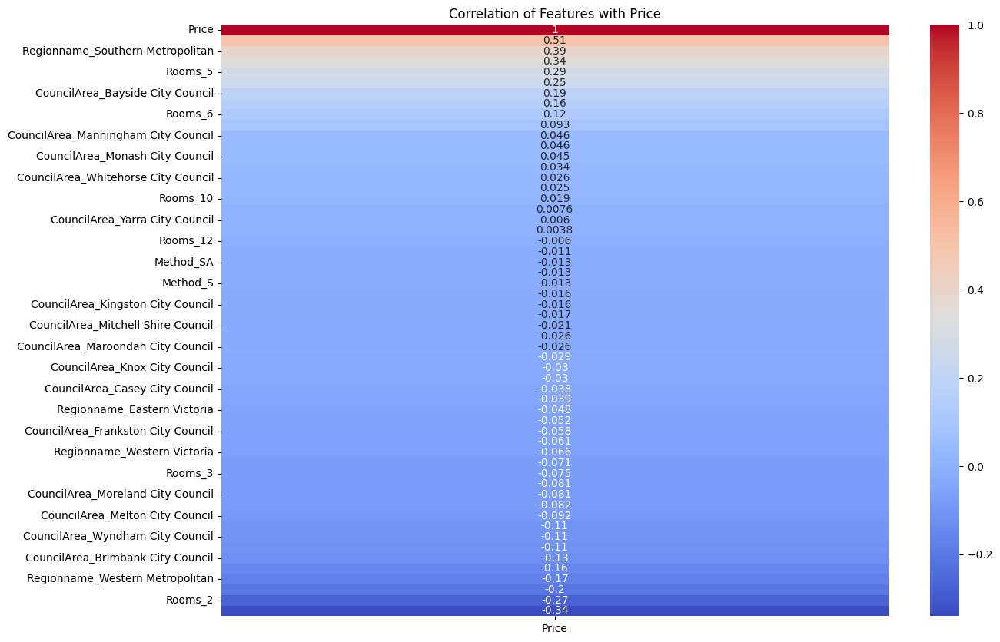

In [ ]:
df_encoded = pd.get_dummies(df[['Rooms', 'BuildingArea', 'Price'] + categorical_vars], drop_first=True)
corr_matrix = df_encoded.corr()

plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix[['Price']].sort_values(by='Price', ascending=False), annot=True, cmap='coolwarm')
plt.title("Correlation of Features with Price")
plt.show()


# Homework: Apply What You Learned!

1. Load a different dataset (e.g., assignment_data.csv).
2. Perform data inspection, cleaning, and transformation.
3. Conduct univariate, bivariate and multivariate analyses for your Assignment 1


# New Section

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
import itertools

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

In [4]:
# # Replace with the correct file path from your Google Drive
# file_path = '/content/Melbourne_housing_FULL (1).csv'

# # Load the dataset into a pandas DataFrame
# df = pd.read_csv(file_path)

In [5]:
# url = 'https://raw.githubusercontent.com/ABAL-DU/MIS140_Resources/refs/heads/main/MELBOURNE_HOUSE_PRICES_LESS.csv'
url = 'https://raw.githubusercontent.com/ABAL-DU/MIS140_Resources/refs/heads/main/Melbourne_housing_FULL.csv'
# Load the dataset into a pandas DataFrame
df = pd.read_csv(url)

In [6]:
df

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,68 Studley St,2,h,NaN,SS,Jellis,3/09/2016,2.5,3067.0,...,1.0,1.0,126.0,NaN,NaN,Yarra City Council,-37.80140,144.99580,Northern Metropolitan,4019.0
1,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra City Council,-37.79960,144.99840,Northern Metropolitan,4019.0
2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra City Council,-37.80790,144.99340,Northern Metropolitan,4019.0
3,Abbotsford,18/659 Victoria St,3,u,NaN,VB,Rounds,4/02/2016,2.5,3067.0,...,2.0,1.0,0.0,NaN,NaN,Yarra City Council,-37.81140,145.01160,Northern Metropolitan,4019.0
4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra City Council,-37.80930,144.99440,Northern Metropolitan,4019.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34852,Yarraville,13 Burns St,4,h,1480000.0,PI,Jas,24/02/2018,6.3,3013.0,...,1.0,3.0,593.0,NaN,NaN,Maribyrnong City Council,-37.81053,144.88467,Western Metropolitan,6543.0
34853,Yarraville,29A Murray St,2,h,888000.0,SP,Sweeney,24/02/2018,6.3,3013.0,...,2.0,1.0,98.0,104.0,2018.0,Maribyrnong City Council,-37.81551,144.88826,Western Metropolitan,6543.0
34854,Yarraville,147A Severn St,2,t,705000.0,S,Jas,24/02/2018,6.3,3013.0,...,1.0,2.0,220.0,120.0,2000.0,Maribyrnong City Council,-37.82286,144.87856,Western Metropolitan,6543.0
34855,Yarraville,12/37 Stephen St,3,h,1140000.0,SP,hockingstuart,24/02/2018,6.3,3013.0,...,NaN,NaN,NaN,NaN,NaN,Maribyrnong City Council,NaN,NaN,Western Metropolitan,6543.0


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34857 entries, 0 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         34857 non-null  object 
 1   Address        34857 non-null  object 
 2   Rooms          34857 non-null  int64  
 3   Type           34857 non-null  object 
 4   Price          27247 non-null  float64
 5   Method         34857 non-null  object 
 6   SellerG        34857 non-null  object 
 7   Date           34857 non-null  object 
 8   Distance       34856 non-null  float64
 9   Postcode       34856 non-null  float64
 10  Bedroom2       26640 non-null  float64
 11  Bathroom       26631 non-null  float64
 12  Car            26129 non-null  float64
 13  Landsize       23047 non-null  float64
 14  BuildingArea   13742 non-null  float64
 15  YearBuilt      15551 non-null  float64
 16  CouncilArea    34854 non-null  object 
 17  Lattitude      26881 non-null  float64
 18  Longti

In [8]:
df.isna().sum()

,0
Suburb,0
Address,0
Rooms,0
Type,0
Price,7610
Method,0
SellerG,0
Date,0
Distance,1
Postcode,1


In [9]:
# Convert df['Date'] to datetime64[ns]
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y', errors='raise')

In [10]:
# Drop rows where 'Price' is missing
df = df.dropna(subset=['Price'])

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 27247 entries, 1 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         27247 non-null  object        
 1   Address        27247 non-null  object        
 2   Rooms          27247 non-null  int64         
 3   Type           27247 non-null  object        
 4   Price          27247 non-null  float64       
 5   Method         27247 non-null  object        
 6   SellerG        27247 non-null  object        
 7   Date           27247 non-null  datetime64[ns]
 8   Distance       27246 non-null  float64       
 9   Postcode       27246 non-null  float64       
 10  Bedroom2       20806 non-null  float64       
 11  Bathroom       20800 non-null  float64       
 12  Car            20423 non-null  float64       
 13  Landsize       17982 non-null  float64       
 14  BuildingArea   10656 non-null  float64       
 15  YearBuilt      12084 non

In [12]:
# Verify missing values are removed
df.isna().sum()

,0
Suburb,0
Address,0
Rooms,0
Type,0
Price,0
Method,0
SellerG,0
Date,0
Distance,1
Postcode,1


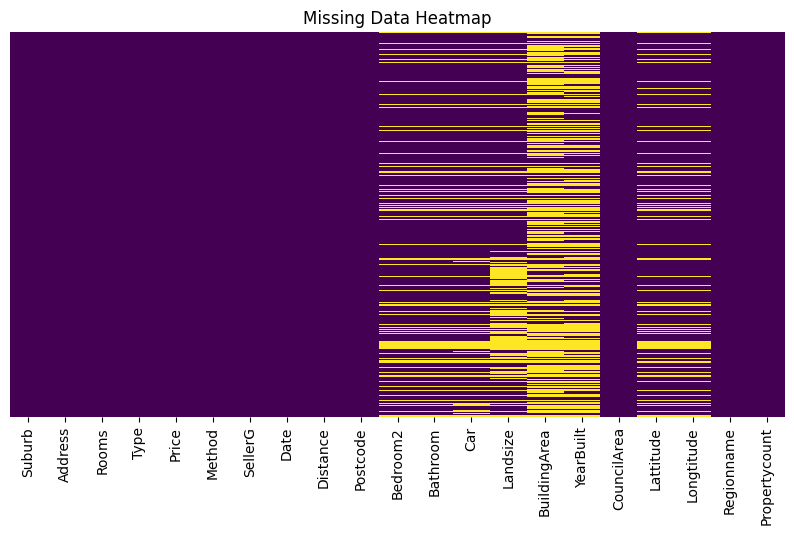

In [13]:
# Plot missing values as a heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(df.isnull(), cmap="viridis", cbar=False, yticklabels=False)
plt.title("Missing Data Heatmap")
plt.show()


In [14]:
df.dropna(inplace=True)

/tmp/ipython-input-1978/1379821321.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


In [15]:
df.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-02-04,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019.0
4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-03-04,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019.0
6,Abbotsford,55a Park St,4,h,1600000.0,VB,Nelson,2016-06-04,2.5,3067.0,...,1.0,2.0,120.0,142.0,2014.0,Yarra City Council,-37.8072,144.9941,Northern Metropolitan,4019.0
11,Abbotsford,124 Yarra St,3,h,1876000.0,S,Nelson,2016-05-07,2.5,3067.0,...,2.0,0.0,245.0,210.0,1910.0,Yarra City Council,-37.8024,144.9993,Northern Metropolitan,4019.0
14,Abbotsford,98 Charles St,2,h,1636000.0,S,Nelson,2016-10-08,2.5,3067.0,...,1.0,2.0,256.0,107.0,1890.0,Yarra City Council,-37.8060,144.9954,Northern Metropolitan,4019.0


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8887 entries, 2 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         8887 non-null   object        
 1   Address        8887 non-null   object        
 2   Rooms          8887 non-null   int64         
 3   Type           8887 non-null   object        
 4   Price          8887 non-null   float64       
 5   Method         8887 non-null   object        
 6   SellerG        8887 non-null   object        
 7   Date           8887 non-null   datetime64[ns]
 8   Distance       8887 non-null   float64       
 9   Postcode       8887 non-null   float64       
 10  Bedroom2       8887 non-null   float64       
 11  Bathroom       8887 non-null   float64       
 12  Car            8887 non-null   float64       
 13  Landsize       8887 non-null   float64       
 14  BuildingArea   8887 non-null   float64       
 15  YearBuilt      8887 non-n

In [17]:
# df.describe() no scientific number
pd.options.display.float_format = '{:.2f}'.format
df.describe()

,Rooms,Price,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,8887.00,8887.00,8887,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00
mean,3.10,1092901.63,2017-04-05 23:17:42.540790016,11.20,3111.66,3.08,1.65,1.69,523.48,149.31,1965.75,-37.80,144.99,7475.94
min,1.00,131000.00,2016-02-04 00:00:00,0.00,3000.00,0.00,1.00,0.00,0.00,0.00,1196.00,-38.17,144.42,249.00
25%,2.00,641000.00,2016-09-24 00:00:00,6.40,3044.00,2.00,1.00,1.00,212.00,100.00,1945.00,-37.86,144.92,4382.50
50%,3.00,900000.00,2017-05-13 00:00:00,10.20,3084.00,3.00,2.00,2.00,478.00,132.00,1970.00,-37.80,145.00,6567.00
75%,4.00,1345000.00,2017-09-16 00:00:00,13.90,3150.00,4.00,2.00,2.00,652.00,180.00,2000.00,-37.75,145.06,10331.00
max,12.00,9000000.00,2018-03-17 00:00:00,47.40,3977.00,12.00,9.00,10.00,42800.00,3112.00,2019.00,-37.41,145.53,21650.00
std,0.96,679381.90,NaN,6.81,112.61,0.97,0.72,0.98,1061.32,87.93,37.04,0.09,0.12,4375.02


<Axes: xlabel='Price', ylabel='Count'>

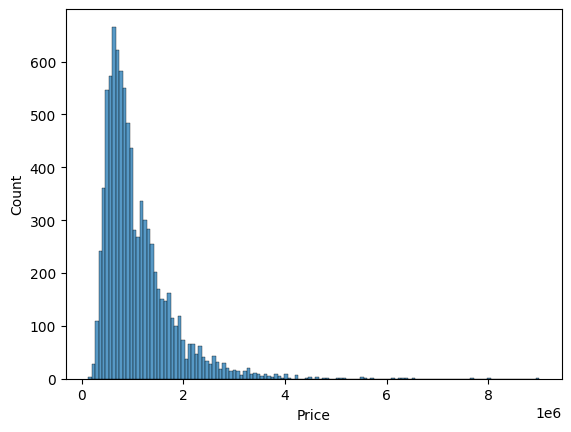

In [18]:
# Quick histplot
sns.histplot(data=df, x='Price')

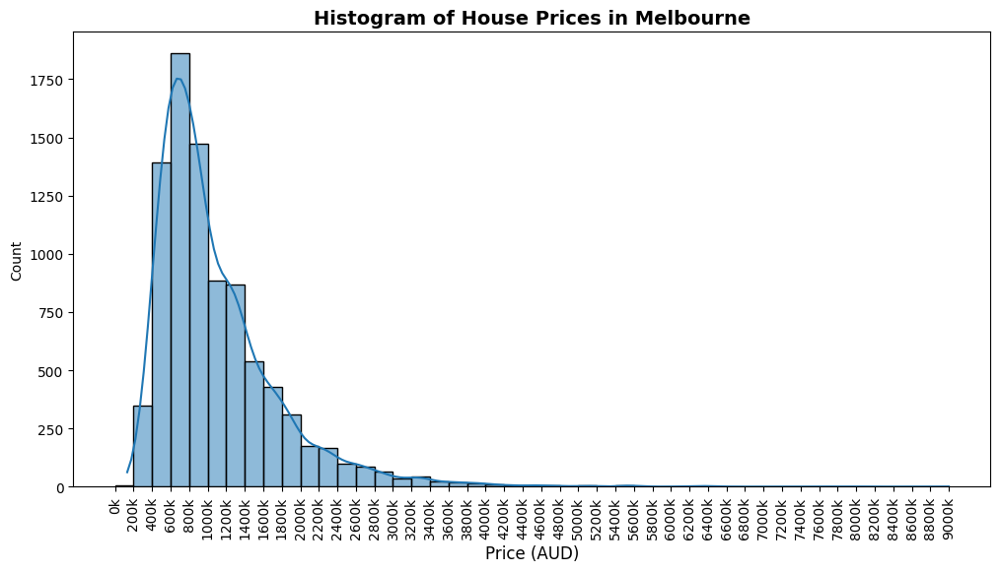

In [19]:
# Create a professional histogram of house prices with clearly labeled x-axis
plt.figure(figsize=(12, 6))

# Define bin edges starting from 0 in 200k increments
bin_edges = range(0, int(df['Price'].max()) + 200000, 200000)

# Plot the histogram with defined bins
sns.histplot(data=df, x="Price", bins=bin_edges, kde=True)

# Set title and labels
plt.title("Histogram of House Prices in Melbourne", fontsize=14, fontweight='bold')
plt.xlabel("Price (AUD)", fontsize=12)

# Format x-axis labels as '0', '200k', '400k', etc.
plt.xticks(bin_edges, [f"{int(x/1000)}k" for x in bin_edges], rotation=90)

# Show the plot
plt.show()


<Axes: xlabel='Price'>

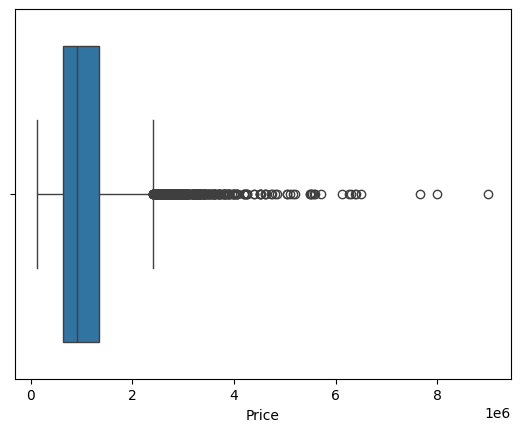

In [20]:
# Quick horizontal boxplot
sns.boxplot(data=df, x='Price')

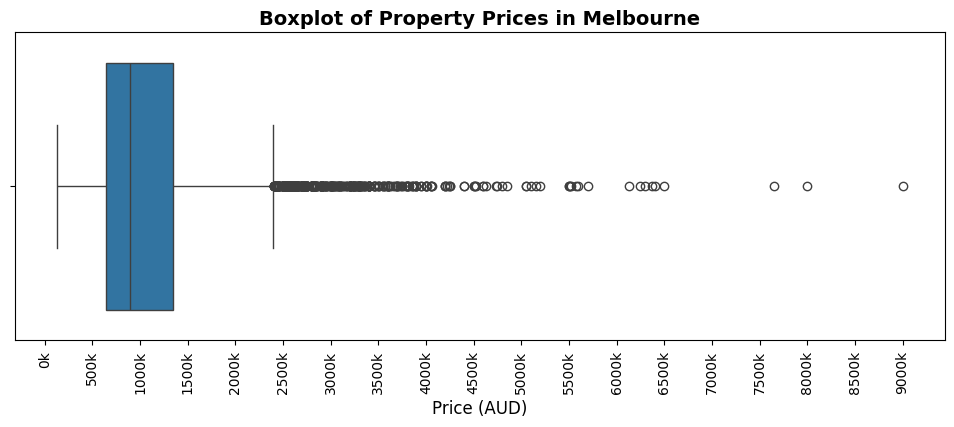

In [21]:
# Create a professional horizontal boxplot for 'Price' with k-format x-axis
plt.figure(figsize=(12, 4))

# Plot the boxplot
sns.boxplot(data=df, x='Price')

# Set title and labels
plt.title("Boxplot of Property Prices in Melbourne", fontsize=14, fontweight='bold')
plt.xlabel("Price (AUD)", fontsize=12)

# Format x-axis labels in 'k' notation (e.g., 500k instead of 500000)
plt.xticks(ticks=range(0, int(df['Price'].max()) + 500000, 500000),
           labels=[f"{int(x/1000)}k" for x in range(0, int(df['Price'].max()) + 500000, 500000)],
           rotation=90)

# Show the plot
plt.show()


<Axes: ylabel='Price'>

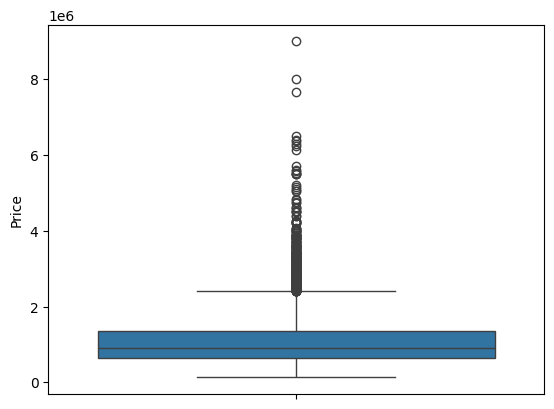

In [22]:
# Quick vertical boxplot
sns.boxplot(data=df, y='Price')

<Axes: xlabel='Rooms', ylabel='Count'>

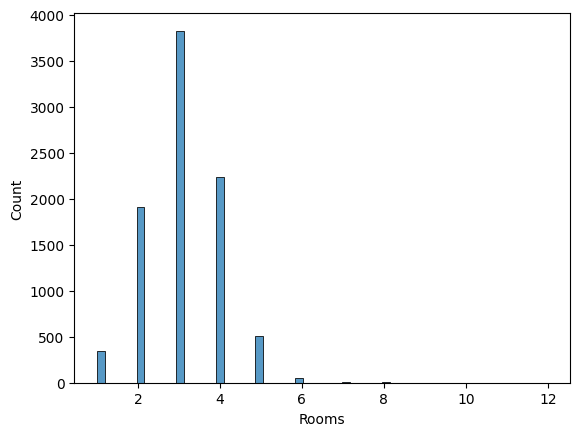

In [23]:
sns.histplot(data=df, x="Rooms")

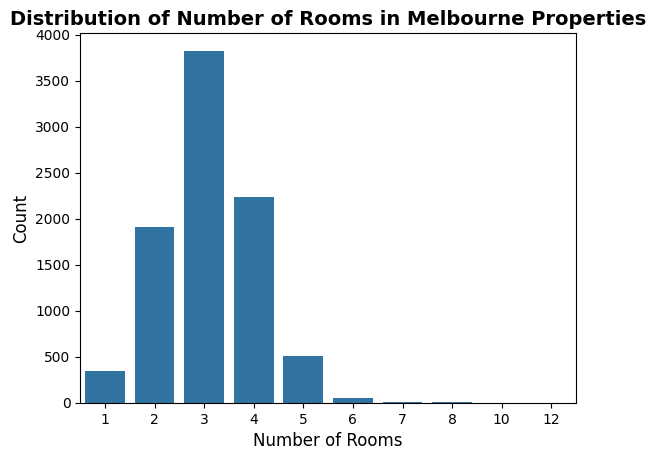

In [24]:
sns.countplot(data=df, x="Rooms")
# Set title and labels
plt.title("Distribution of Number of Rooms in Melbourne Properties", fontsize=14, fontweight='bold')
plt.xlabel("Number of Rooms", fontsize=12)
plt.ylabel("Count", fontsize=12)

# Show the plot
plt.show()


<Axes: xlabel='Distance', ylabel='Count'>

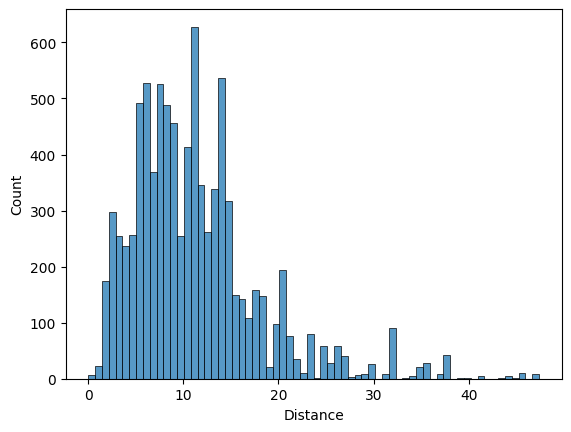

In [25]:
sns.histplot(data=df, x="Distance")

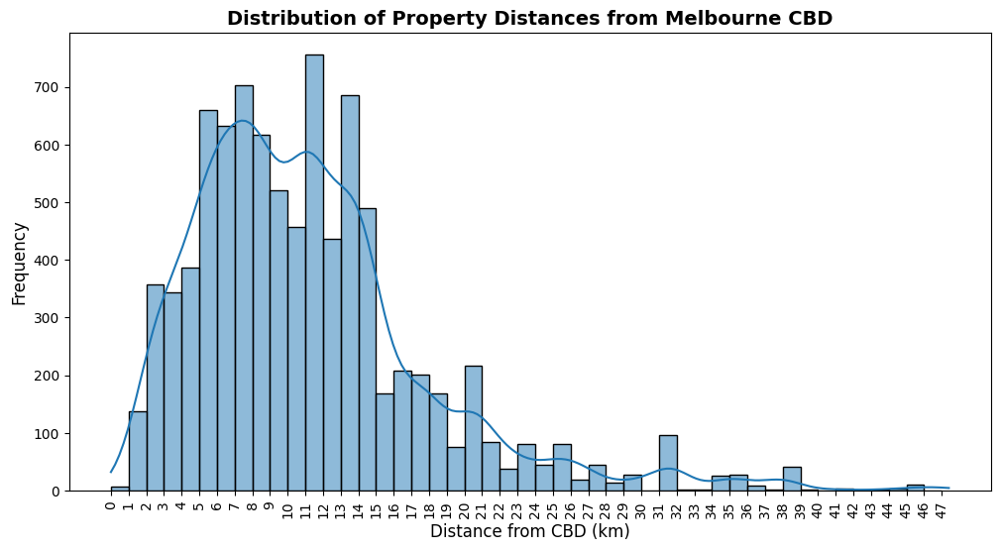

In [26]:
# Create a professional histogram for 'Distance' from CBD
plt.figure(figsize=(12, 6))

# Define appropriate bin size for better visualization
bin_edges = range(0, int(df['Distance'].max()) + 1, 1)  # Bins in 1 km increments

# Plot the histogram
sns.histplot(data=df, x="Distance", bins=bin_edges, kde=True)

# Set title and labels
plt.title("Distribution of Property Distances from Melbourne CBD", fontsize=14, fontweight='bold')
plt.xlabel("Distance from CBD (km)", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

# Format x-axis ticks in 1 km increments
plt.xticks(bin_edges, rotation=90)

# Improve aesthetics
plt.grid(False)
plt.show()


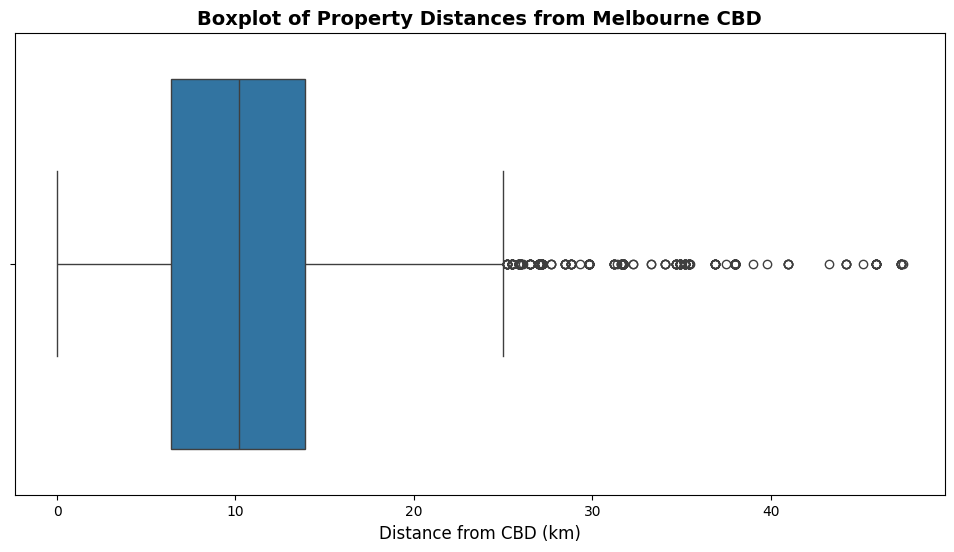

In [27]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create the boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x=df["Distance"])

# Set title and labels
plt.title("Boxplot of Property Distances from Melbourne CBD", fontsize=14, fontweight='bold')
plt.xlabel("Distance from CBD (km)", fontsize=12)

# Improve aesthetics
plt.grid(False)
plt.show()


In [28]:
# IQR methods
# Compute IQR
Q1 = df['Price'].quantile(0.25)
Q3 = df['Price'].quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers = df[(df['Price'] < lower_bound) | (df['Price'] > upper_bound)]

# Display the number of outliers detected
num_outliers = outliers.shape[0]

# Show the summary and a few outliers
print(f'Any price < ${lower_bound} or price > ${upper_bound} are identified as outliers')
print(f'Number of outliers in Price column: {num_outliers}')
print('Some sample outliers')
outliers

Any price < $-415000.0 or price > $2401000.0 are identified as outliers
Number of outliers in Price column: 420
Some sample outliers


,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
135,Albert Park,112 Beaconsfield Pde,3,h,2850000.00,PI,Buxton,2017-03-04,3.30,3206.00,...,2.00,0.00,211.00,198.00,1890.00,Port Phillip City Council,-37.85,144.95,Southern Metropolitan,3280.00
152,Albert Park,2 Dundas Pl,3,h,2615000.00,S,Cayzer,2016-12-10,3.30,3206.00,...,2.00,1.00,177.00,181.00,1880.00,Port Phillip City Council,-37.84,144.96,Southern Metropolitan,3280.00
166,Albert Park,97 Page St,3,h,3010000.00,S,Greg,2017-03-18,3.30,3206.00,...,2.00,0.00,147.00,146.00,1890.00,Port Phillip City Council,-37.85,144.96,Southern Metropolitan,3280.00
168,Albert Park,55 Withers St,4,h,2800000.00,VB,Cayzer,2016-06-18,3.30,3206.00,...,3.00,1.00,327.00,254.00,1910.00,Port Phillip City Council,-37.85,144.95,Southern Metropolitan,3280.00
178,Albert Park,115 Page St,4,h,4735000.00,S,Marshall,2017-02-25,3.30,3206.00,...,2.00,1.00,330.00,207.00,1910.00,Port Phillip City Council,-37.85,144.96,Southern Metropolitan,3280.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34460,Malvern East,11 The Avenue,4,h,2425000.00,PI,Marshall,2018-02-24,8.40,3145.00,...,2.00,2.00,651.00,230.00,1920.00,Stonnington City Council,-37.88,145.05,Southern Metropolitan,8801.00
34494,Middle Park,33 Canterbury Rd,6,h,5575000.00,S,Marshall,2018-02-24,3.00,3206.00,...,4.00,4.00,420.00,324.00,1880.00,Port Phillip City Council,-37.85,144.96,Southern Metropolitan,2019.00
34496,Middle Park,108 Hambleton St,3,h,3750000.00,SA,Greg,2018-02-24,3.00,3206.00,...,1.00,0.00,284.00,148.00,1890.00,Port Phillip City Council,-37.85,144.96,Southern Metropolitan,2019.00
34498,Middle Park,22 McGregor St,3,h,3250000.00,S,Greg,2018-02-24,3.00,3206.00,...,2.00,1.00,286.00,233.00,1900.00,Port Phillip City Council,-37.85,144.96,Southern Metropolitan,2019.00


In [29]:
# Option 1: Remove outliers
df_no_outliers = df[(df['Price'] >= lower_bound) & (df['Price'] <= upper_bound)]

In [30]:
# Option 2: Cap outliers
df_capped = df.copy()
df_capped['Price'] = np.where(df_capped['Price'] < lower_bound, lower_bound, df_capped['Price'])
df_capped['Price'] = np.where(df_capped['Price'] > upper_bound, upper_bound, df_capped['Price'])

In [31]:
# Option 3: Log Transformation (for skewed distributions)
df_transformed = df.copy()
df_transformed['Price'] = np.log1p(df_transformed['Price'])  # log(Price + 1) to handle zero values

In [32]:
# Display results
print(f"Original dataset size: {df.shape[0]}")
print(f"After removing outliers: {df_no_outliers.shape[0]}")
print(f"Example of capped prices:\n{df_capped[['Price']].head()}")
print(f"Example of log-transformed prices:\n{df_transformed[['Price']].head()}")

Original dataset size: 8887
After removing outliers: 8467
Example of capped prices:
        Price
2  1035000.00
4  1465000.00
6  1600000.00
11 1876000.00
14 1636000.00
Example of log-transformed prices:
    Price
2   13.85
4   14.20
6   14.29
11  14.44
14  14.31


<Axes: xlabel='Price', ylabel='Count'>

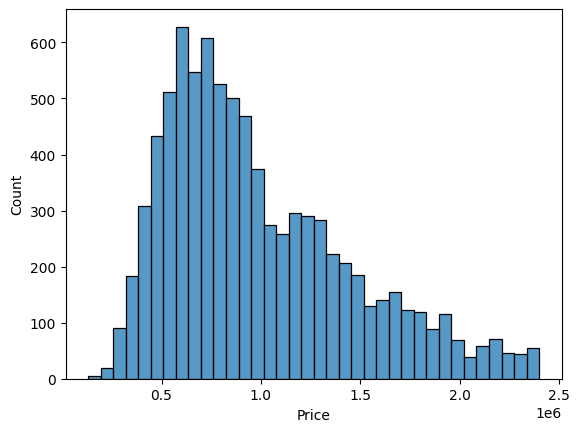

In [33]:
sns.histplot(df_no_outliers['Price'])

<Axes: ylabel='Price'>

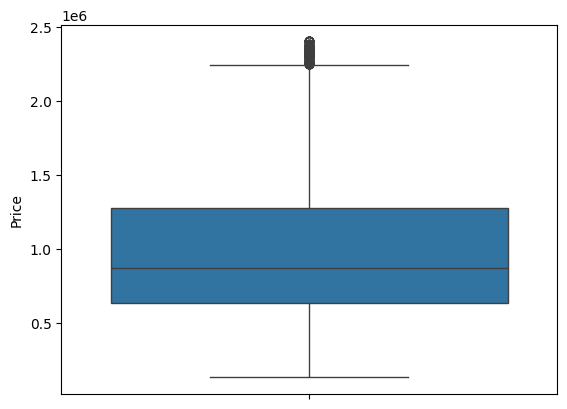

In [34]:
sns.boxplot(df_no_outliers['Price'])

<Axes: xlabel='Price', ylabel='Count'>

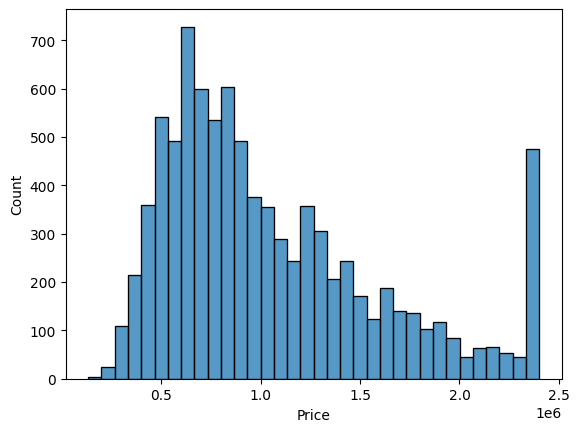

In [35]:
sns.histplot(df_capped['Price'])

<Axes: ylabel='Price'>

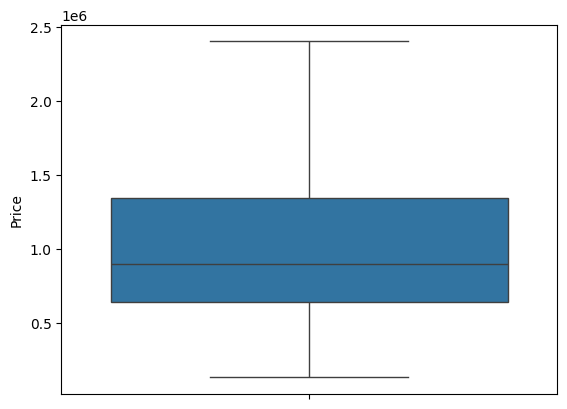

In [36]:
sns.boxplot(df_capped['Price'])

<Axes: xlabel='Price', ylabel='Count'>

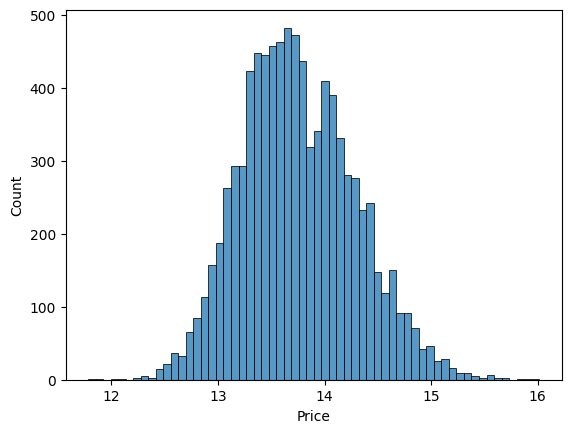

In [59]:
sns.histplot(df_transformed['Price'])

<Axes: ylabel='Price'>

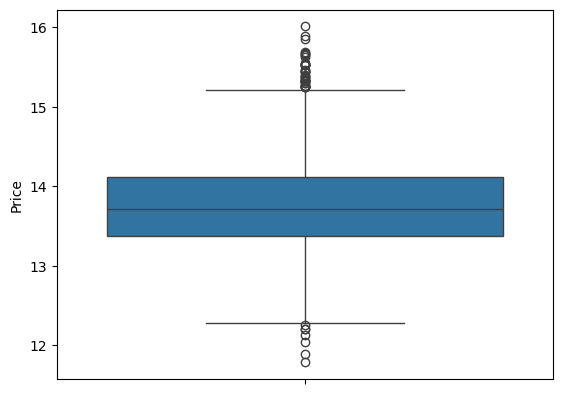

In [60]:
sns.boxplot(df_transformed['Price'])

In [61]:
df.describe()

,Rooms,Price,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,8887.00,8887.00,8887,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00,8887.00
mean,3.10,1092901.63,2017-04-05 23:17:42.540790016,11.20,3111.66,3.08,1.65,1.69,523.48,149.31,1965.75,-37.80,144.99,7475.94
min,1.00,131000.00,2016-02-04 00:00:00,0.00,3000.00,0.00,1.00,0.00,0.00,0.00,1196.00,-38.17,144.42,249.00
25%,2.00,641000.00,2016-09-24 00:00:00,6.40,3044.00,2.00,1.00,1.00,212.00,100.00,1945.00,-37.86,144.92,4382.50
50%,3.00,900000.00,2017-05-13 00:00:00,10.20,3084.00,3.00,2.00,2.00,478.00,132.00,1970.00,-37.80,145.00,6567.00
75%,4.00,1345000.00,2017-09-16 00:00:00,13.90,3150.00,4.00,2.00,2.00,652.00,180.00,2000.00,-37.75,145.06,10331.00
max,12.00,9000000.00,2018-03-17 00:00:00,47.40,3977.00,12.00,9.00,10.00,42800.00,3112.00,2019.00,-37.41,145.53,21650.00
std,0.96,679381.90,NaN,6.81,112.61,0.97,0.72,0.98,1061.32,87.93,37.04,0.09,0.12,4375.02



Rooms Summary:
 count   8887.00
mean       3.10
std        0.96
min        1.00
25%        2.00
50%        3.00
75%        4.00
max       12.00
Name: Rooms, dtype: float64
Missing: 0, Skewness: 0.33, Kurtosis: 1.38


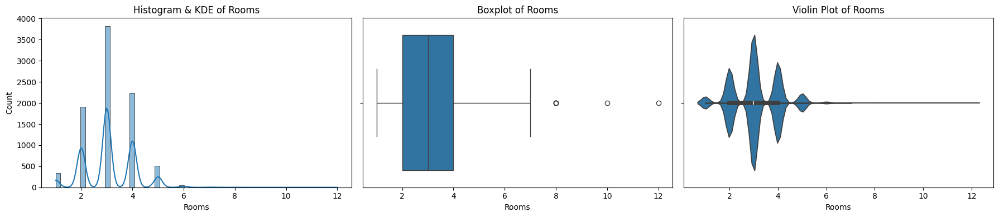


Price Summary:
 count      8887.00
mean    1092901.63
std      679381.90
min      131000.00
25%      641000.00
50%      900000.00
75%     1345000.00
max     9000000.00
Name: Price, dtype: float64
Missing: 0, Skewness: 2.41, Kurtosis: 11.04


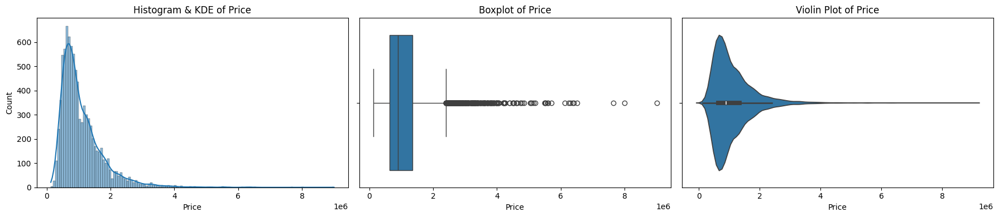


Distance Summary:
 count   8887.00
mean      11.20
std        6.81
min        0.00
25%        6.40
50%       10.20
75%       13.90
max       47.40
Name: Distance, dtype: float64
Missing: 0, Skewness: 1.55, Kurtosis: 3.62


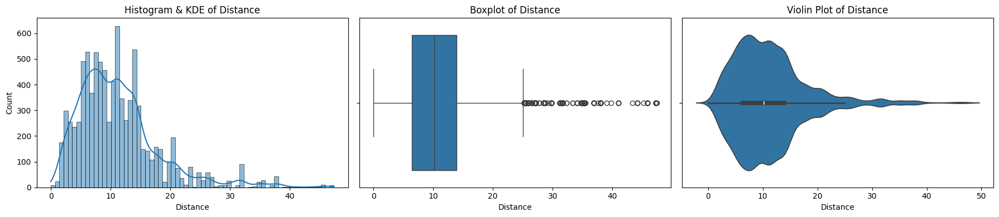


Postcode Summary:
 count   8887.00
mean    3111.66
std      112.61
min     3000.00
25%     3044.00
50%     3084.00
75%     3150.00
max     3977.00
Name: Postcode, dtype: float64
Missing: 0, Skewness: 3.91, Kurtosis: 20.87


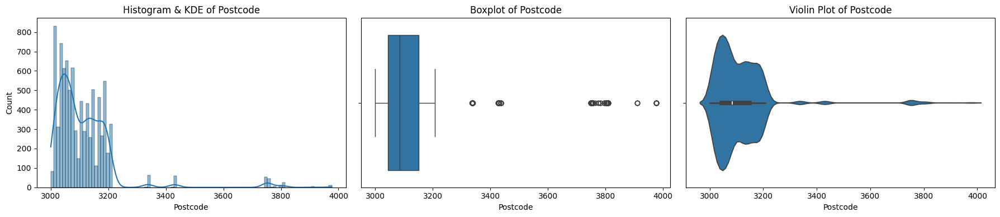


Bedroom2 Summary:
 count   8887.00
mean       3.08
std        0.97
min        0.00
25%        2.00
50%        3.00
75%        4.00
max       12.00
Name: Bedroom2, dtype: float64
Missing: 0, Skewness: 0.36, Kurtosis: 1.67


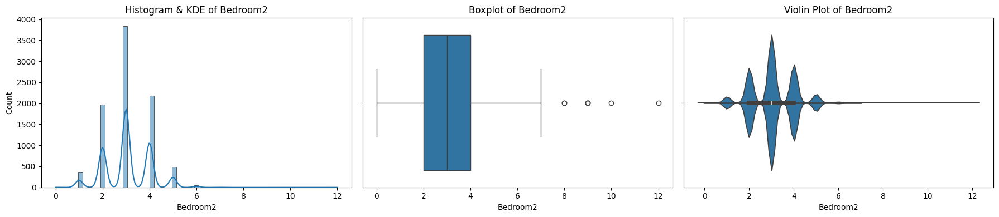


Bathroom Summary:
 count   8887.00
mean       1.65
std        0.72
min        1.00
25%        1.00
50%        2.00
75%        2.00
max        9.00
Name: Bathroom, dtype: float64
Missing: 0, Skewness: 1.26, Kurtosis: 3.67


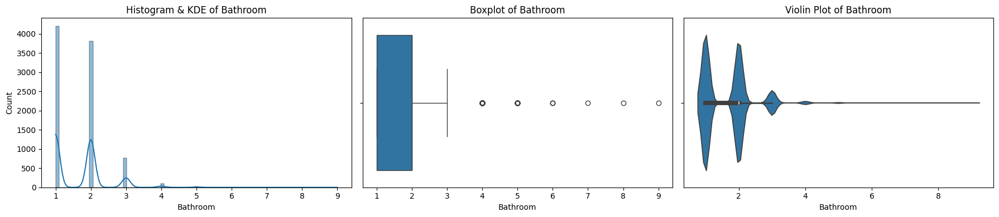


Car Summary:
 count   8887.00
mean       1.69
std        0.98
min        0.00
25%        1.00
50%        2.00
75%        2.00
max       10.00
Name: Car, dtype: float64
Missing: 0, Skewness: 1.42, Kurtosis: 5.30


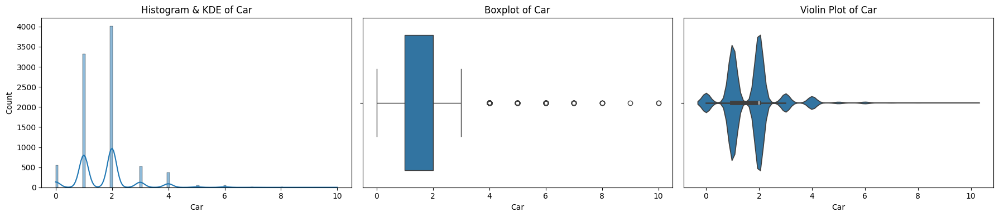


Landsize Summary:
 count    8887.00
mean      523.48
std      1061.32
min         0.00
25%       212.00
50%       478.00
75%       652.00
max     42800.00
Name: Landsize, dtype: float64
Missing: 0, Skewness: 23.11, Kurtosis: 746.33


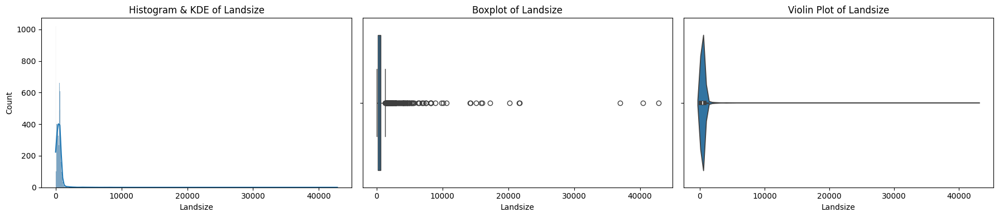


BuildingArea Summary:
 count   8887.00
mean     149.31
std       87.93
min        0.00
25%      100.00
50%      132.00
75%      180.00
max     3112.00
Name: BuildingArea, dtype: float64
Missing: 0, Skewness: 6.50, Kurtosis: 159.72


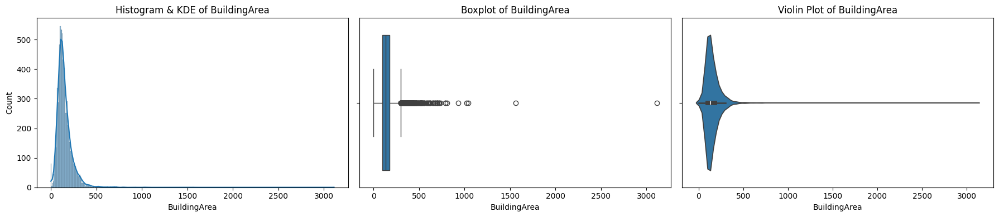


YearBuilt Summary:
 count   8887.00
mean    1965.75
std       37.04
min     1196.00
25%     1945.00
50%     1970.00
75%     2000.00
max     2019.00
Name: YearBuilt, dtype: float64
Missing: 0, Skewness: -1.49, Kurtosis: 20.18


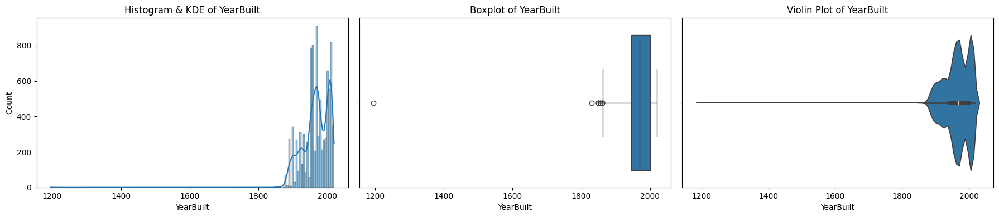


Lattitude Summary:
 count   8887.00
mean     -37.80
std        0.09
min      -38.17
25%      -37.86
50%      -37.80
75%      -37.75
max      -37.41
Name: Lattitude, dtype: float64
Missing: 0, Skewness: -0.31, Kurtosis: 1.49


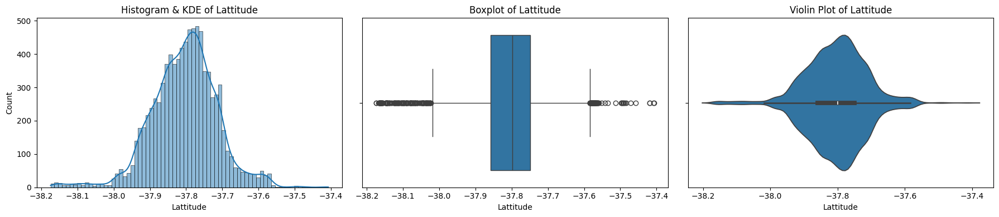


Longtitude Summary:
 count   8887.00
mean     144.99
std        0.12
min      144.42
25%      144.92
50%      145.00
75%      145.06
max      145.53
Name: Longtitude, dtype: float64
Missing: 0, Skewness: -0.34, Kurtosis: 1.57


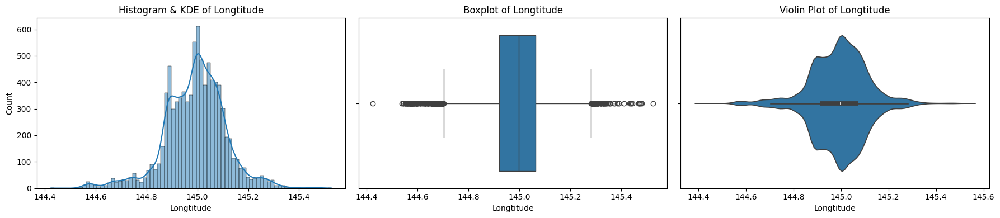


Propertycount Summary:
 count    8887.00
mean     7475.94
std      4375.02
min       249.00
25%      4382.50
50%      6567.00
75%     10331.00
max     21650.00
Name: Propertycount, dtype: float64
Missing: 0, Skewness: 0.98, Kurtosis: 0.90


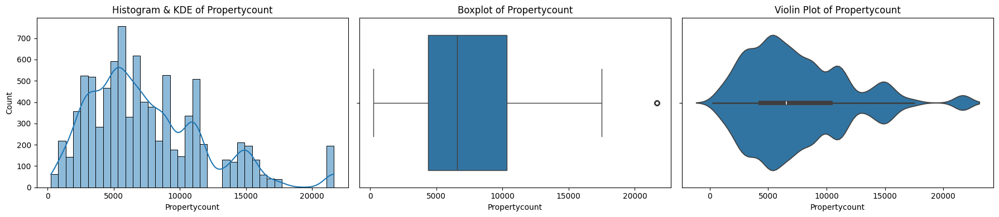

In [62]:
numeric_cols = df.select_dtypes(include='number').columns

for col in numeric_cols:
    print(f"\n{col} Summary:\n", df[col].describe())
    print(f"Missing: {df[col].isna().sum()}, Skewness: {df[col].skew():.2f}, Kurtosis: {df[col].kurtosis():.2f}")

    fig, axs = plt.subplots(1, 3, figsize=(18, 4))

    sns.histplot(df[col].dropna(), kde=True, ax=axs[0])
    axs[0].set_title(f'Histogram & KDE of {col}')

    sns.boxplot(x=df[col], ax=axs[1])
    axs[1].set_title(f'Boxplot of {col}')

    sns.violinplot(x=df[col], ax=axs[2])
    axs[2].set_title(f'Violin Plot of {col}')

    plt.tight_layout()
    plt.show()


In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8887 entries, 2 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         8887 non-null   object        
 1   Address        8887 non-null   object        
 2   Rooms          8887 non-null   int64         
 3   Type           8887 non-null   object        
 4   Price          8887 non-null   float64       
 5   Method         8887 non-null   object        
 6   SellerG        8887 non-null   object        
 7   Date           8887 non-null   datetime64[ns]
 8   Distance       8887 non-null   float64       
 9   Postcode       8887 non-null   float64       
 10  Bedroom2       8887 non-null   float64       
 11  Bathroom       8887 non-null   float64       
 12  Car            8887 non-null   float64       
 13  Landsize       8887 non-null   float64       
 14  BuildingArea   8887 non-null   float64       
 15  YearBuilt      8887 non-n

In [64]:
# Define your categorical columns here
categorical_cols = ['Suburb', 'Rooms', 'Type', 'Method', 'SellerG', 'Regionname', 'Postcode', 'CouncilArea']
df[categorical_cols] = df[categorical_cols].astype('category')

df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8887 entries, 2 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         8887 non-null   category      
 1   Address        8887 non-null   object        
 2   Rooms          8887 non-null   category      
 3   Type           8887 non-null   category      
 4   Price          8887 non-null   float64       
 5   Method         8887 non-null   category      
 6   SellerG        8887 non-null   category      
 7   Date           8887 non-null   datetime64[ns]
 8   Distance       8887 non-null   float64       
 9   Postcode       8887 non-null   category      
 10  Bedroom2       8887 non-null   float64       
 11  Bathroom       8887 non-null   float64       
 12  Car            8887 non-null   float64       
 13  Landsize       8887 non-null   float64       
 14  BuildingArea   8887 non-null   float64       
 15  YearBuilt      8887 non-n

/tmp/ipython-input-1978/2040116641.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[categorical_cols] = df[categorical_cols].astype('category')


In [65]:
df.describe(include='category')

,Suburb,Rooms,Type,Method,SellerG,Postcode,CouncilArea,Regionname
count,8887,8887,8887,8887,8887,8887.00,8887,8887
unique,315,10,3,5,250,194.00,33,8
top,Reservoir,3,h,S,Nelson,3073.00,Boroondara City Council,Southern Metropolitan
freq,194,3824,6625,5602,986,194.00,810,2707


In [66]:
# Count occurrences of each property type
df['Type'].value_counts()

,count
Type,
h,6625
u,1540
t,722


In [67]:
# Compute relative frequency of each property type
df['Type'].value_counts(normalize=True)

,proportion
Type,
h,0.75
u,0.17
t,0.08


<Axes: xlabel='Type', ylabel='count'>

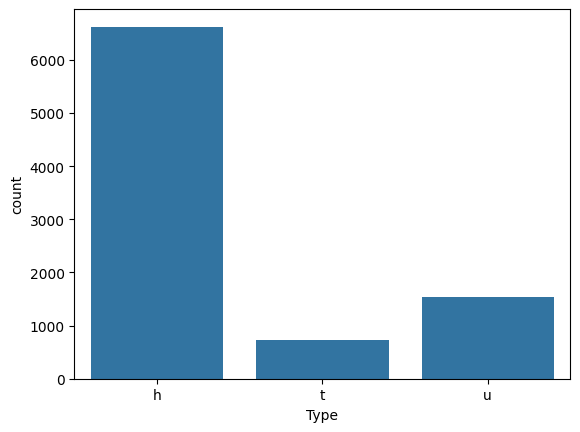

In [68]:
sns.countplot(data=df, x="Type")

<Axes: xlabel='count', ylabel='Type'>

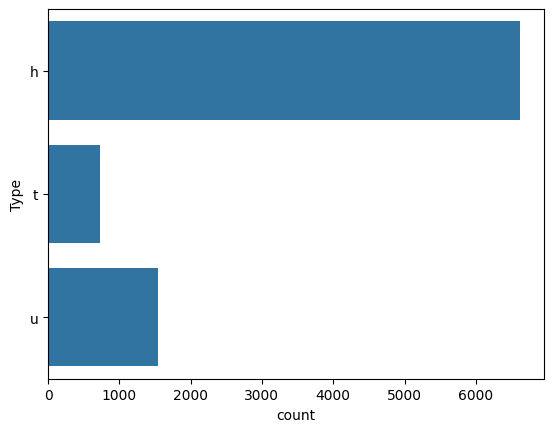

In [69]:
sns.countplot(data=df, y="Type")

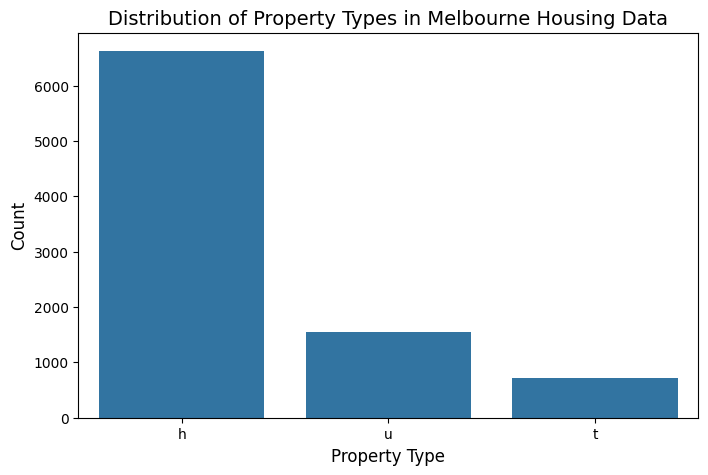

In [70]:
# Set the figure size
plt.figure(figsize=(8, 5))

# Create a count plot for property type distribution
sns.countplot(data=df, x="Type", order=df["Type"].value_counts().index)

# Add labels and title
plt.xlabel("Property Type", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("Distribution of Property Types in Melbourne Housing Data", fontsize=14)

# Display the plot
plt.show()

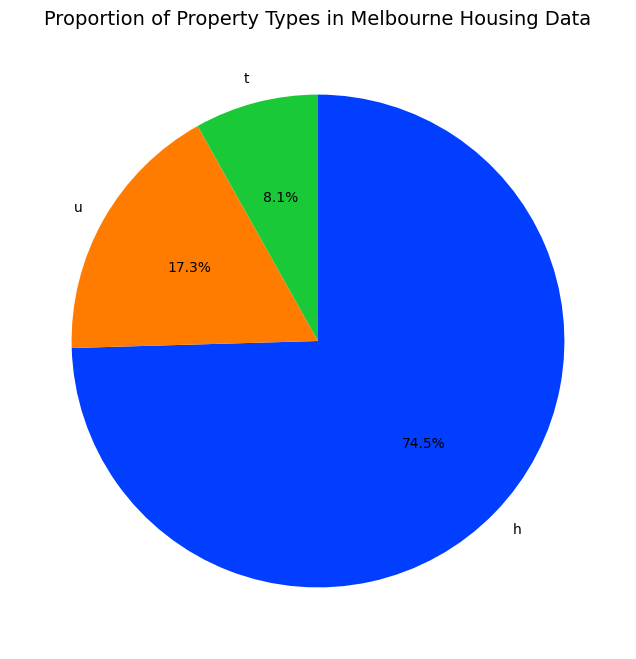

In [71]:
# Create a pie chart with sorted slices, starting at 12 o'clock (90 degrees) and in a clockwise direction
plt.figure(figsize=(8, 8))
type_counts_sorted = df['Type'].value_counts().sort_values(ascending=False)

plt.pie(type_counts_sorted, labels=type_counts_sorted.index, autopct='%1.1f%%',
        colors=sns.color_palette("bright"), startangle=90, counterclock=False)

# Add title
plt.title("Proportion of Property Types in Melbourne Housing Data", fontsize=14)

# Display the plot
plt.show()


In [72]:
# Display summary statistics for categorical variables
print("Categorical Variable Summary:")
for col in categorical_cols:
    print(f"\nColumn: {col}")
    print(df[col].value_counts())
    print("-" * 39)

Categorical Variable Summary:

Column: Suburb
Suburb
Reservoir             194
Richmond              155
Brunswick             152
Bentleigh East        138
Coburg                135
                     ... 
Whittlesea              1
Bacchus Marsh           1
Beaconsfield            1
Beaconsfield Upper      1
Yarra Glen              1
Name: count, Length: 315, dtype: int64
---------------------------------------

Column: Rooms
Rooms
3     3824
4     2240
2     1912
5      507
1      340
6       51
7        7
8        4
10       1
12       1
Name: count, dtype: int64
---------------------------------------

Column: Type
Type
h    6625
u    1540
t     722
Name: count, dtype: int64
---------------------------------------

Column: Method
Method
S     5602
SP    1292
PI    1084
VB     846
SA      63
Name: count, dtype: int64
---------------------------------------

Column: SellerG
SellerG
Nelson                     986
Jellis                     873
Barry                      741
hockings

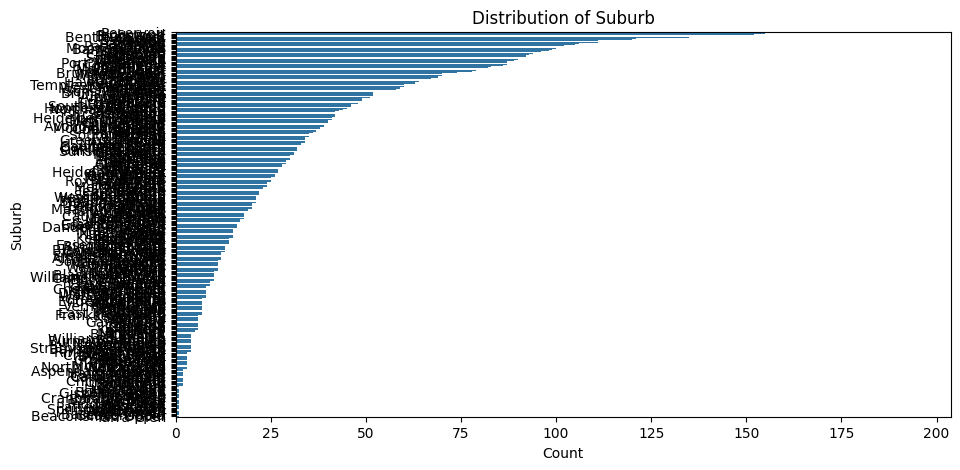

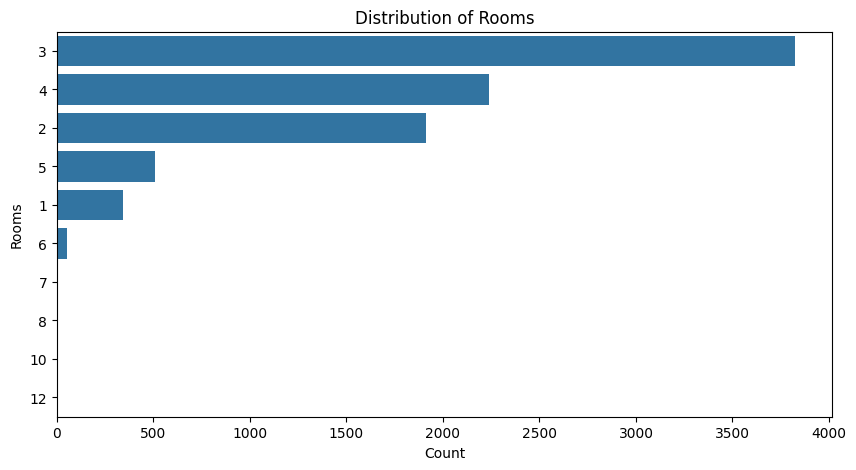

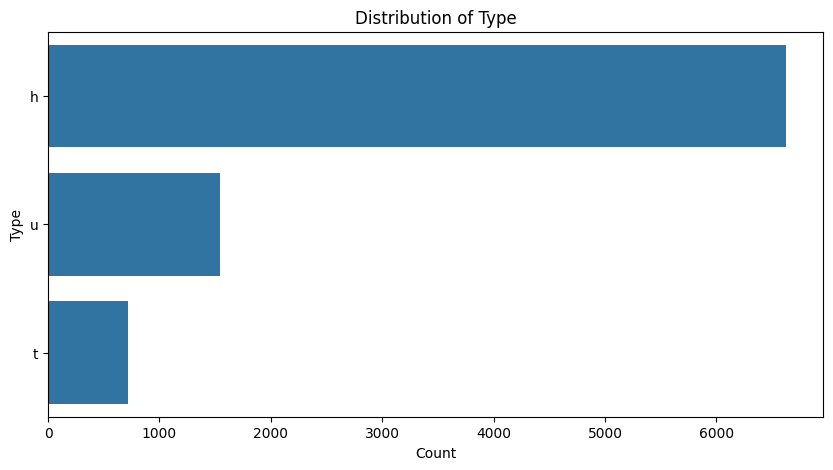

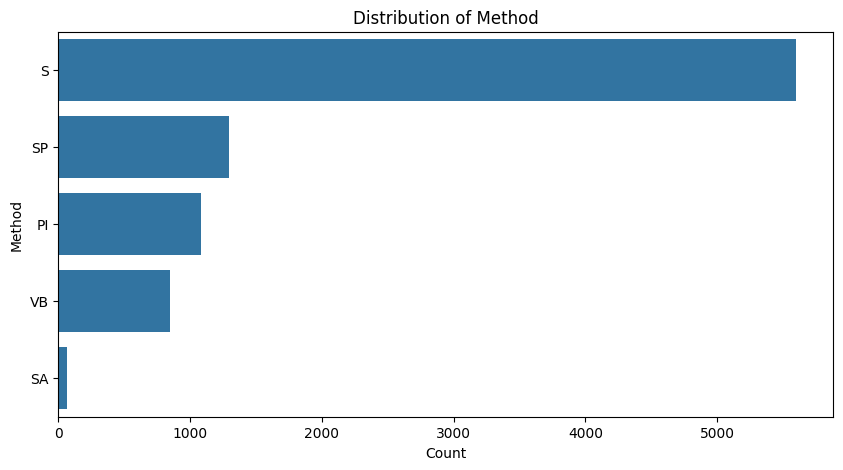

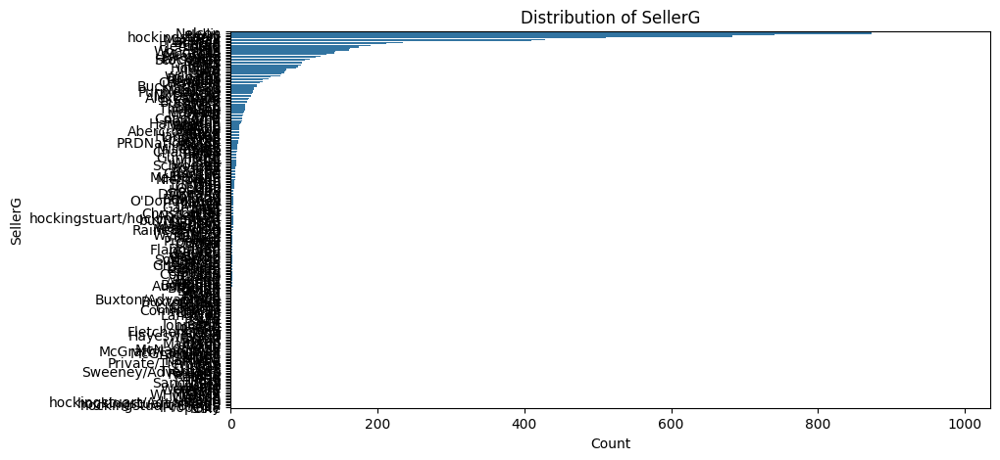

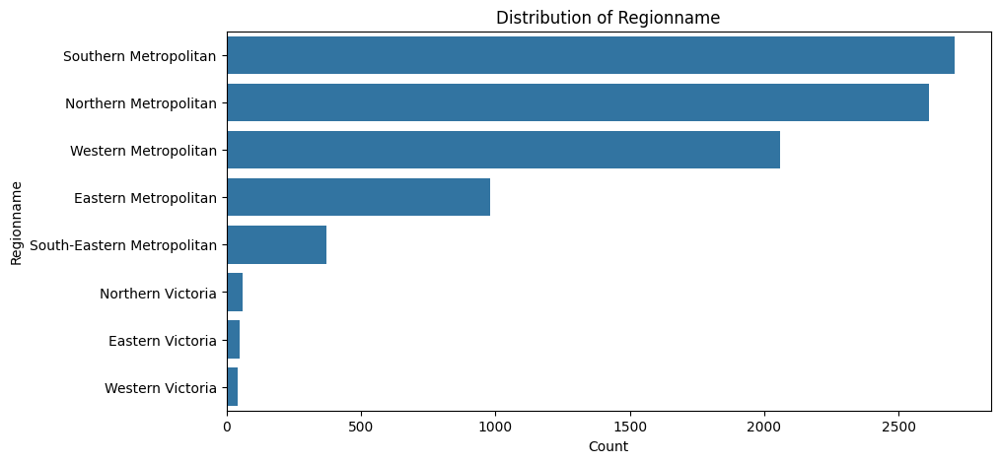

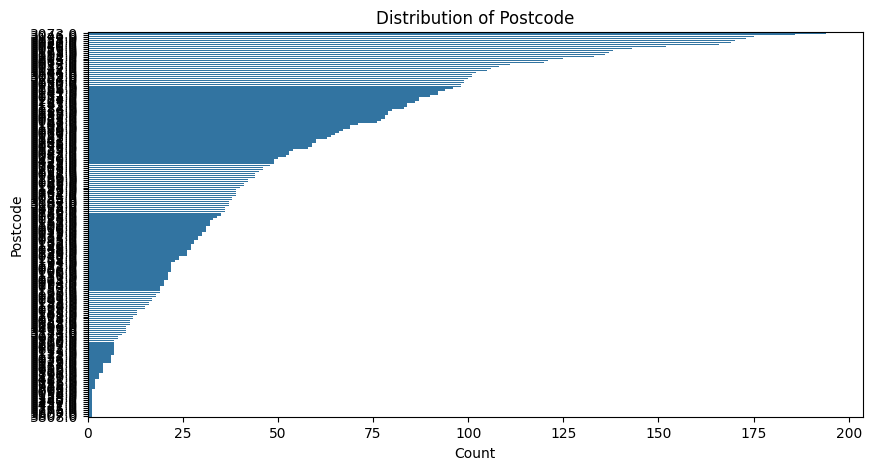

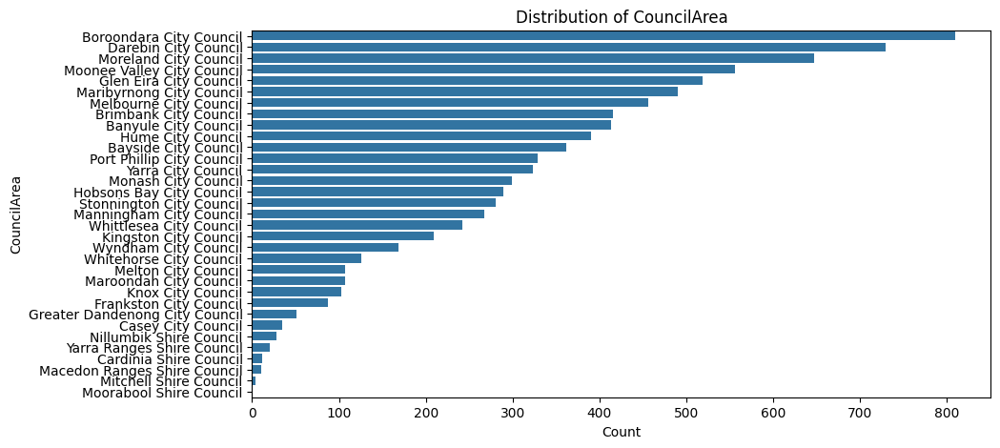

In [73]:
# Visualizing categorical distributions
for col in categorical_cols:
    plt.figure(figsize=(10, 5))
    sns.countplot(data=df, y=col, order=df[col].value_counts().index,)
    plt.xlabel("Count")
    plt.ylabel(col)
    plt.title(f"Distribution of {col}")
    plt.show()

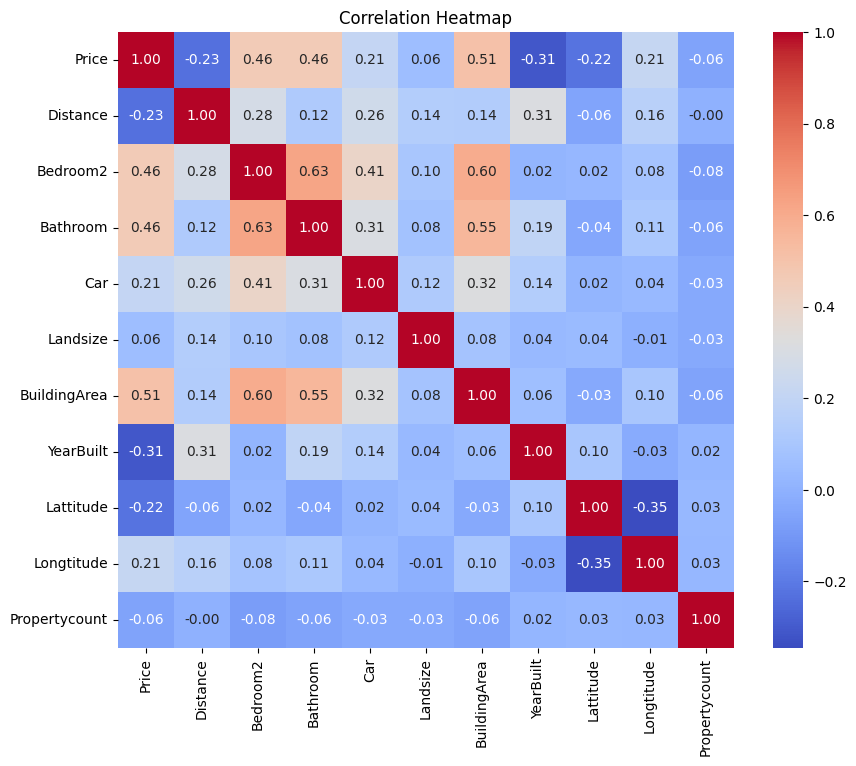

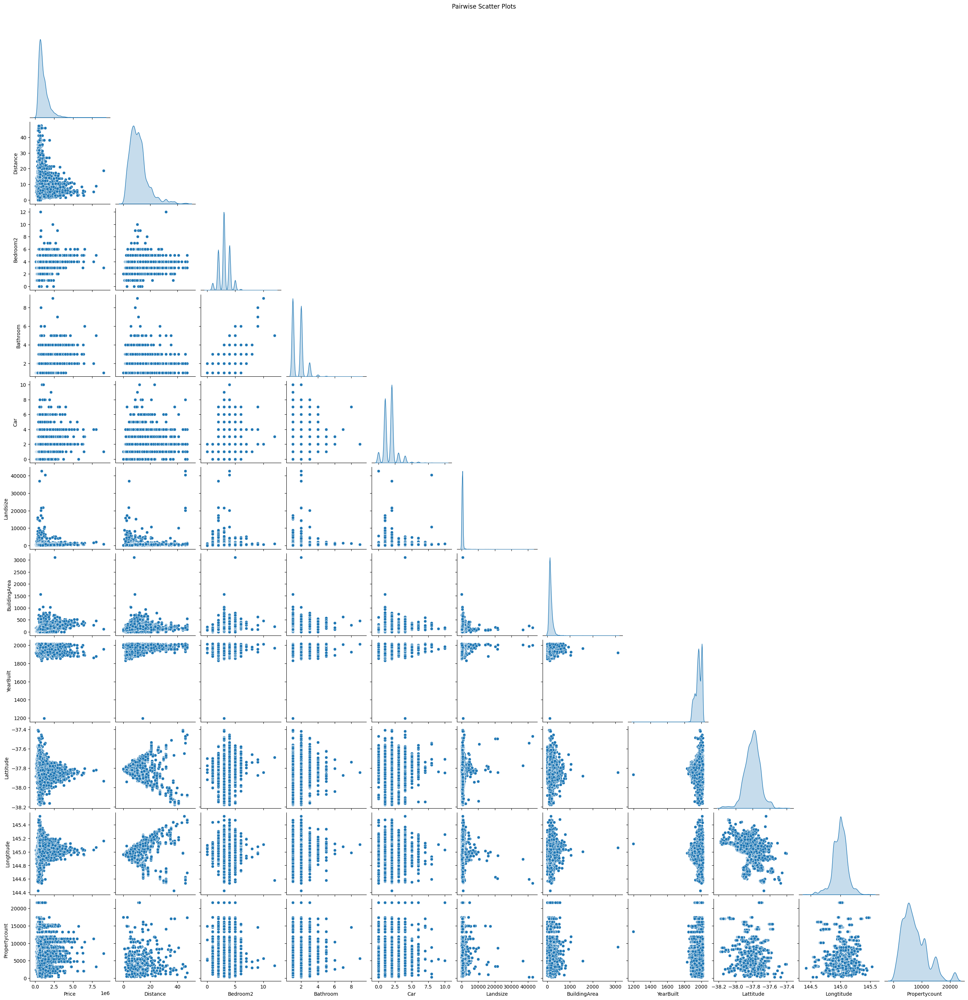


Top correlated pairs (|r| > 0.7):
Bedroom2 vs Bathroom: r = 0.63


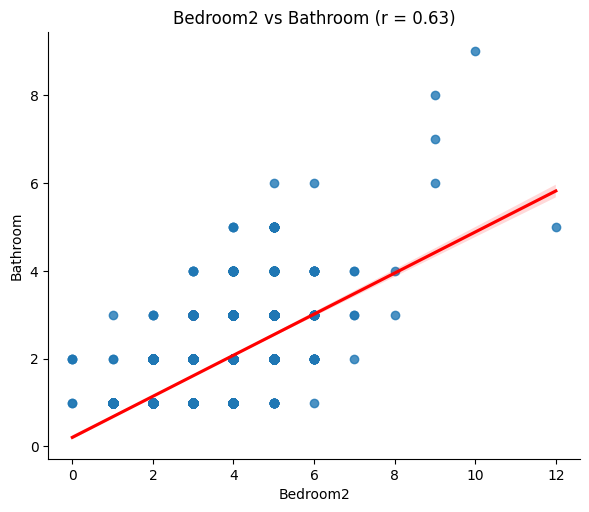

Bedroom2 vs BuildingArea: r = 0.60


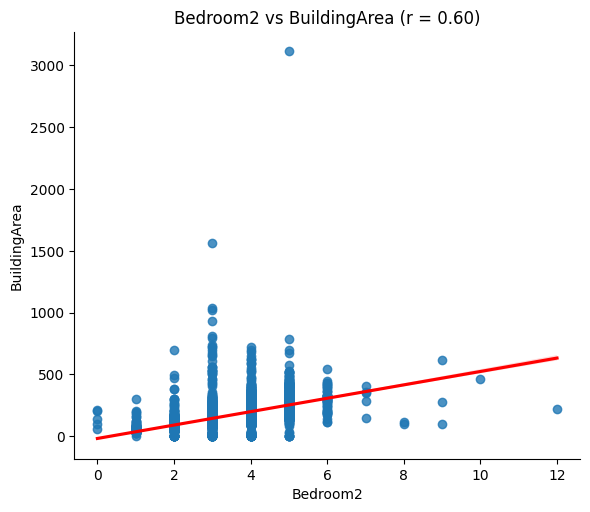

BuildingArea vs Bathroom: r = 0.55


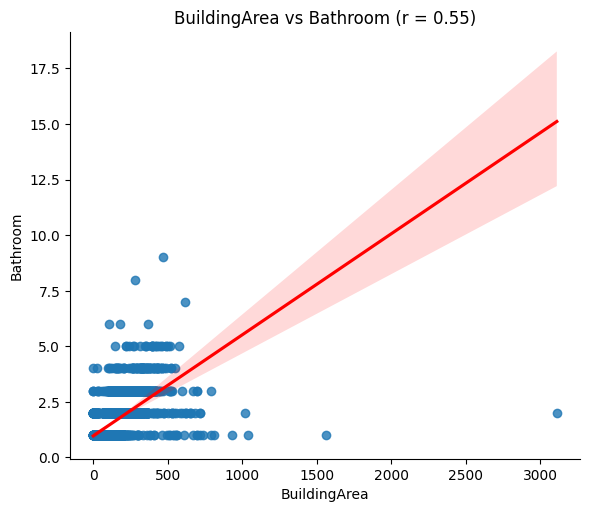

Price vs BuildingArea: r = 0.51


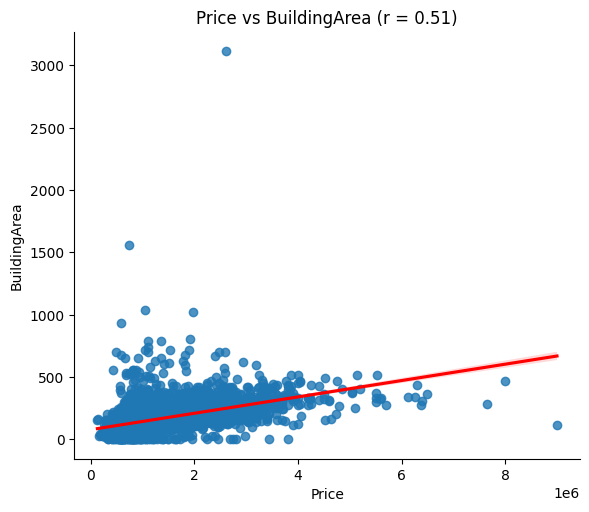

In [74]:
numeric_cols = df.select_dtypes(include='number').columns

# Correlation Matrix
corr_matrix = df[numeric_cols].corr(method='pearson')

# Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', square=True)
plt.title("Correlation Heatmap")
plt.show()

# Pairplot
sns.pairplot(df[numeric_cols], diag_kind='kde', corner=True)
plt.suptitle("Pairwise Scatter Plots", y=1.02)
plt.show()

# Optional: Regression plots for top correlations
top_corrs = corr_matrix.abs().unstack().sort_values(ascending=False)
seen = set()
print("\nTop correlated pairs (|r| > 0.7):")
for (var1, var2), corr in top_corrs.items():
    if var1 == var2 or (var2, var1) in seen:
        continue
    seen.add((var1, var2))
    if corr > 0.5:
        print(f"{var1} vs {var2}: r = {corr:.2f}")
        sns.lmplot(data=df, x=var1, y=var2, height=5, aspect=1.2, line_kws={"color": "red"})
        plt.title(f"{var1} vs {var2} (r = {corr:.2f})")
        plt.show()

In [75]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8887 entries, 2 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         8887 non-null   category      
 1   Address        8887 non-null   object        
 2   Rooms          8887 non-null   category      
 3   Type           8887 non-null   category      
 4   Price          8887 non-null   float64       
 5   Method         8887 non-null   category      
 6   SellerG        8887 non-null   category      
 7   Date           8887 non-null   datetime64[ns]
 8   Distance       8887 non-null   float64       
 9   Postcode       8887 non-null   category      
 10  Bedroom2       8887 non-null   float64       
 11  Bathroom       8887 non-null   float64       
 12  Car            8887 non-null   float64       
 13  Landsize       8887 non-null   float64       
 14  BuildingArea   8887 non-null   float64       
 15  YearBuilt      8887 non-n

In [76]:
df.describe(include='all')

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
count,8887,8887,8887.00,8887,8887.00,8887,8887,8887,8887.00,8887.00,...,8887.00,8887.00,8887.00,8887.00,8887.00,8887,8887.00,8887.00,8887,8887.00
unique,315,8764,10.00,3,NaN,5,250,NaN,NaN,194.00,...,NaN,NaN,NaN,NaN,NaN,33,NaN,NaN,8,NaN
top,Reservoir,25 William St,3.00,h,NaN,S,Nelson,NaN,NaN,3073.00,...,NaN,NaN,NaN,NaN,NaN,Boroondara City Council,NaN,NaN,Southern Metropolitan,NaN
freq,194,3,3824.00,6625,NaN,5602,986,NaN,NaN,194.00,...,NaN,NaN,NaN,NaN,NaN,810,NaN,NaN,2707,NaN
mean,NaN,NaN,NaN,NaN,1092901.63,NaN,NaN,2017-04-05 23:17:42.540790016,11.20,NaN,...,1.65,1.69,523.48,149.31,1965.75,NaN,-37.80,144.99,NaN,7475.94
min,NaN,NaN,NaN,NaN,131000.00,NaN,NaN,2016-02-04 00:00:00,0.00,NaN,...,1.00,0.00,0.00,0.00,1196.00,NaN,-38.17,144.42,NaN,249.00
25%,NaN,NaN,NaN,NaN,641000.00,NaN,NaN,2016-09-24 00:00:00,6.40,NaN,...,1.00,1.00,212.00,100.00,1945.00,NaN,-37.86,144.92,NaN,4382.50
50%,NaN,NaN,NaN,NaN,900000.00,NaN,NaN,2017-05-13 00:00:00,10.20,NaN,...,2.00,2.00,478.00,132.00,1970.00,NaN,-37.80,145.00,NaN,6567.00
75%,NaN,NaN,NaN,NaN,1345000.00,NaN,NaN,2017-09-16 00:00:00,13.90,NaN,...,2.00,2.00,652.00,180.00,2000.00,NaN,-37.75,145.06,NaN,10331.00
max,NaN,NaN,NaN,NaN,9000000.00,NaN,NaN,2018-03-17 00:00:00,47.40,NaN,...,9.00,10.00,42800.00,3112.00,2019.00,NaN,-37.41,145.53,NaN,21650.00



Price vs Method
--------------------------------------------------
         Price                                                                 \
         count       mean       std       min       25%        50%        75%   
Method                                                                          
PI     1084.00 1191086.72 781083.79 131000.00 650000.00  970000.00 1510000.00   
S      5602.00 1085888.79 649845.91 185000.00 657500.00  900000.00 1325000.00   
SA       63.00  991720.44 582593.32 240000.00 593500.00  900000.00 1250000.00   
SP     1292.00  918674.44 525221.84 250000.00 560000.00  783000.00 1125250.00   
VB      846.00 1287144.21 853606.67 200000.00 650000.00 1100000.00 1700000.00   

                   
              max  
Method             
PI     9000000.00  
S      7650000.00  
SA     3750000.00  
SP     4600000.00  
VB     8000000.00  


/tmp/ipython-input-1978/732909689.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df[[cat, num_var]].groupby(cat).describe().round(2))
/tmp/ipython-input-1978/732909689.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_sorted = df.groupby(cat)[num_var].median().sort_values().index


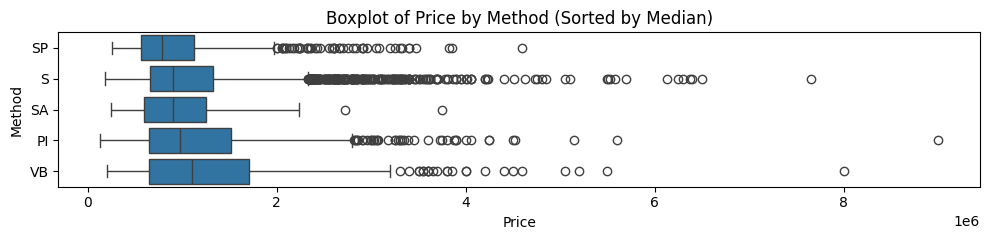


Price vs Type
--------------------------------------------------
       Price                                                                 \
       count       mean       std       min       25%        50%        75%   
Type                                                                          
h    6625.00 1230542.19 712328.25 131000.00 745500.00 1045000.00 1500000.00   
t     722.00  905321.24 390857.68 310000.00 650000.00  825000.00 1050000.00   
u    1540.00  588722.61 238853.96 170000.00 430000.00  545000.00  691000.00   

                 
            max  
Type             
h    9000000.00  
t    3820000.00  
u    2460000.00  


/tmp/ipython-input-1978/732909689.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df[[cat, num_var]].groupby(cat).describe().round(2))
/tmp/ipython-input-1978/732909689.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_sorted = df.groupby(cat)[num_var].median().sort_values().index


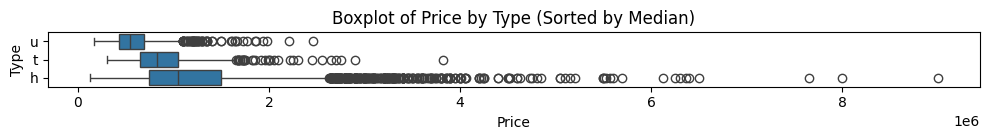


Price vs CouncilArea
--------------------------------------------------
                                Price                                  \
                                count       mean        std       min   
CouncilArea                                                             
Banyule City Council           413.00  984472.76  459968.41 360000.00   
Bayside City Council           362.00 1711756.04  812506.74 290000.00   
Boroondara City Council        810.00 1827678.69  965873.48 260000.00   
Brimbank City Council          416.00  697639.06  182217.13 185000.00   
Cardinia Shire Council          12.00  553958.33   87662.70 435000.00   
Casey City Council              35.00  685628.80  171173.09 400000.00   
Darebin City Council           729.00  931036.17  412325.69 145000.00   
Frankston City Council          87.00  695860.18  219135.84 386000.00   
Glen Eira City Council         519.00 1160517.03  523334.84 131000.00   
Greater Dandenong City Council  51.00  742682.35  1

/tmp/ipython-input-1978/732909689.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df[[cat, num_var]].groupby(cat).describe().round(2))
/tmp/ipython-input-1978/732909689.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_sorted = df.groupby(cat)[num_var].median().sort_values().index


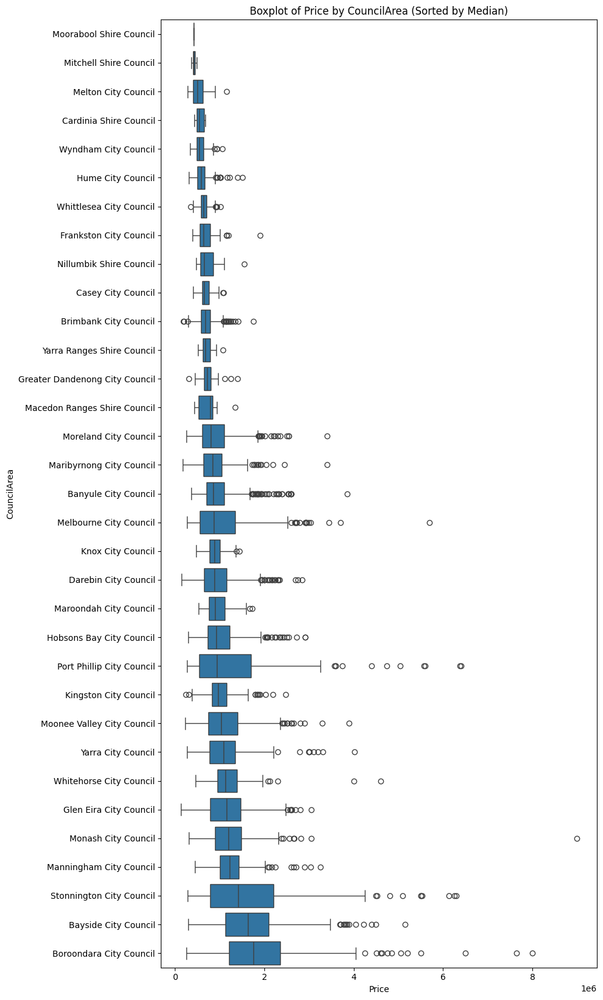


Price vs Regionname
--------------------------------------------------
                             Price                                           \
                             count       mean       std       min       25%   
Regionname                                                                    
Eastern Metropolitan        982.00 1157120.50 486605.46 360000.00 830000.00   
Eastern Victoria             51.00  661842.78 160375.57 435000.00 522500.00   
Northern Metropolitan      2612.00  877852.07 428151.56 145000.00 593625.00   
Northern Victoria            62.00  599040.32 207166.70 345000.00 438250.00   
South-Eastern Metropolitan  371.00  922715.88 527714.67 305000.00 681000.00   
Southern Metropolitan      2707.00 1493322.95 904136.79 131000.00 812500.00   
Western Metropolitan       2059.00  878367.19 420503.05 170000.00 600000.00   
Western Victoria             43.00  445802.33 120454.11 283000.00 385000.00   

                                                          

/tmp/ipython-input-1978/732909689.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df[[cat, num_var]].groupby(cat).describe().round(2))
/tmp/ipython-input-1978/732909689.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_sorted = df.groupby(cat)[num_var].median().sort_values().index


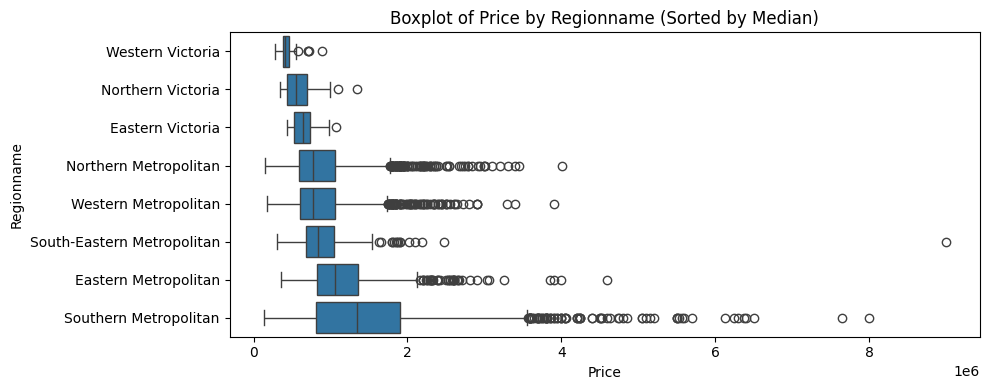

In [77]:
categorical_vars = ['Method', 'Type', 'CouncilArea', 'Regionname']
num_var = 'Price'

for cat in categorical_vars:
    print(f"\n{num_var} vs {cat}\n{'-'*50}")
    print(df[[cat, num_var]].groupby(cat).describe().round(2))

    # Sort categories by median Price
    median_sorted = df.groupby(cat)[num_var].median().sort_values().index

    # Horizontal Boxplot
    plt.figure(figsize=(10, len(median_sorted) * 0.5))
    sns.boxplot(data=df, y=cat, x=num_var, order=median_sorted)
    plt.title(f'Boxplot of {num_var} by {cat} (Sorted by Median)')
    plt.tight_layout()
    plt.show()

    # # Horizontal Violin Plot
    # plt.figure(figsize=(10, len(median_sorted) * 0.7))
    # sns.violinplot(data=df, y=cat, x=num_var, order=median_sorted, inner='quartile')
    # plt.title(f'Violin Plot of {num_var} by {cat}')
    # plt.tight_layout()
    # plt.show()


Price vs Method
--------------------------------------------------
         Price                                                                 \
         count       mean       std       min       25%        50%        75%   
Method                                                                          
PI     1084.00 1191086.72 781083.79 131000.00 650000.00  970000.00 1510000.00   
S      5602.00 1085888.79 649845.91 185000.00 657500.00  900000.00 1325000.00   
SA       63.00  991720.44 582593.32 240000.00 593500.00  900000.00 1250000.00   
SP     1292.00  918674.44 525221.84 250000.00 560000.00  783000.00 1125250.00   
VB      846.00 1287144.21 853606.67 200000.00 650000.00 1100000.00 1700000.00   

                   
              max  
Method             
PI     9000000.00  
S      7650000.00  
SA     3750000.00  
SP     4600000.00  
VB     8000000.00  


/tmp/ipython-input-1978/732909689.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df[[cat, num_var]].groupby(cat).describe().round(2))
/tmp/ipython-input-1978/732909689.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_sorted = df.groupby(cat)[num_var].median().sort_values().index


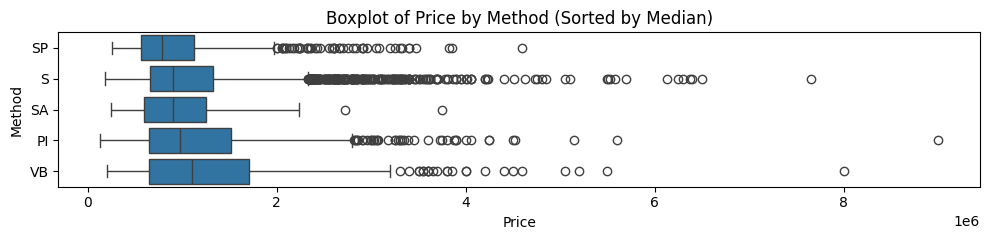


Price vs Type
--------------------------------------------------
       Price                                                                 \
       count       mean       std       min       25%        50%        75%   
Type                                                                          
h    6625.00 1230542.19 712328.25 131000.00 745500.00 1045000.00 1500000.00   
t     722.00  905321.24 390857.68 310000.00 650000.00  825000.00 1050000.00   
u    1540.00  588722.61 238853.96 170000.00 430000.00  545000.00  691000.00   

                 
            max  
Type             
h    9000000.00  
t    3820000.00  
u    2460000.00  


/tmp/ipython-input-1978/732909689.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df[[cat, num_var]].groupby(cat).describe().round(2))
/tmp/ipython-input-1978/732909689.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_sorted = df.groupby(cat)[num_var].median().sort_values().index


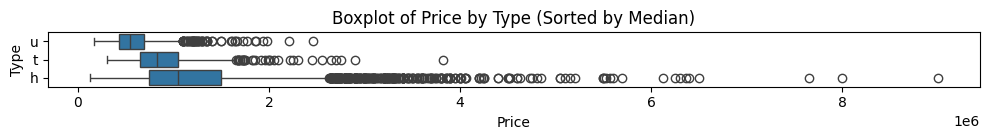


Price vs CouncilArea
--------------------------------------------------


/tmp/ipython-input-1978/732909689.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df[[cat, num_var]].groupby(cat).describe().round(2))


                                Price                                  \
                                count       mean        std       min   
CouncilArea                                                             
Banyule City Council           413.00  984472.76  459968.41 360000.00   
Bayside City Council           362.00 1711756.04  812506.74 290000.00   
Boroondara City Council        810.00 1827678.69  965873.48 260000.00   
Brimbank City Council          416.00  697639.06  182217.13 185000.00   
Cardinia Shire Council          12.00  553958.33   87662.70 435000.00   
Casey City Council              35.00  685628.80  171173.09 400000.00   
Darebin City Council           729.00  931036.17  412325.69 145000.00   
Frankston City Council          87.00  695860.18  219135.84 386000.00   
Glen Eira City Council         519.00 1160517.03  523334.84 131000.00   
Greater Dandenong City Council  51.00  742682.35  183620.44 305000.00   
Hobsons Bay City Council       289.00 1034870.93  4

/tmp/ipython-input-1978/732909689.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_sorted = df.groupby(cat)[num_var].median().sort_values().index


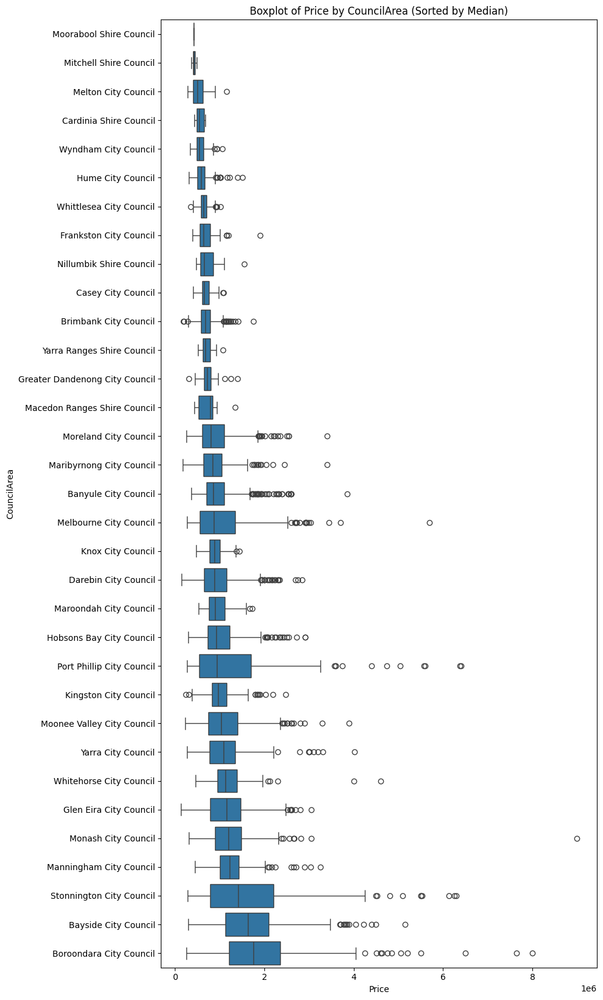


Price vs Regionname
--------------------------------------------------
                             Price                                           \
                             count       mean       std       min       25%   
Regionname                                                                    
Eastern Metropolitan        982.00 1157120.50 486605.46 360000.00 830000.00   
Eastern Victoria             51.00  661842.78 160375.57 435000.00 522500.00   
Northern Metropolitan      2612.00  877852.07 428151.56 145000.00 593625.00   
Northern Victoria            62.00  599040.32 207166.70 345000.00 438250.00   
South-Eastern Metropolitan  371.00  922715.88 527714.67 305000.00 681000.00   
Southern Metropolitan      2707.00 1493322.95 904136.79 131000.00 812500.00   
Western Metropolitan       2059.00  878367.19 420503.05 170000.00 600000.00   
Western Victoria             43.00  445802.33 120454.11 283000.00 385000.00   

                                                          

/tmp/ipython-input-1978/732909689.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df[[cat, num_var]].groupby(cat).describe().round(2))
/tmp/ipython-input-1978/732909689.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_sorted = df.groupby(cat)[num_var].median().sort_values().index


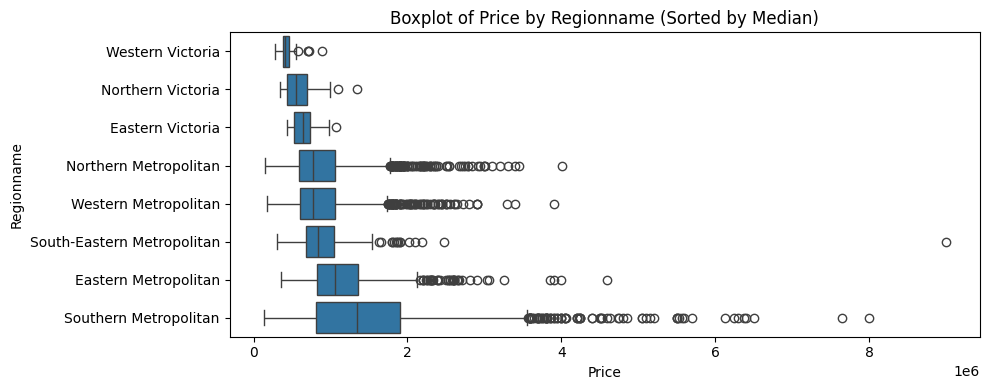

In [78]:
categorical_vars = ['Method', 'Type', 'CouncilArea', 'Regionname']
num_var = 'Price'

for cat in categorical_vars:
    print(f"\n{num_var} vs {cat}\n{'-'*50}")
    print(df[[cat, num_var]].groupby(cat).describe().round(2))

    # Sort categories by median Price
    median_sorted = df.groupby(cat)[num_var].median().sort_values().index

    # Horizontal Boxplot
    plt.figure(figsize=(10, len(median_sorted) * 0.5))
    sns.boxplot(data=df, y=cat, x=num_var, order=median_sorted)
    plt.title(f'Boxplot of {num_var} by {cat} (Sorted by Median)')
    plt.tight_layout()
    plt.show()

    # # Horizontal Violin Plot
    # plt.figure(figsize=(10, len(median_sorted) * 0.7))
    # sns.violinplot(data=df, y=cat, x=num_var, order=median_sorted, inner='quartile')
    # plt.title(f'Violin Plot of {num_var} by {cat}')
    # plt.tight_layout()
    # plt.show()

In [79]:
df['Regionname'].value_counts()

,count
Regionname,
Southern Metropolitan,2707
Northern Metropolitan,2612
Western Metropolitan,2059
Eastern Metropolitan,982
South-Eastern Metropolitan,371
Northern Victoria,62
Eastern Victoria,51
Western Victoria,43


In [80]:
df[['CouncilArea', 'Regionname']].value_counts()

,,count
CouncilArea,Regionname,
Boroondara City Council,Southern Metropolitan,793
Darebin City Council,Northern Metropolitan,729
Moreland City Council,Northern Metropolitan,621
Moonee Valley City Council,Western Metropolitan,556
Glen Eira City Council,Southern Metropolitan,519
Maribyrnong City Council,Western Metropolitan,490
Brimbank City Council,Western Metropolitan,416
Bayside City Council,Southern Metropolitan,362
Port Phillip City Council,Southern Metropolitan,329



Method vs Type
------------------------------------------------------------


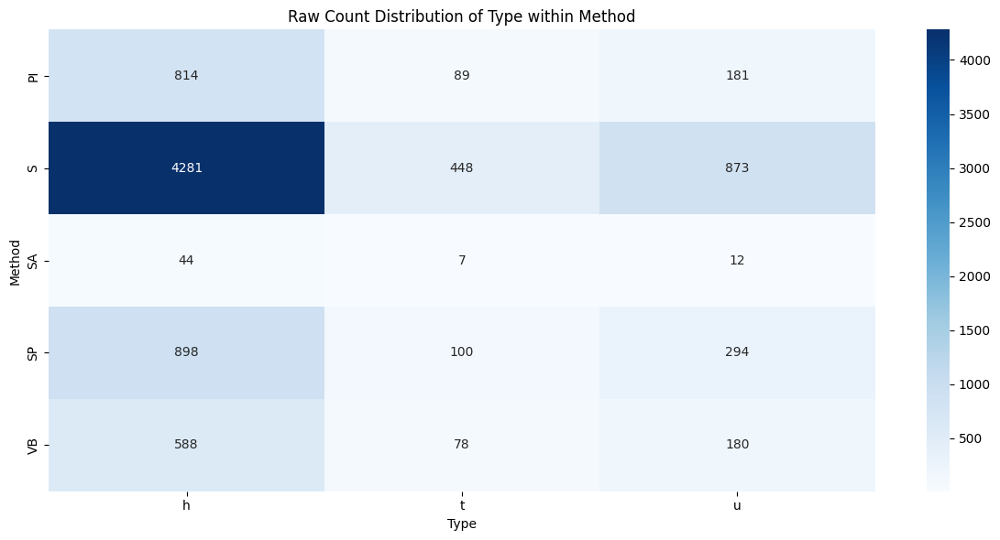

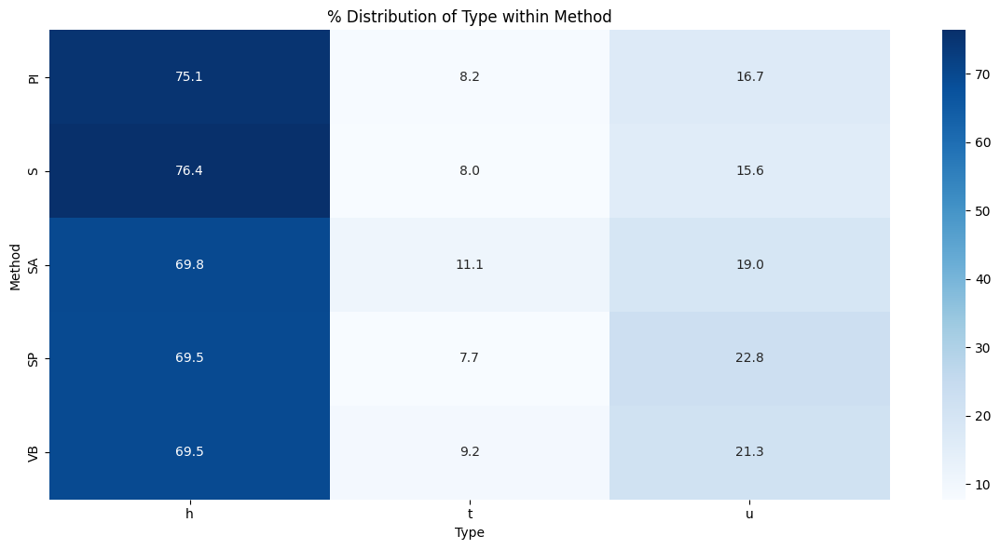

Chi² = 52.22, p = 0.0000, dof = 8
→ Significant association (p < 0.05)

Method vs CouncilArea
------------------------------------------------------------


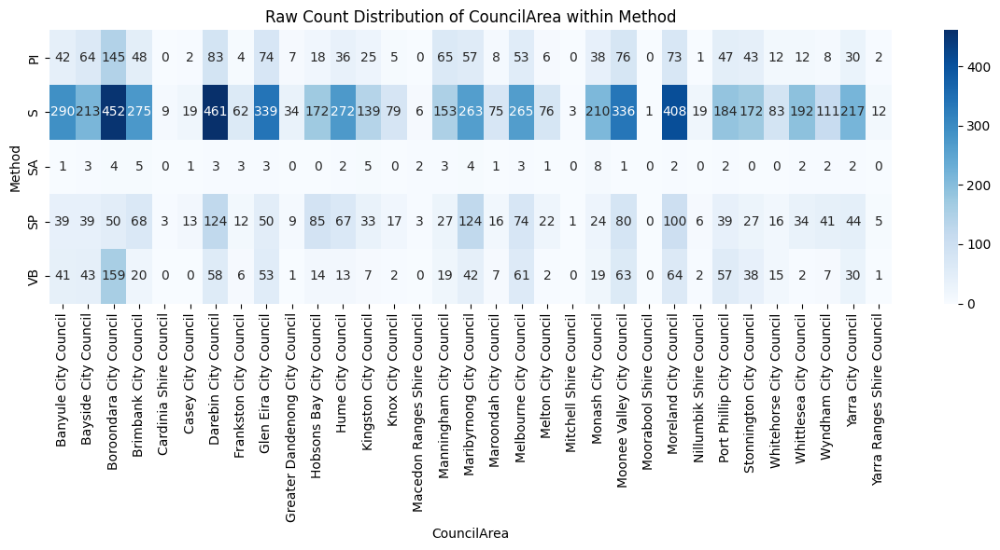

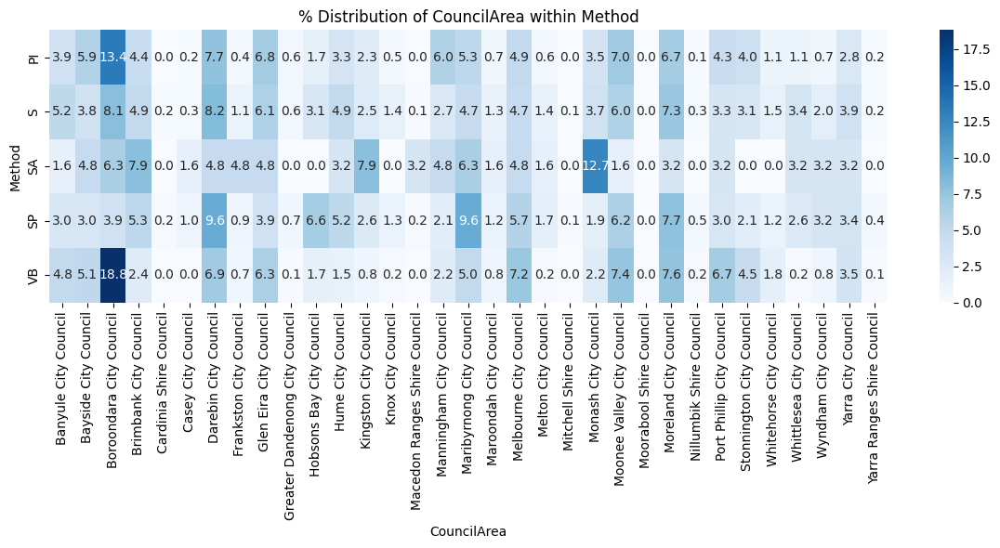

Chi² = 695.98, p = 0.0000, dof = 128
→ Significant association (p < 0.05)

Method vs Regionname
------------------------------------------------------------


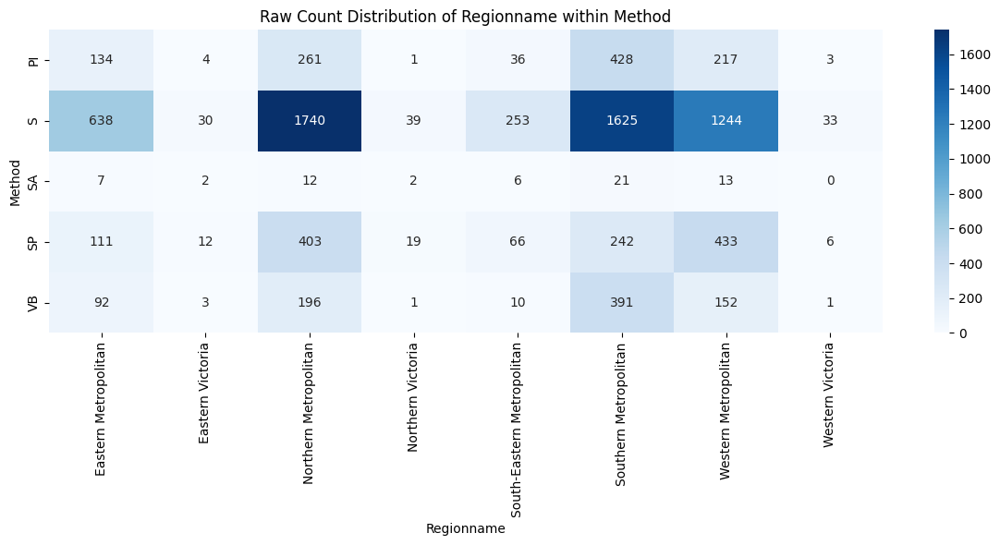

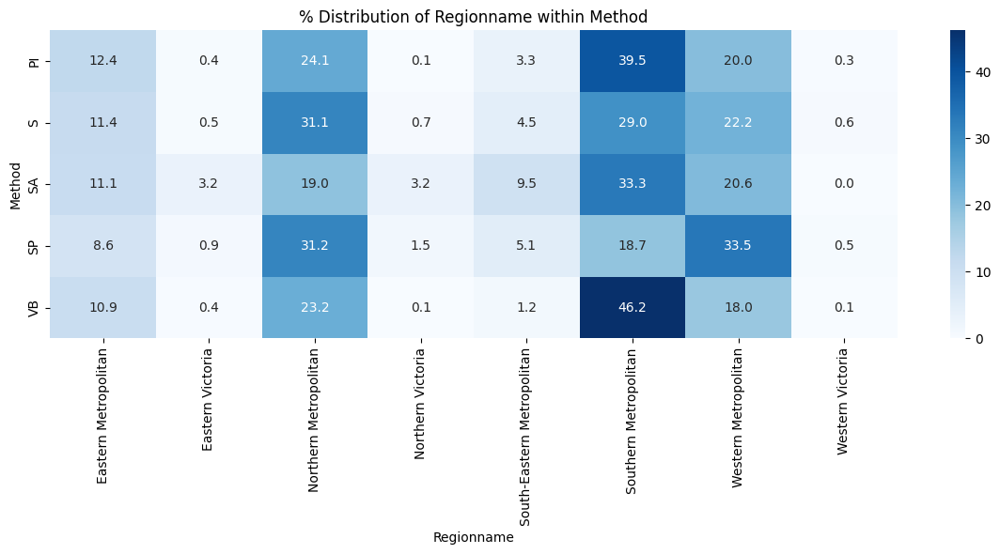

Chi² = 348.71, p = 0.0000, dof = 28
→ Significant association (p < 0.05)

Type vs CouncilArea
------------------------------------------------------------


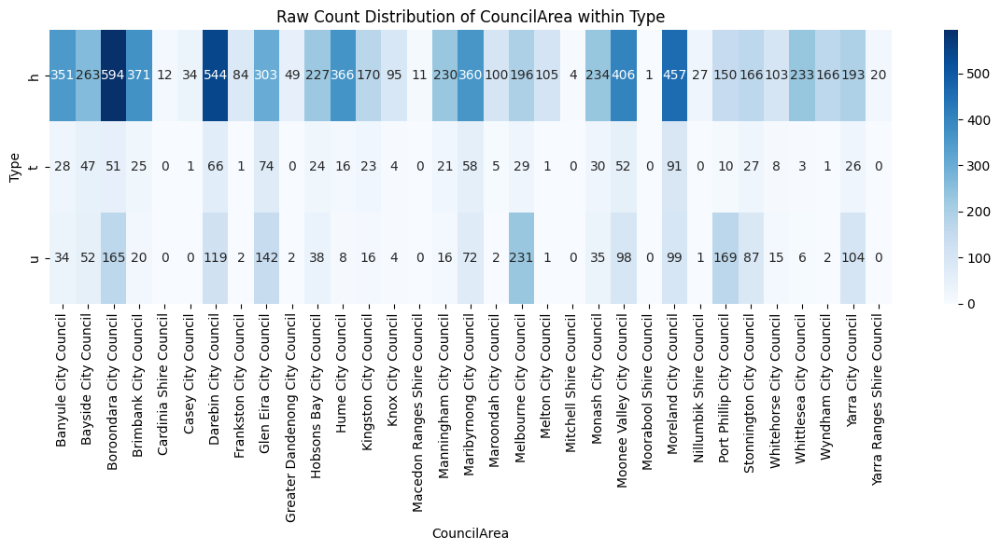

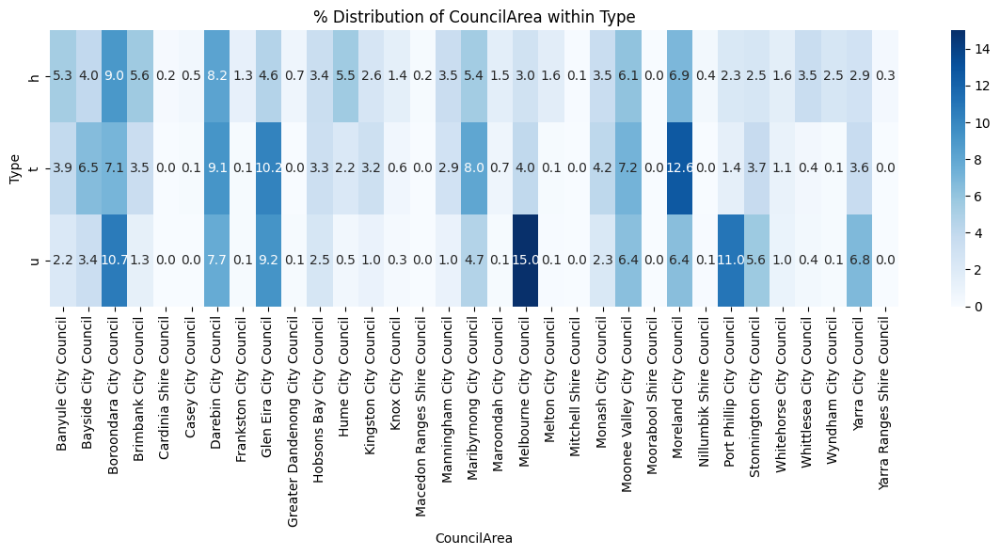

Chi² = 1310.13, p = 0.0000, dof = 64
→ Significant association (p < 0.05)

Type vs Regionname
------------------------------------------------------------


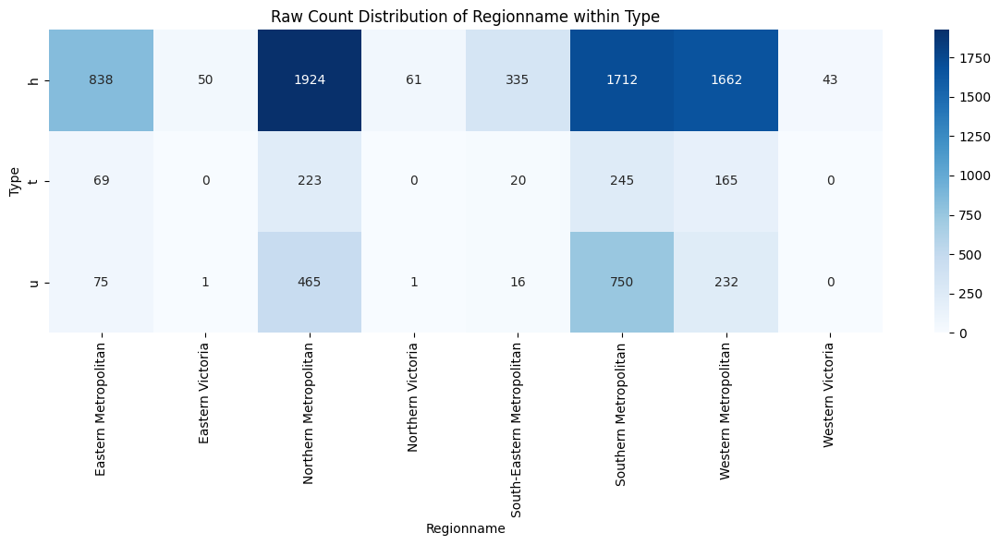

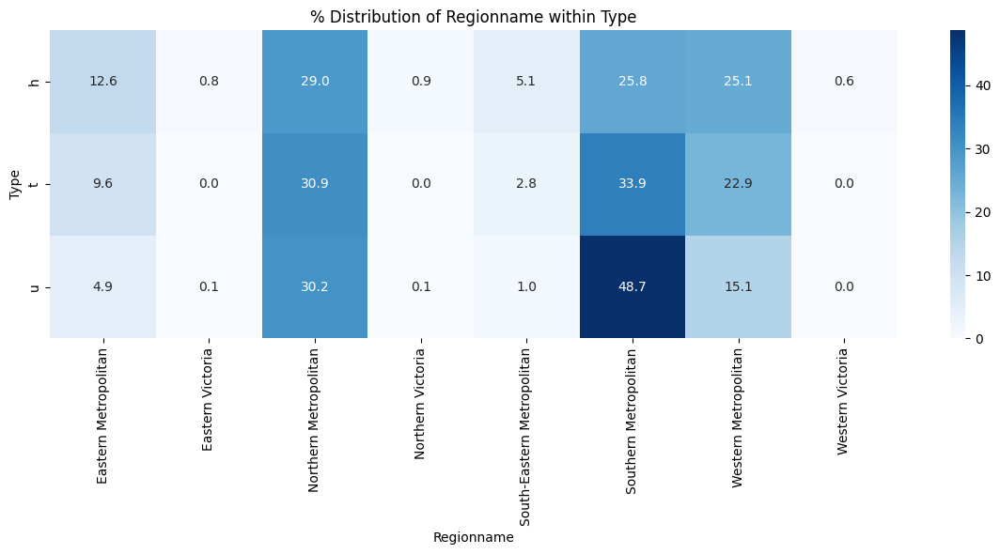

Chi² = 443.04, p = 0.0000, dof = 14
→ Significant association (p < 0.05)

CouncilArea vs Regionname
------------------------------------------------------------


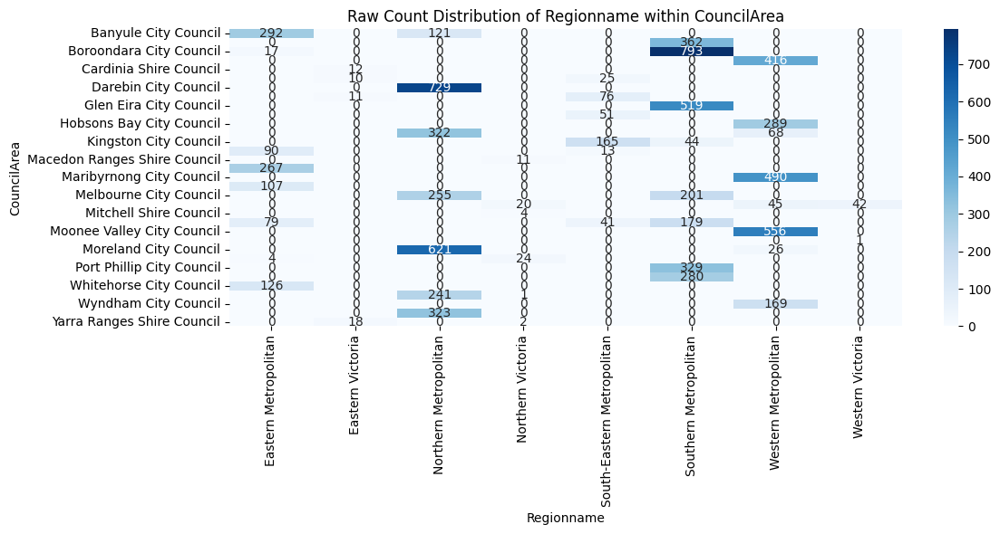

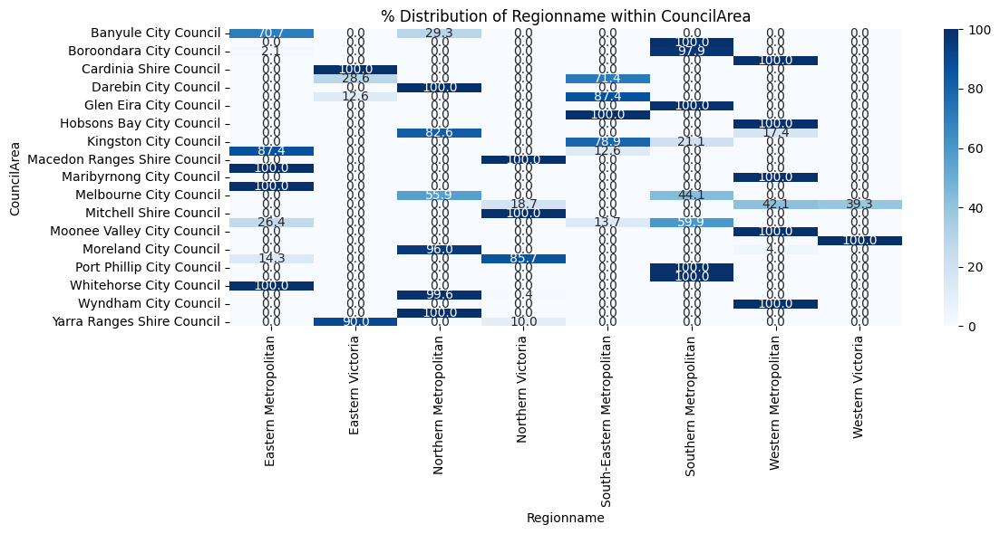

Chi² = 44353.42, p = 0.0000, dof = 224
→ Significant association (p < 0.05)


In [81]:
for var1, var2 in itertools.combinations(categorical_vars, 2):
    print(f"\n{var1} vs {var2}\n{'-'*60}")

    # Cross-tab
    ct = pd.crosstab(df[var1], df[var2])
    ct_pct = ct.div(ct.sum(axis=1), axis=0) * 100

    # Heatmap of raw counts cross-tab
    plt.figure(figsize=(12, 6))
    sns.heatmap(ct, fmt="d", annot=True, cmap="Blues")
    plt.title(f'Raw Count Distribution of {var2} within {var1}')
    plt.ylabel(var1)
    plt.xlabel(var2)
    plt.tight_layout()
    plt.show()

    # Heatmap of percentages
    plt.figure(figsize=(12, 6))
    sns.heatmap(ct_pct, annot=True, fmt=".1f", cmap="Blues")
    plt.title(f'% Distribution of {var2} within {var1}')
    plt.ylabel(var1)
    plt.xlabel(var2)
    plt.tight_layout()
    plt.show()

    # Chi-Square Test
    chi2, p, dof, ex = chi2_contingency(ct)
    print(f"Chi² = {chi2:.2f}, p = {p:.4f}, dof = {dof}")
    if p < 0.05:
        print("→ Significant association (p < 0.05)")
    else:
        print("→ No significant association")


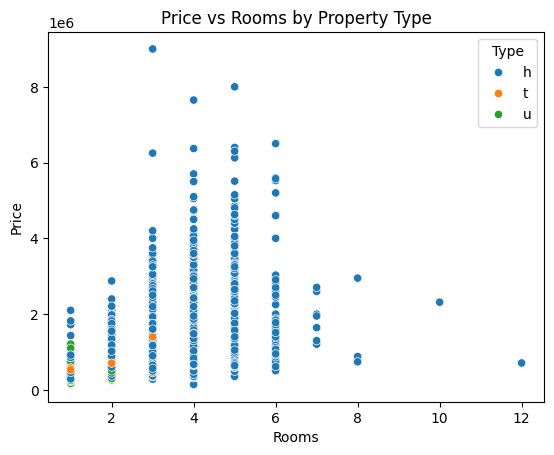

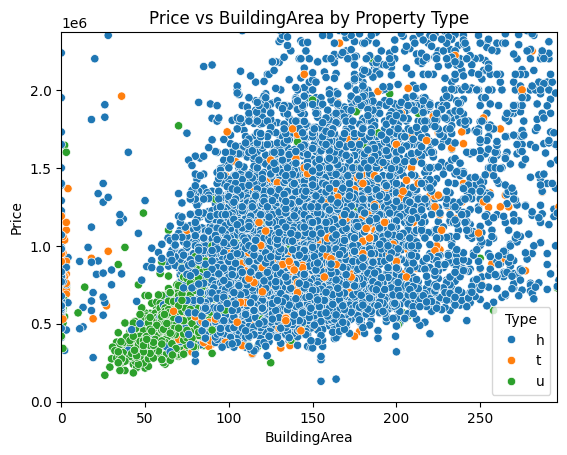

In [82]:
sns.scatterplot(data=df, x='Rooms', y='Price', hue='Type')
plt.title("Price vs Rooms by Property Type")
plt.show()

sns.scatterplot(data=df, x='BuildingArea', y='Price', hue='Type')
plt.title("Price vs BuildingArea by Property Type")
plt.xlim(0, df['BuildingArea'].quantile(0.95))  # limit outliers
plt.ylim(0, df['Price'].quantile(0.95))
plt.show()


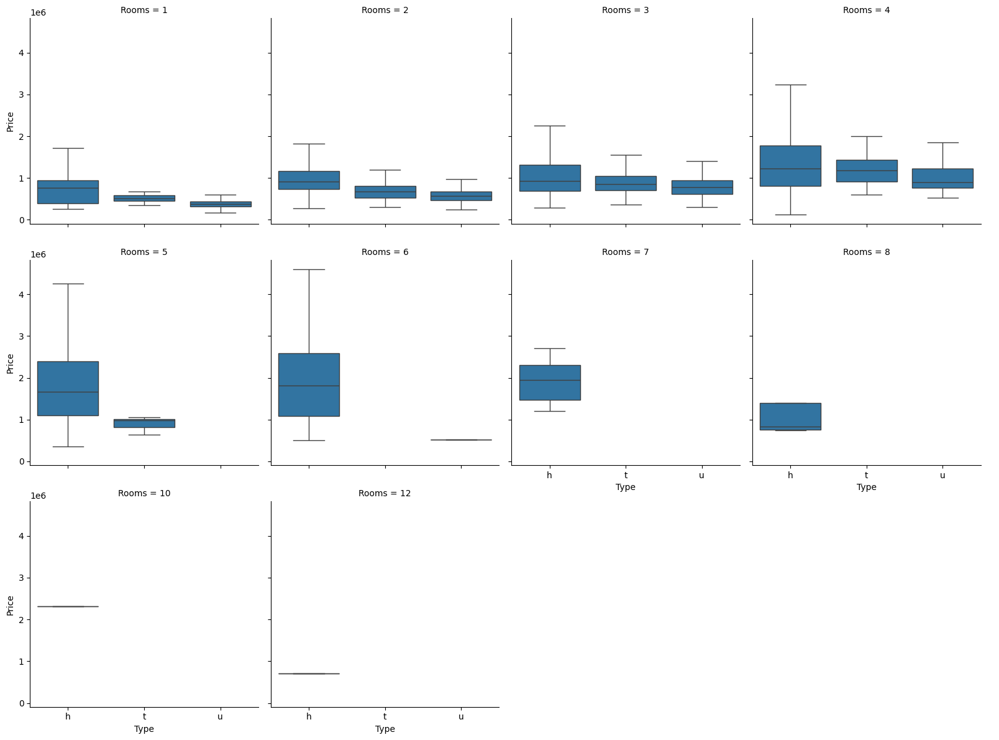

In [83]:
sns.catplot(
    data=df, x='Type', y='Price', col='Rooms',
    kind='box', col_wrap=4, height=4, showfliers=False
)

Text(0.5, 0.98, 'Price ~ BuildingArea stratified by Type and Method')

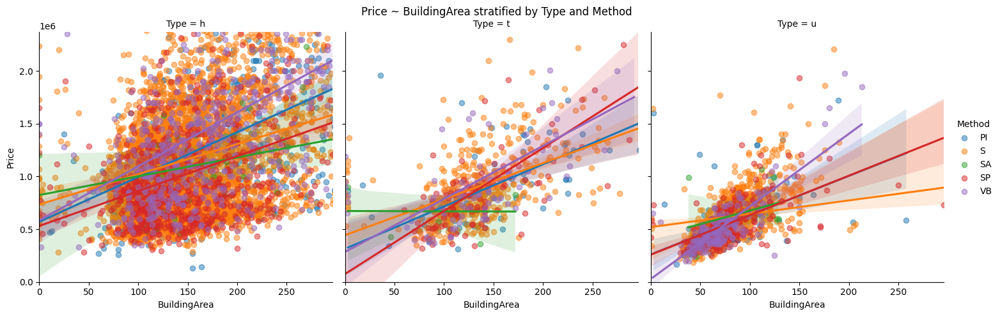

In [84]:
g = sns.lmplot(
    data=df[df['BuildingArea'].notna()],
    x='BuildingArea', y='Price',
    col='Type', hue='Method',
    height=5, scatter_kws={'alpha': 0.5},
    # line_kws={'color': 'black'}
)
g.set(xlim=(0, df['BuildingArea'].quantile(0.95)), ylim=(0, df['Price'].quantile(0.95)))
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle("Price ~ BuildingArea stratified by Type and Method")


In [85]:
group_summary = df.groupby(['Regionname', 'Type'])[['Price', 'BuildingArea']].describe().round(2)
display(group_summary)


/tmp/ipython-input-1978/720180167.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_summary = df.groupby(['Regionname', 'Type'])[['Price', 'BuildingArea']].describe().round(2)


Price                                 \
                                  count       mean       std       min   
Regionname                 Type                                          
Eastern Metropolitan       h     838.00 1226215.25 487594.62 430000.00   
                           t      69.00  838780.43 206445.74 370000.00   
                           u      75.00  677974.67 171660.44 360000.00   
Eastern Victoria           h      50.00  666139.64 159010.70 435000.00   
                           u       1.00  447000.00       NaN 447000.00   
Northern Metropolitan      h    1924.00  974916.29 436180.62 145000.00   
                           t     223.00  745406.43 260261.97 310000.00   
                           u     465.00  539752.75 220421.79 216000.00   
Northern Victoria          h      61.00  600172.13 208692.59 345000.00   
                           u       1.00  530000.00       NaN 530000.00   
South-Eastern Metropolitan h     335.00  938768.18 542873.09 400000.00   
                           t      20.00  914237.50 362060.25 386000.00   
                           u      16.00  597218.75 148657.88 305000.00   
Southern Metropolitan      h    1712.00 1908334.68 856207.70 131000.00   
                           t     245.00 1189961.22 455671.21 345000.00   
                           u     750.00  645087.66 258455.45 240000.00   
Western Metropolitan       h    1662.00  949693.99 425364.16 280000.00   
                           t     165.00  725546.67 218993.44 319000.00   
                           u     232.00  476083.81 156391.30 170000.00   
Western Victoria           h      43.00  445802.33 120454.11 283000.00   

                                                                             \
                                       25%        50%        75%        max   
Regionname                 Type                                               
Eastern Metropolitan       h     900500.00 1136000.00 1400750.00 4600000.00   
                           t     700000.00  822500.00  973500.00 1550000.00   
                           u     550750.00  650000.00  775000.00 1190000.00   
Eastern Victoria           h     538250.00  646750.00  733750.00 1075000.00   
                           u     447000.00  447000.00  447000.00  447000.00   
Northern Metropolitan      h     665000.00  860750.00 1200000.00 4011000.00   
                           t     565000.00  700000.00  892500.00 1750000.00   
                           u     407500.00  493000.00  620250.00 1935000.00   
Northern Victoria          h     438000.00  565000.00  700000.00 1350000.00   
                           u     530000.00  530000.00  530000.00  530000.00   
South-Eastern Metropolitan h     698625.00  860000.00 1050000.00 9000000.00   
                           t     751250.00  832500.00 1062000.00 1830000.00   
                           u     561250.00  606750.00  676000.00  810000.00   
Southern Metropolitan      h    1340000.00 1720000.00 2250000.00 8000000.00   
                           t     870000.00 1101000.00 1375000.00 3820000.00   
                           u     475000.00  600000.00  760000.00 2460000.00   
Western Metropolitan       h     650000.00  840000.00 1155000.00 3900000.00   
                           t     570000.00  714000.00  840000.00 1731000.00   
                           u     369375.00  450000.00  565250.00 1170000.00   
Western Victoria           h     385000.00  415000.00  458000.00  892000.00   

                                BuildingArea                              \
                                       count   mean    std    min    25%   
Regionname                 Type                                            
Eastern Metropolitan       h          838.00 182.87  83.92   0.00 128.00   
                           t           69.00 133.70  39.97   3.00 113.00   
                           u           75.00 104.63  41.25  55.00  80.00   
Eastern Victoria           h           50.00 172.19  92.9

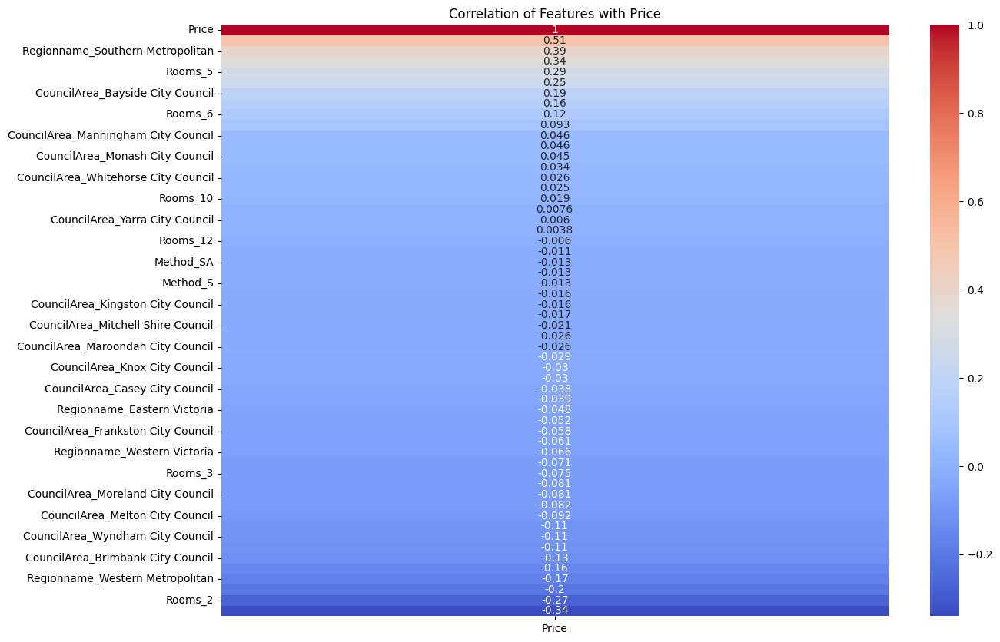

In [86]:
df_encoded = pd.get_dummies(df[['Rooms', 'BuildingArea', 'Price'] + categorical_vars], drop_first=True)
corr_matrix = df_encoded.corr()

plt.figure(figsize=(14, 10))
sns.heatmap(corr_matrix[['Price']].sort_values(by='Price', ascending=False), annot=True, cmap='coolwarm')
plt.title("Correlation of Features with Price")
plt.show()
